In [1]:
import requests
import pandas as pd
import geopy.distance
from geopy.geocoders import Nominatim
import time
from google.colab import drive

In [2]:
import pandas as pd

# File paths
file_paths = [
    "/content/osm_data_with_addresses_01_to_1265_V02.csv",
    "/content/osm_data_with_addresses_1265_to_2190_V02.csv",
    "/content/osm_data_with_addresses_2190_to_3089_v02.csv",
    "/content/osm_data_with_addresses_3089_to_3185_v02.csv",
    "/content/osm_data_with_addresses_3185_to_3286_v02.csv",
    "/content/osm_data_with_addresses_3836_to_5228.csv",
    "/content/osm_data_with_addresses_5228_to_5709_v02.csv",
    "/content/osm_data_with_addresses_5709_to_6324_v02.csv",
    "/content/osm_data_with_addresses_6324_to_.csv"
]

# Read and concatenate
df1 = pd.concat([pd.read_csv(file) for file in file_paths], ignore_index=True)


In [3]:
df1.head()

,Address,Latitude,Longitude,TspNum,TspDst,AtrNum,AtrDst,EdcNum,EdcDst,HthNum,HthDst,RstNum,RstDst,RtlNum,RtlDst
0,9327 N SWAN RD,32.259685,-110.892535,27422,6646.550215,151,6186.873607,13,4750.938579,4,5044.844664,119,6822.354356,292,7082.895521
1,9411 W COUNTY LINE RD,43.191907,-88.028056,8597,7278.698268,59,7464.160390,24,6779.871781,1,5568.951667,31,7935.282339,175,7738.078903
2,9322 N JOYCE AV,43.186555,-88.017481,10505,7259.967247,62,6930.511743,24,6699.479533,1,4673.351796,33,8143.825683,194,7675.648721
3,9360 N 85TH ST,43.187954,-88.015581,10217,7273.215906,63,6929.617437,23,6628.235133,1,4522.942771,32,8093.925612,188,7662.976584
4,9305 N BURBANK AV,43.187111,-88.015005,10452,7261.488521,64,6926.658147,24,6747.941480,1,4473.037706,33,8159.046176,192,7668.564200


In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")

# Define OSM-related columns
osm_cols = [
    'TspNum', 'TspDst', 'AtrNum', 'AtrDst', 'EdcNum', 'EdcDst',
    'HthNum', 'HthDst', 'RstNum', 'RstDst', 'RtlNum', 'RtlDst'
]

# Set up grid: 4 rows x 3 cols for 12 plots
fig, axes = plt.subplots(4, 3, figsize=(18, 16))
axes = axes.flatten()

# Plot each feature
for i, col in enumerate(osm_cols):
    if col in df1.columns:
        sns.histplot(df1[col].dropna(), kde=True, bins=30, color='cornflowerblue', ax=axes[i])
        axes[i].set_title(f"Distribution of {col}", fontsize=12)
        axes[i].set_xlabel(col)
        axes[i].set_ylabel("Frequency")
    else:
        axes[i].set_visible(False)

# Adjust layout and save
plt.tight_layout()
plt.savefig("all_osm_distributions.png", dpi=300)
plt.close()

print("✅ Saved all OSM feature distributions to 'all_osm_distributions.png'")

✅ Saved all OSM feature distributions to 'all_osm_distributions.png'


In [5]:
import numpy as np
import pandas as pd

# OSM columns from your plot
osm_cols = [
    'TspNum', 'TspDst', 'AtrNum', 'AtrDst', 'EdcNum', 'EdcDst',
    'HthNum', 'HthDst', 'RstNum', 'RstDst', 'RtlNum', 'RtlDst'
]

# Function to fix skewness
def fix_skewed_column(series):
    skew_val = series.skew()

    if skew_val > 0.5:  # Right-skewed
        return np.log1p(series)

    elif skew_val < -0.5:  # Left-skewed
        reflected = series.max() + 1 - series
        return np.log1p(reflected)

    else:
        return series  # No change needed

# Apply skewness fix
df1_skewfixed = df1.copy()
for col in osm_cols:
    if col in df1.columns:
        df1_skewfixed[col + "_fixed"] = fix_skewed_column(df1[col])

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")

# Define fixed column names
fixed_osm_cols = [col + "_fixed" for col in [
    'TspNum', 'TspDst', 'AtrNum', 'AtrDst', 'EdcNum', 'EdcDst',
    'HthNum', 'HthDst', 'RstNum', 'RstDst', 'RtlNum', 'RtlDst'
] if col + "_fixed" in df1_skewfixed.columns]

# Setup grid layout
rows = 4
cols = 3
fig, axes = plt.subplots(rows, cols, figsize=(18, 16))
axes = axes.flatten()

# Plot each skew-fixed feature
for i, col in enumerate(fixed_osm_cols):
    sns.histplot(df1_skewfixed[col].dropna(), kde=True, bins=30, color='mediumseagreen', ax=axes[i])
    axes[i].set_title(f"Distribution of {col}", fontsize=12)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Frequency")

# Hide unused subplots if any
for j in range(len(fixed_osm_cols), len(axes)):
    axes[j].set_visible(False)

# Save and close
plt.tight_layout()
plt.savefig("all_osm_fixed_distributions.png", dpi=300)
plt.close()

print("✅ Saved skewness-corrected OSM distributions to 'all_osm_fixed_distributions.png'")

✅ Saved skewness-corrected OSM distributions to 'all_osm_fixed_distributions.png'


In [6]:
# prompt: read df2 from /content/armslengthsales_2022_valid_20230404 (1).csv

df2 = pd.read_csv("/content/armslengthsales_2022_valid_20230404.csv")


In [7]:
df2_residential = df2[df2["PropType"] == "Residential"].copy()

In [ ]:
df2.columns

Index(['PropertyID', 'PropType', 'taxkey', 'Address', 'CondoProject',
       'District', 'nbhd', 'Style', 'Extwall', 'Stories', 'Year_Built',
       'Rooms', 'FinishedSqft', 'Units', 'Bdrms', 'Fbath', 'Hbath', 'Lotsize',
       'Sale_date', 'Sale_price'],
      dtype='object')

In [ ]:
df2.isnull().sum()

,0
PropertyID,0
PropType,0
taxkey,0
Address,0
CondoProject,6261
District,0
nbhd,0
Style,21
Extwall,926
Stories,39


In [8]:
# Copy the DataFrame
df_clean = df2_residential.copy()

# Categorical columns: fill with mode
categorical_cols = ["Style", "Extwall"]
for col in categorical_cols:
    df_clean[col] = df_clean[col].fillna(df_clean[col].mode()[0])

# Numeric columns to fill with median
median_cols = ["Stories", "Year_Built", "Rooms", "Bdrms"]
for col in median_cols:
    df_clean[col] = df_clean[col].fillna(df_clean[col].median())

# Numeric columns to fill with mean
mean_cols = ["FinishedSqft"]
for col in mean_cols:
    df_clean[col] = df_clean[col].fillna(df_clean[col].mean())

# Final null check
print("✅ Nulls after cleaning:")
df_clean.isnull().sum()

✅ Nulls after cleaning:


,0
PropertyID,0
PropType,0
taxkey,0
Address,0
CondoProject,5774
District,0
nbhd,0
Style,0
Extwall,0
Stories,0


In [9]:
# Merge on Address
combined_df = pd.merge(df1_skewfixed, df_clean, on="Address", how="inner")

# Optional: check result
print("✅ Combined DataFrame shape:", combined_df.shape)
combined_df.columns

✅ Combined DataFrame shape: (6005, 46)


Index(['Address', 'Latitude', 'Longitude', 'TspNum', 'TspDst', 'AtrNum',
       'AtrDst', 'EdcNum', 'EdcDst', 'HthNum', 'HthDst', 'RstNum', 'RstDst',
       'RtlNum', 'RtlDst', 'TspNum_fixed', 'TspDst_fixed', 'AtrNum_fixed',
       'AtrDst_fixed', 'EdcNum_fixed', 'EdcDst_fixed', 'HthNum_fixed',
       'HthDst_fixed', 'RstNum_fixed', 'RstDst_fixed', 'RtlNum_fixed',
       'RtlDst_fixed', 'PropertyID', 'PropType', 'taxkey', 'CondoProject',
       'District', 'nbhd', 'Style', 'Extwall', 'Stories', 'Year_Built',
       'Rooms', 'FinishedSqft', 'Units', 'Bdrms', 'Fbath', 'Hbath', 'Lotsize',
       'Sale_date', 'Sale_price'],
      dtype='object')

In [ ]:
from scipy.stats import f_oneway

grouped = combined_df.groupby('Style')['Sale_price']
groups = [group for name, group in grouped]
f_stat, p_val = f_oneway(*groups)

print(f"ANOVA p-value for Style = {p_val}")

ANOVA p-value for Style = 4.4852764789123616e-191


<Axes: xlabel='Style', ylabel='Sale_price'>

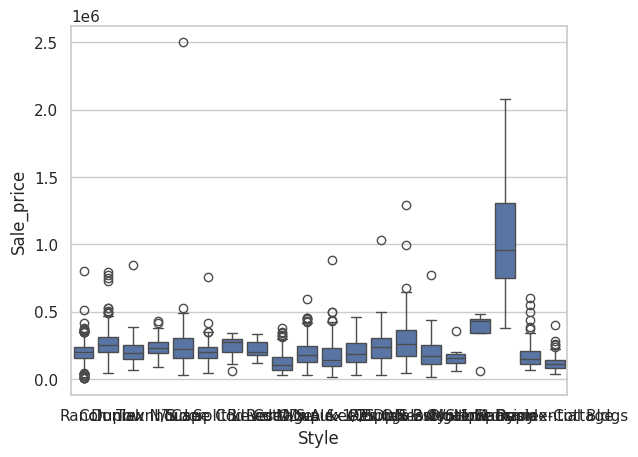

In [ ]:
import seaborn as sns
sns.boxplot(data=combined_df, x='Style', y='Sale_price')

In [ ]:
numeric_cols = combined_df.select_dtypes(include=['int64', 'float64']).columns
combined_df[numeric_cols].corr()['Sale_price'].sort_values(ascending=False)

,Sale_price
Sale_price,1.000000
Sale_price_adjusted,0.978989
Sale_price_scaled,0.978989
FinishedSqft,0.306505
PropertyID,0.286289
nbhd,0.281697
taxkey,0.279073
Fbath,0.256132
TspDst,0.245909
District,0.242500


In [ ]:
from scipy.stats import f_oneway

cat_cols = combined_df.select_dtypes(include='object').columns

for col in cat_cols:
    try:
        groups = [group['Sale_price'].dropna() for _, group in combined_df.groupby(col)]
        if len(groups) > 1:
            f_stat, p_val = f_oneway(*groups)
            print(f"{col}: p-value = {p_val}")
    except:
        continue

Address: p-value = 0.0
Style: p-value = 4.4852764789123616e-191
Extwall: p-value = 5.83778615119167e-69
Sale_date: p-value = 0.0011231427327325644


In [ ]:
combined_df['Style'].unique()

array(['Ranch', 'Colonial', 'Duplex N/S', 'Townhouse', 'Tudor',
       'Cape Cod', 'Split Level', 'Bi-Level', 'Cottage',
       'Res O/S A & 1/2', 'Duplex O/S', 'Milwaukee Bungalow', 'Triplex',
       'Res O/S 2sty +', 'Dplx Bungalow', 'Res O/S 1 Story',
       'Contemporary', 'Mansion', 'Multiple Residential Bldgs',
       'Duplex-Cottage'], dtype=object)

In [ ]:
for style, group in combined_df.groupby('Style'):
    corr = group[['FinishedSqft', 'Sale_price']].corr().iloc[0, 1]
    print(f"Style: {style} — Correlation with FinishedSqft: {corr:.2f}")

Style: Bi-Level — Correlation with FinishedSqft: 0.68
Style: Cape Cod — Correlation with FinishedSqft: 0.44
Style: Colonial — Correlation with FinishedSqft: 0.58
Style: Contemporary — Correlation with FinishedSqft: 0.98
Style: Cottage — Correlation with FinishedSqft: 0.48
Style: Dplx Bungalow — Correlation with FinishedSqft: 0.09
Style: Duplex N/S — Correlation with FinishedSqft: 0.24
Style: Duplex O/S — Correlation with FinishedSqft: 0.08
Style: Duplex-Cottage — Correlation with FinishedSqft: 0.22
Style: Mansion — Correlation with FinishedSqft: 0.48
Style: Milwaukee Bungalow — Correlation with FinishedSqft: 0.40
Style: Multiple Residential Bldgs — Correlation with FinishedSqft: 0.58
Style: Ranch — Correlation with FinishedSqft: 0.49
Style: Res O/S 1 Story — Correlation with FinishedSqft: 0.29
Style: Res O/S 2sty + — Correlation with FinishedSqft: 0.55
Style: Res O/S A & 1/2 — Correlation with FinishedSqft: 0.24
Style: Split Level — Correlation with FinishedSqft: 0.54
Style: Townhouse 

In [10]:
numerical_features = [
    'FinishedSqft', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'Rooms', 'Bdrms', 'Lotsize', 'TspDst', 'EdcDst', 'Latitude'
]

# Loop through each Style and print significant correlations
for style, group in combined_df.groupby('Style'):
    print(f"\n--- Style: {style} ---")
    has_printed = False
    for feature in numerical_features:
        try:
            corr = group[[feature, 'Sale_price']].corr().iloc[0, 1]
            # if abs(corr) > 0.2:
            print(f"{feature}: correlation = {corr:.3f}")
            has_printed = True
        except:
            continue
    if not has_printed:
        print("No significant correlations found.")


--- Style: Bi-Level ---
FinishedSqft: correlation = 0.677
Fbath: correlation = 0.435
Hbath: correlation = -0.555
Stories: correlation = nan
Year_Built: correlation = -0.483
Rooms: correlation = 0.473
Bdrms: correlation = 0.424
Lotsize: correlation = 0.675
TspDst: correlation = 0.584
EdcDst: correlation = -0.236
Latitude: correlation = 0.510

--- Style: Cape Cod ---
FinishedSqft: correlation = 0.443
Fbath: correlation = 0.339
Hbath: correlation = 0.087
Stories: correlation = 0.254
Year_Built: correlation = 0.148
Rooms: correlation = 0.097
Bdrms: correlation = 0.081
Lotsize: correlation = 0.091
TspDst: correlation = 0.212
EdcDst: correlation = 0.218
Latitude: correlation = 0.144

--- Style: Colonial ---
FinishedSqft: correlation = 0.578
Fbath: correlation = 0.490
Hbath: correlation = 0.237
Stories: correlation = 0.037
Year_Built: correlation = 0.222
Rooms: correlation = 0.220
Bdrms: correlation = 0.240
Lotsize: correlation = 0.175
TspDst: correlation = 0.232
EdcDst: correlation = 0.114


In [ ]:
# Step 1: Count number of records per Style
style_counts = combined_df['Style'].value_counts()
print(style_counts)

# Step 2: Select only styles with significant data (e.g., >= 100)
min_required = 100  # You can adjust this threshold
valid_styles = style_counts[style_counts >= min_required].index

# Step 3: Filter the dataset
filtered_df = combined_df[combined_df['Style'].isin(valid_styles)]

print(f"\nSelected styles (>= {min_required} records):")
print(valid_styles.tolist())
print(f"\nFiltered dataset shape: {filtered_df.shape}")

Style
Ranch                         1798
Cape Cod                      1179
Milwaukee Bungalow             475
Res O/S A & 1/2                442
Duplex O/S                     417
Duplex N/S                     405
Dplx Bungalow                  361
Colonial                       304
Cottage                        144
Res O/S 2sty +                 121
Duplex-Cottage                  71
Triplex                         65
Townhouse                       62
Multiple Residential Bldgs      52
Tudor                           38
Split Level                     30
Res O/S 1 Story                 23
Bi-Level                        10
Mansion                          4
Contemporary                     4
Name: count, dtype: int64

Selected styles (>= 100 records):
['Ranch', 'Cape Cod', 'Milwaukee Bungalow', 'Res O/S A & 1/2', 'Duplex O/S', 'Duplex N/S', 'Dplx Bungalow', 'Colonial', 'Cottage', 'Res O/S 2sty +']

Filtered dataset shape: (5646, 48)


In [ ]:
min_required = 100
valid_styles = style_counts[style_counts >= min_required].index
filtered_df = combined_df[combined_df['Style'].isin(valid_styles)]

print("Selected styles for separate modeling:")
print(valid_styles.tolist())

Selected styles for separate modeling:
['Ranch', 'Cape Cod', 'Milwaukee Bungalow', 'Res O/S A & 1/2', 'Duplex O/S', 'Duplex N/S', 'Dplx Bungalow', 'Colonial', 'Cottage', 'Res O/S 2sty +']



--- Style: Ranch ---
R² Train: 0.676
R² Test:  0.509


<ipython-input-161-613f1eccf0a3>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


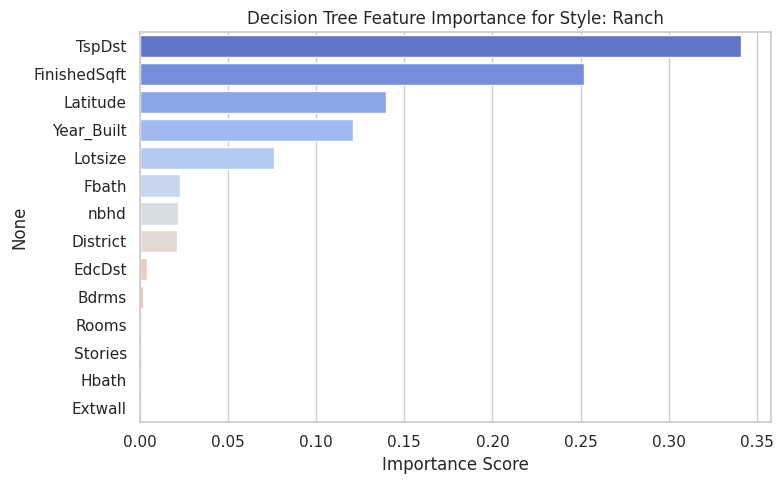


--- Style: Cape Cod ---
R² Train: 0.707
R² Test:  0.225


<ipython-input-161-613f1eccf0a3>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


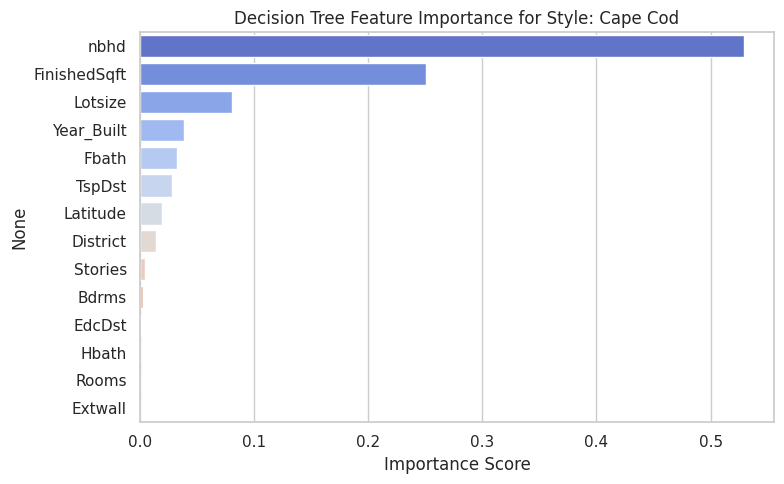


--- Style: Milwaukee Bungalow ---
R² Train: 0.828
R² Test:  0.751


<ipython-input-161-613f1eccf0a3>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


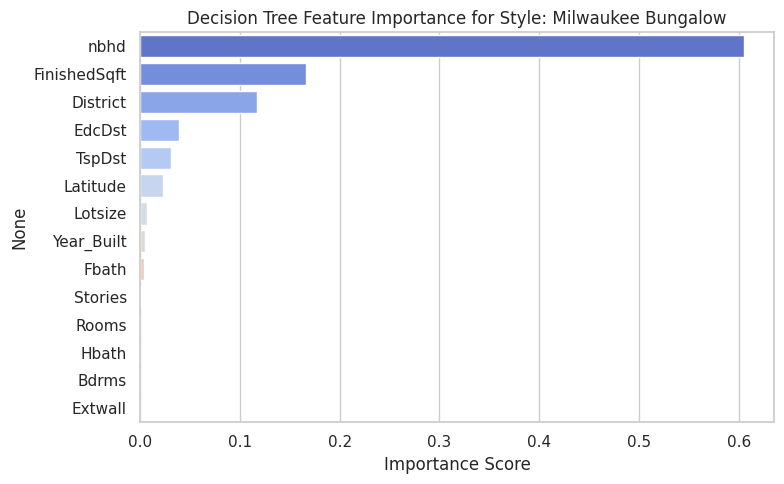


--- Style: Res O/S A & 1/2 ---
R² Train: 0.714
R² Test:  0.384


<ipython-input-161-613f1eccf0a3>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


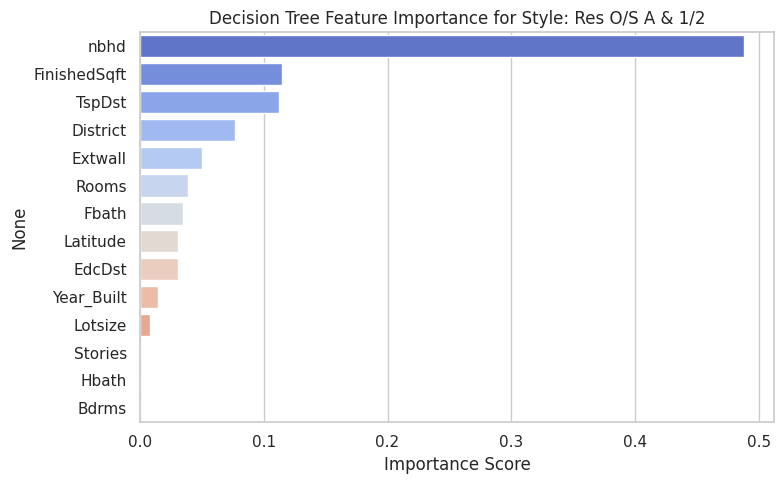


--- Style: Duplex O/S ---
R² Train: 0.802
R² Test:  0.355


<ipython-input-161-613f1eccf0a3>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


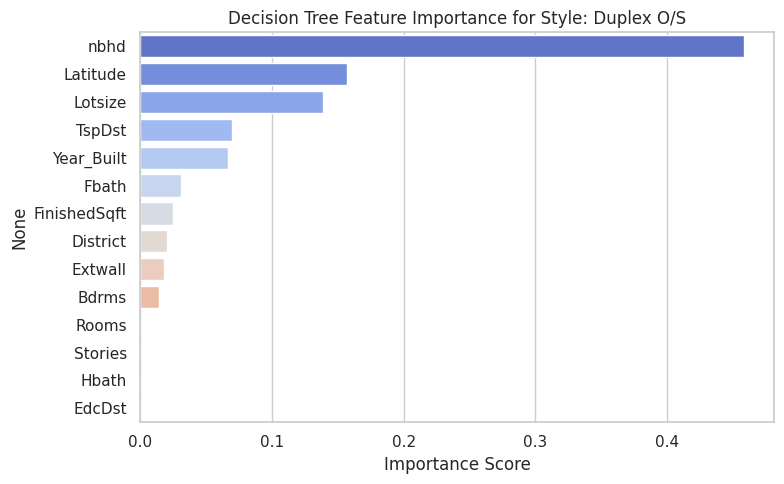


--- Style: Duplex N/S ---
R² Train: 0.810
R² Test:  0.498


<ipython-input-161-613f1eccf0a3>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


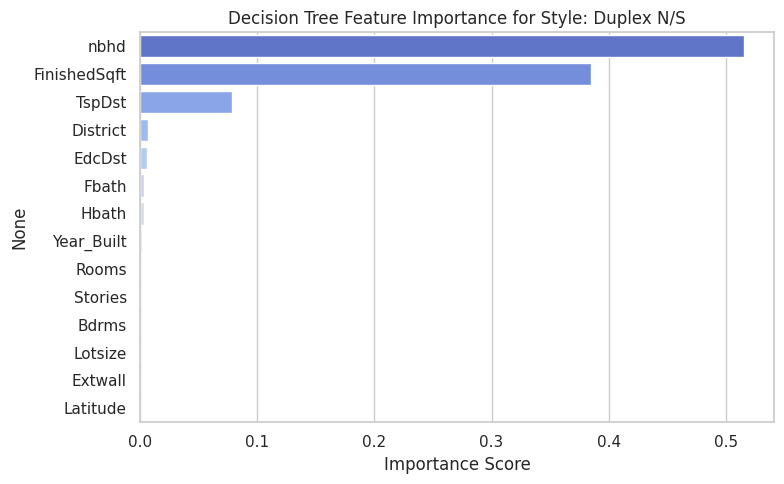


--- Style: Dplx Bungalow ---
R² Train: 0.854
R² Test:  0.570


<ipython-input-161-613f1eccf0a3>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


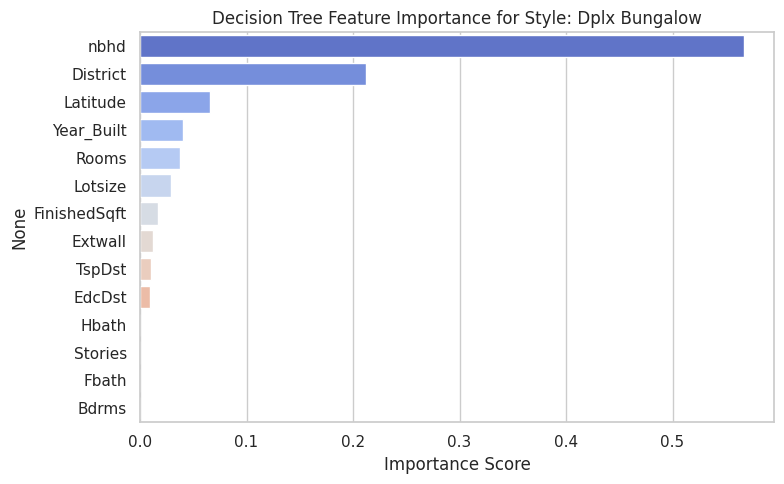


--- Style: Colonial ---
R² Train: 0.818
R² Test:  0.347


<ipython-input-161-613f1eccf0a3>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


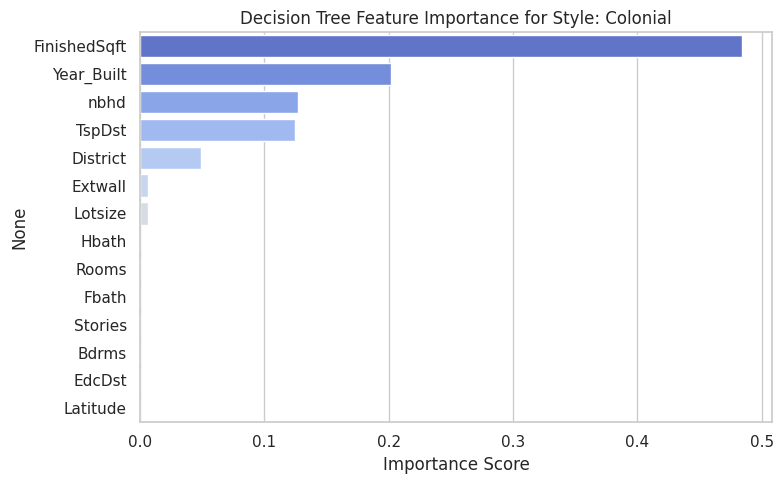


--- Style: Cottage ---
R² Train: 0.871
R² Test:  -0.419


<ipython-input-161-613f1eccf0a3>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


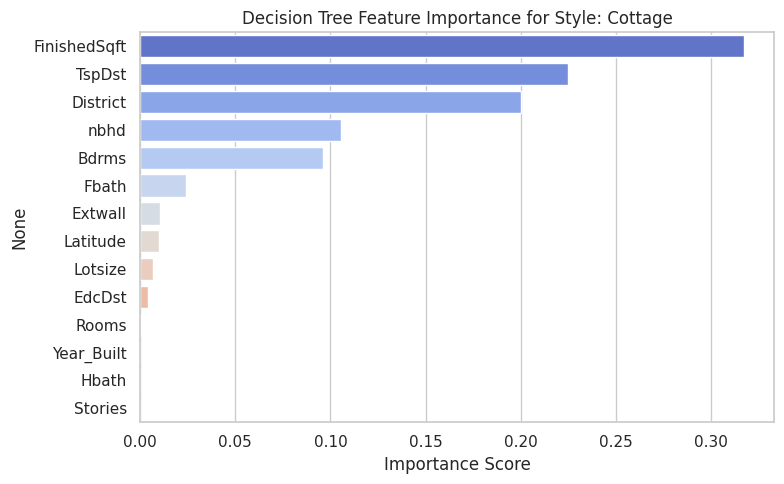


--- Style: Res O/S 2sty + ---
R² Train: 0.894
R² Test:  0.515


<ipython-input-161-613f1eccf0a3>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


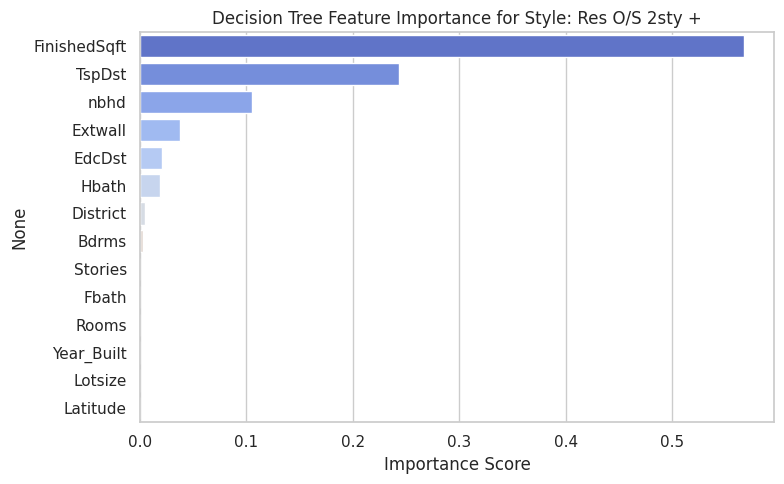

In [ ]:
import pandas as pd
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns

# Filter valid styles (≥100 rows)
min_required = 100
style_counts = combined_df['Style'].value_counts()
valid_styles = style_counts[style_counts >= min_required].index
filtered_df = combined_df[combined_df['Style'].isin(valid_styles)]

# Label encode categorical variables
df = filtered_df.copy()
label_encoders = {}
for col in ['Style', 'Extwall', 'District', 'nbhd']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))
    label_encoders[col] = le

# Define features and target
features = [
    'FinishedSqft', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'Rooms', 'Bdrms', 'Lotsize', 'TspDst', 'EdcDst', 'Latitude',
    'Extwall', 'District', 'nbhd'
]
target = 'Sale_price'

# Train a Decision Tree for each style
for style in valid_styles:
    print(f"\n--- Style: {style} ---")
    style_code = label_encoders['Style'].transform([style])[0]
    df_style = df[df['Style'] == style_code]

    X = df_style[features]
    y = df_style[target]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    model = DecisionTreeRegressor(max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    r2_train = r2_score(y_train, model.predict(X_train))
    r2_test = r2_score(y_test, model.predict(X_test))

    print(f"R² Train: {r2_train:.3f}")
    print(f"R² Test:  {r2_test:.3f}")

    # Plot feature importance
    importances = pd.Series(model.feature_importances_, index=features).sort_values(ascending=False)
    plt.figure(figsize=(8, 5))
    sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')
    plt.title(f'Decision Tree Feature Importance for Style: {style}')
    plt.xlabel('Importance Score')
    plt.tight_layout()
    plt.show()

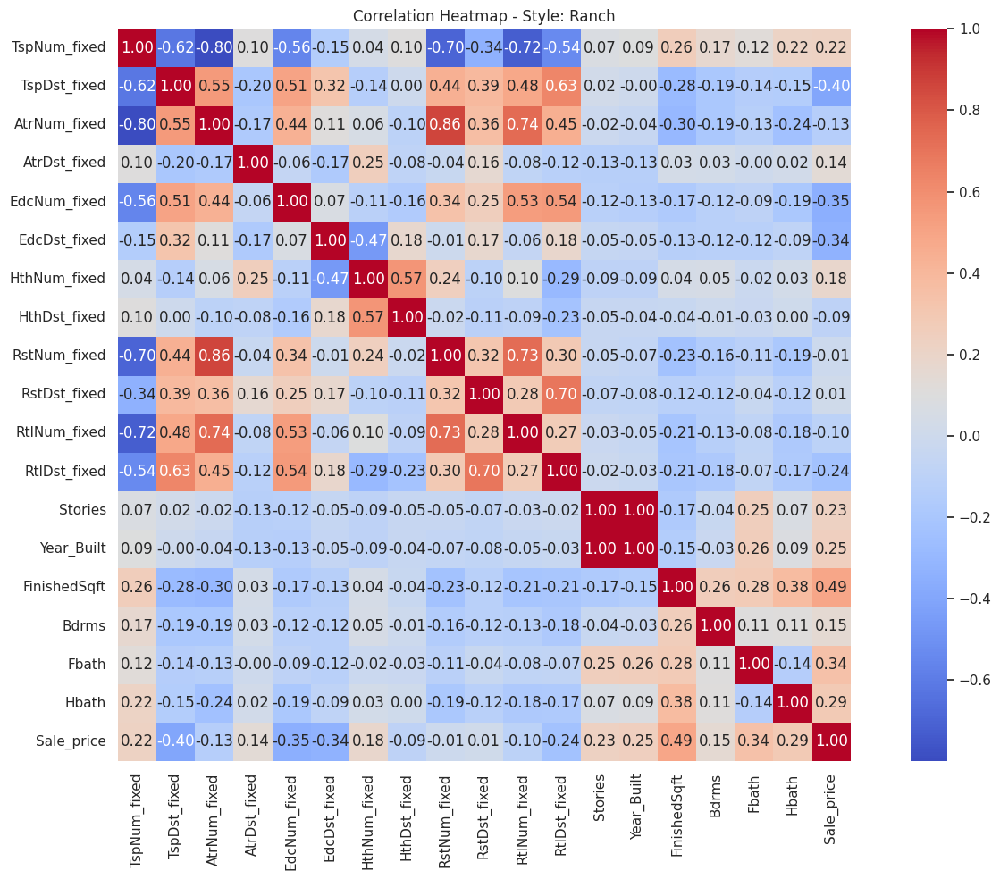

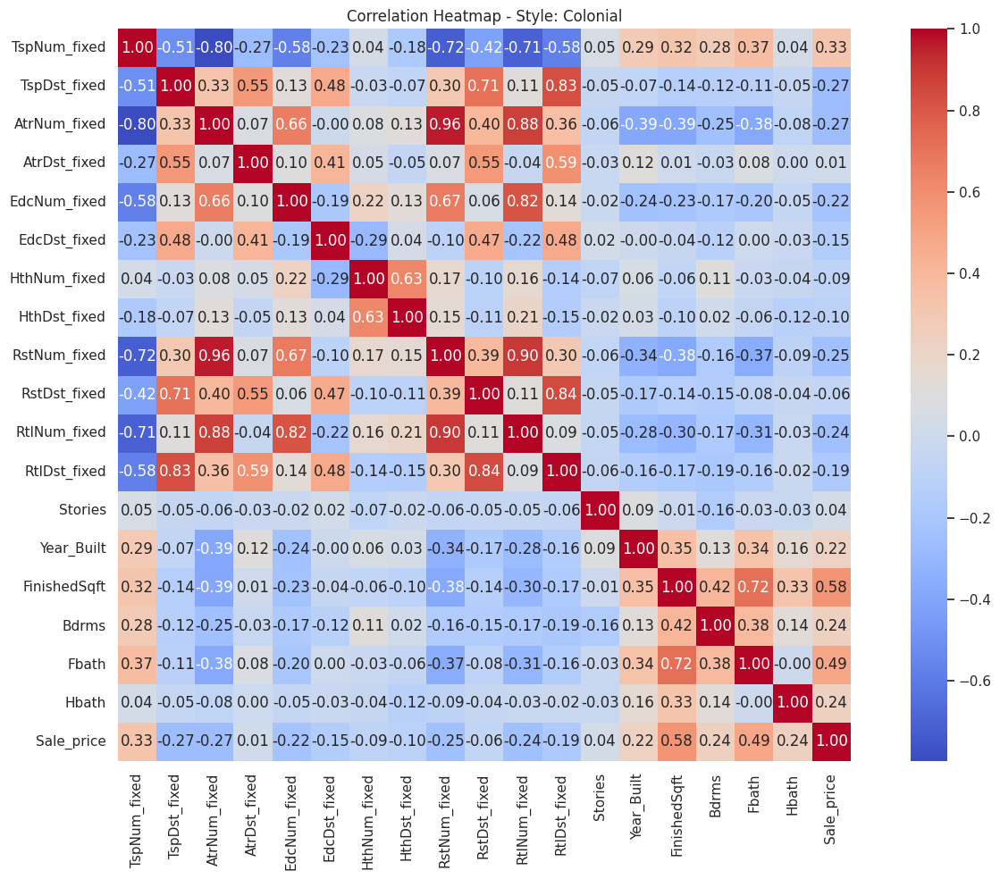

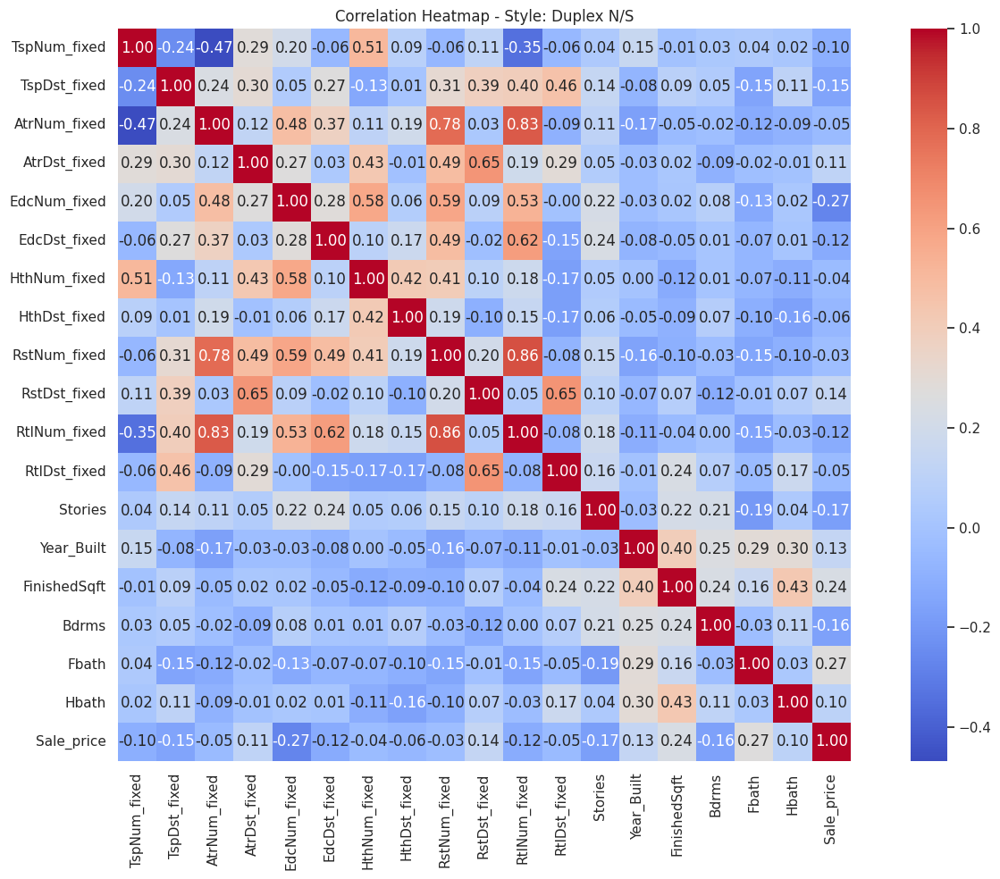

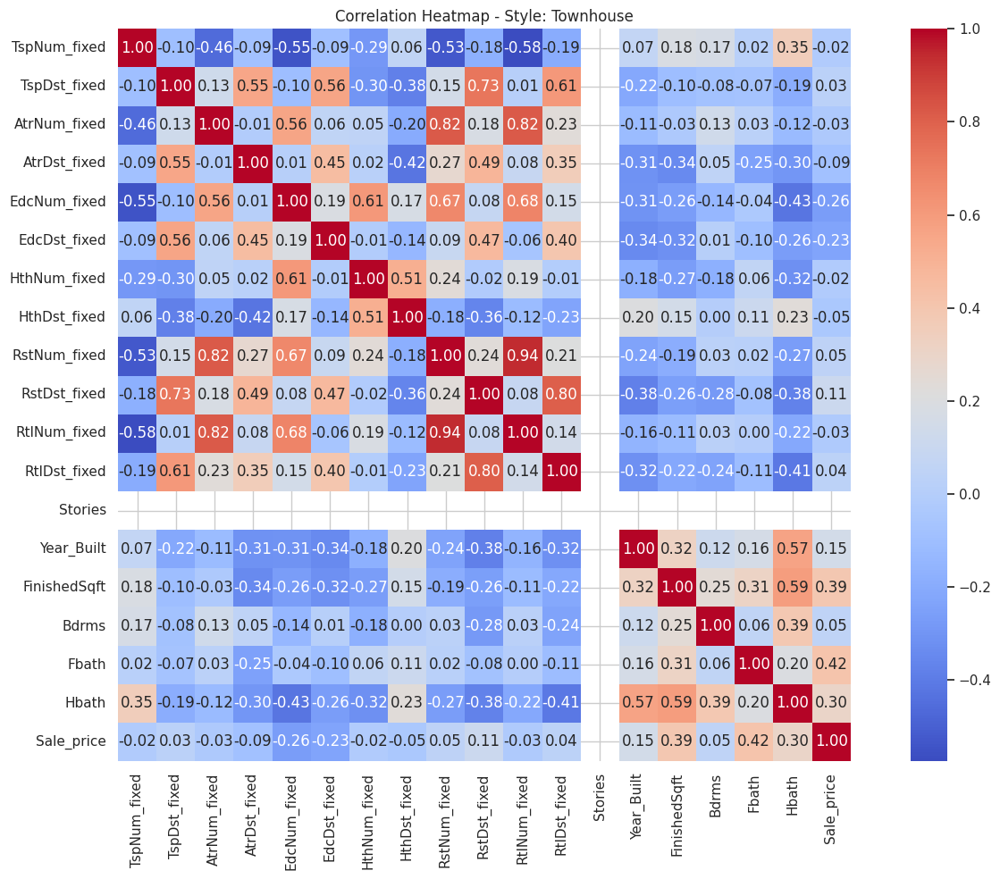

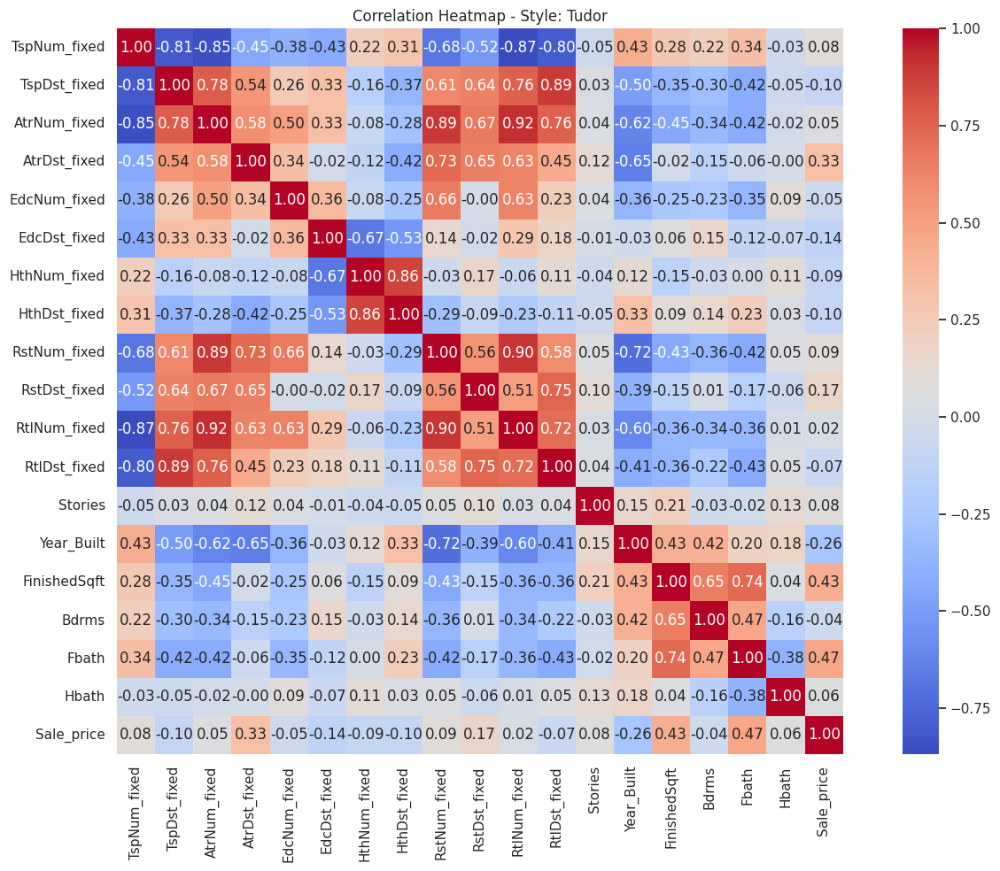

...

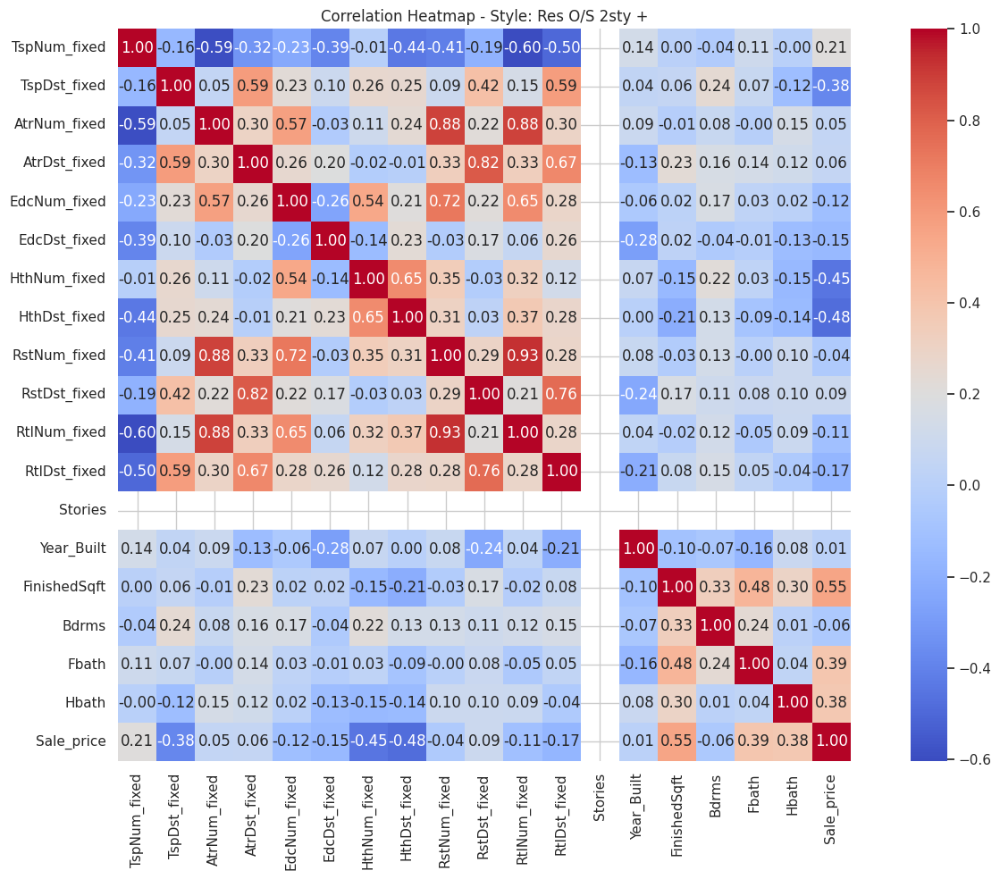

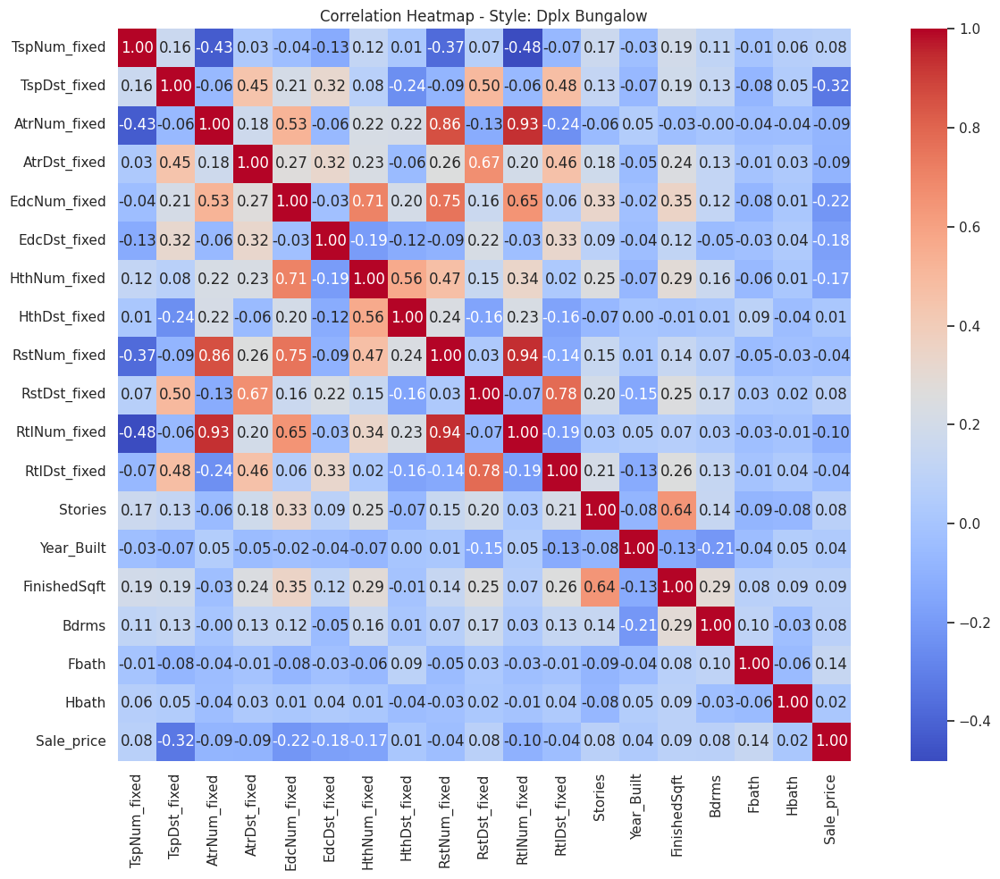

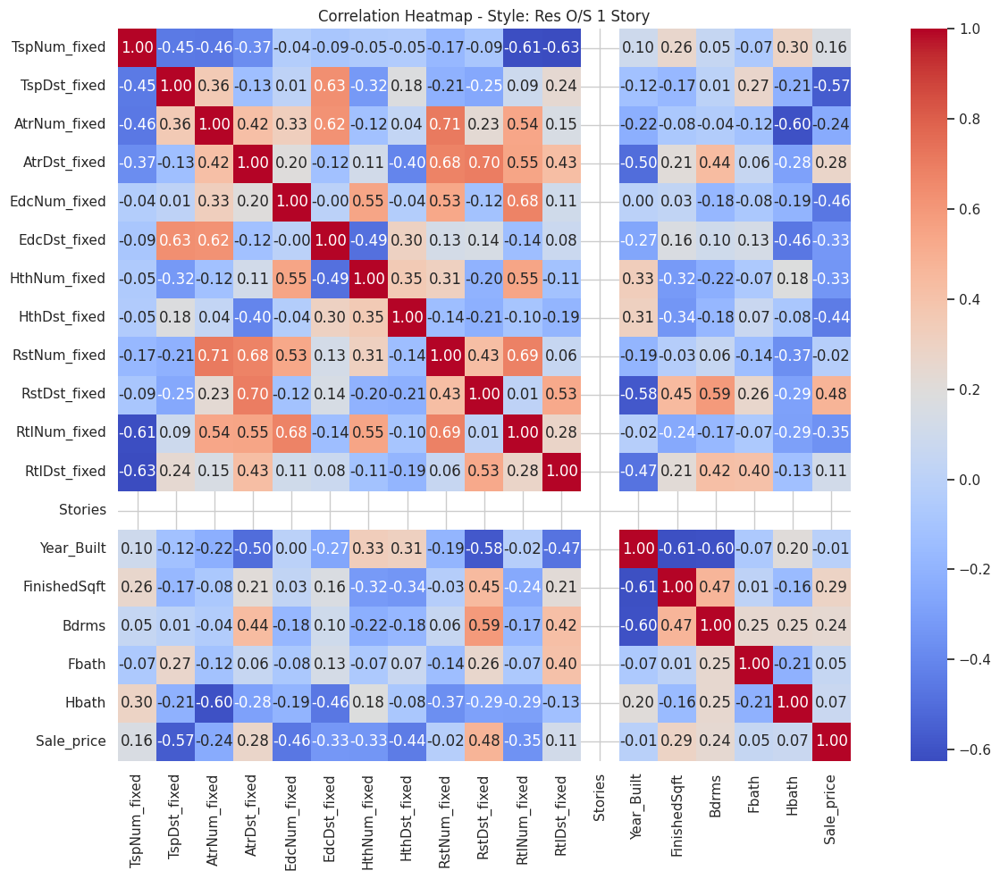

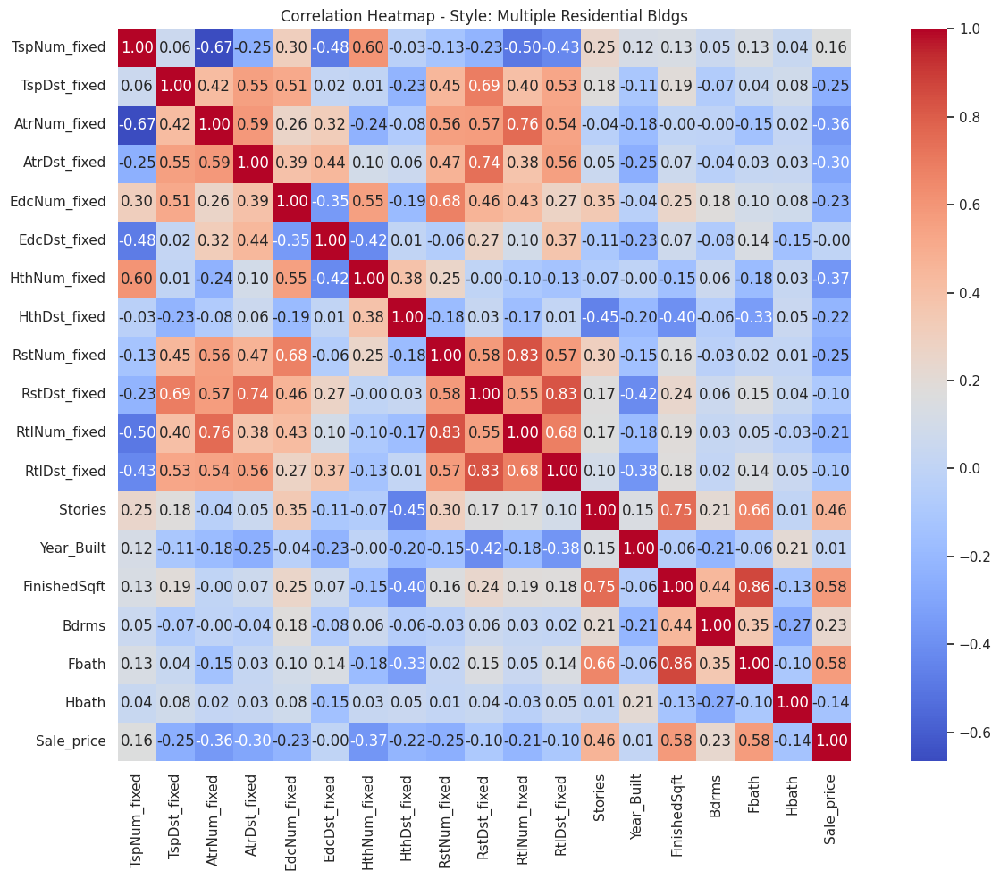

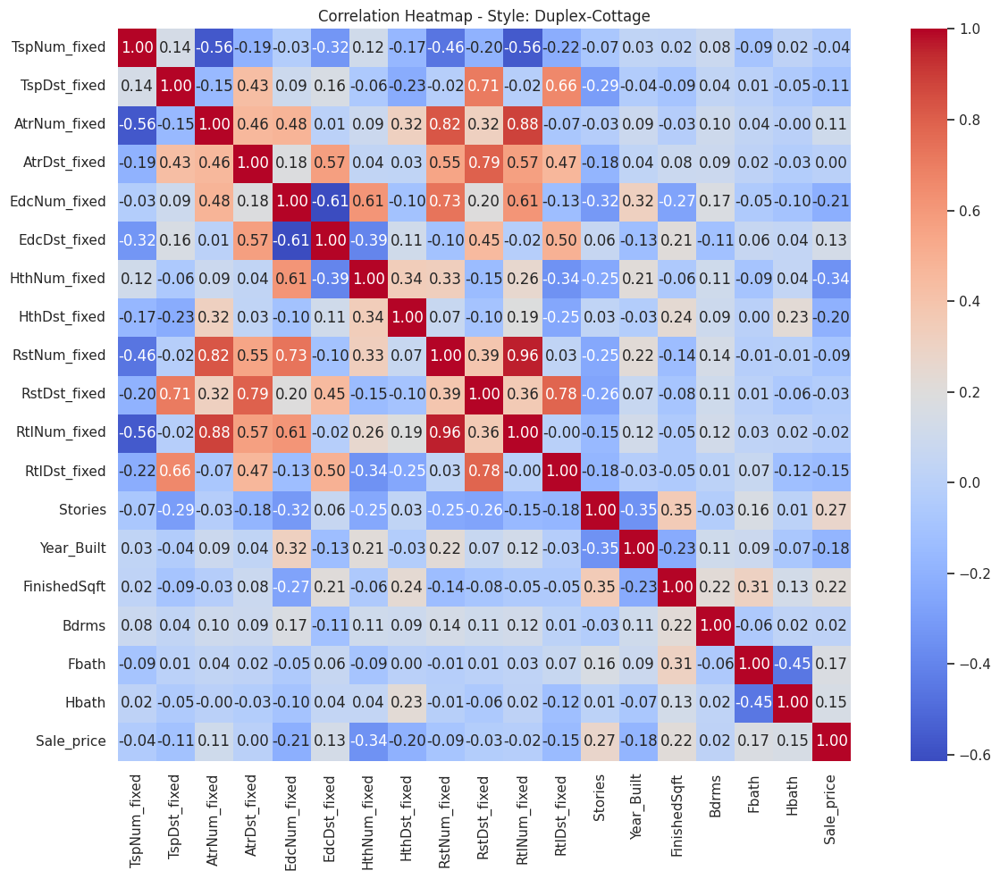

✅ All style-specific heatmaps saved to /style_heatmaps


In [11]:
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Create output folder
os.makedirs("style_heatmaps", exist_ok=True)

# Columns for heatmap
numeric_cols = [col for col in combined_df.columns if (
    col.endswith("_fixed") or
    col in ["FinishedSqft", "Bdrms", "Fbath", "Hbath", "Stories", "Year_Built", "Sale_price"]
)]

# Loop over each unique style
for style in combined_df["Style"].dropna().unique():
    df_style = combined_df[combined_df["Style"] == style]

    # Drop if not enough rows to compute correlations
    if len(df_style) < 5:
        continue

    corr = df_style[numeric_cols].corr()

    # Plot
    plt.figure(figsize=(14, 10))
    sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", square=True)
    plt.title(f"Correlation Heatmap - Style: {style}")
    plt.tight_layout()

    # Save
    safe_style_name = style.replace(" ", "_").replace("/", "_").replace("&", "and")
    filename = f"style_heatmaps/heatmap_{safe_style_name}.png"
    plt.savefig(filename, dpi=300)
    plt.show()
    plt.close()

print("✅ All style-specific heatmaps saved to /style_heatmaps")

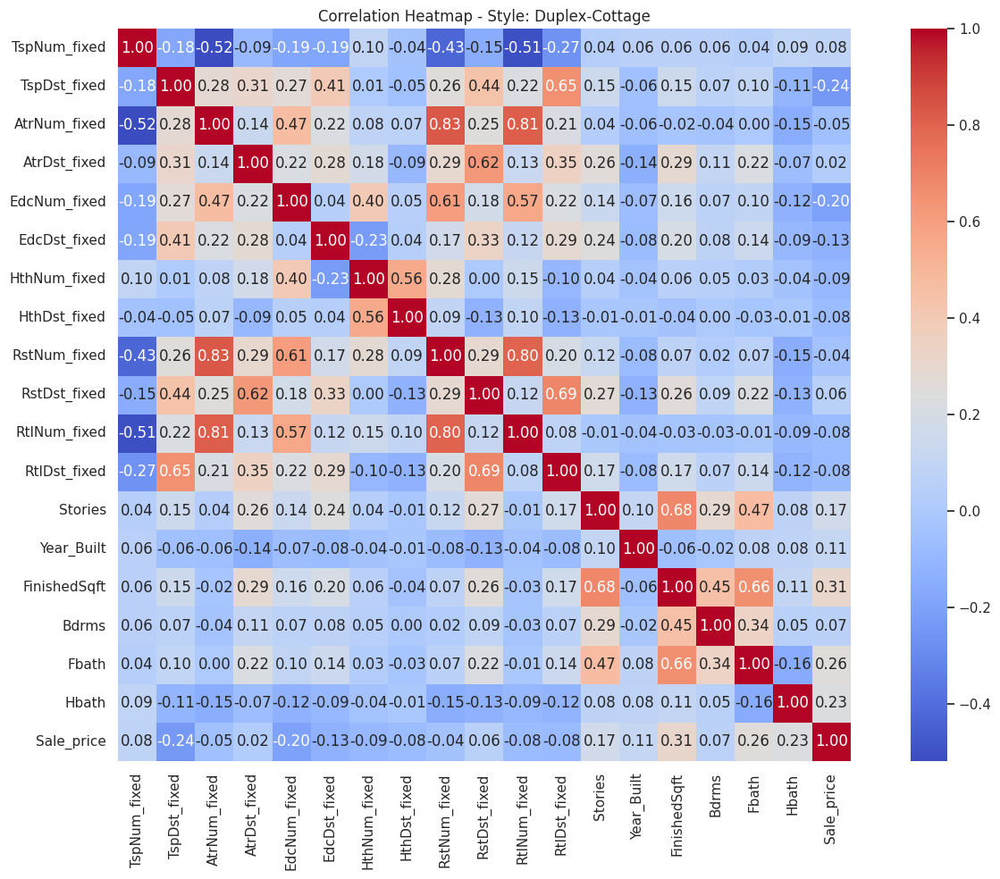

In [14]:
corr = combined_df[numeric_cols].corr()

    # Plot
plt.figure(figsize=(14, 10))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title(f"Correlation Heatmap - Style: {style}")
plt.tight_layout()

# Save
safe_style_name = style.replace(" ", "_").replace("/", "_").replace("&", "and")
filename = f"style_heatmaps/heatmap_{safe_style_name}.png"
plt.savefig(filename, dpi=300)
plt.show()
plt.close()


In [ ]:
corr = df_style[numeric_cols].corr()

    # Plot
    plt.figure(figsize=(14, 10))
    sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", square=True)
    plt.title(f"Correlation Heatmap - Style: {style}")
    plt.tight_layout()

    # Save
    safe_style_name = style.replace(" ", "_").replace("/", "_").replace("&", "and")
    filename = f"style_heatmaps/heatmap_{safe_style_name}.png"
    plt.savefig(filename, dpi=300)
    plt.show()
    plt.close()


In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Folder where heatmaps are saved
heatmap_dir = "style_heatmaps"
heatmap_files = sorted([f for f in os.listdir(heatmap_dir) if f.endswith(".png")])

# Load images
heatmaps = [Image.open(os.path.join(heatmap_dir, f)) for f in heatmap_files]

# Grid layout: auto-fit to number of styles
n = len(heatmaps)
cols = 4  # You can adjust this
rows = (n + cols - 1) // cols

# Resize all to same dimensions
standard_size = (600, 450)
heatmaps = [img.resize(standard_size) for img in heatmaps]

# Create a blank canvas
combined_width = cols * standard_size[0]
combined_height = rows * standard_size[1]
final_img = Image.new("RGB", (combined_width, combined_height), color="white")

# Paste each heatmap into the grid
for idx, img in enumerate(heatmaps):
    x = (idx % cols) * standard_size[0]
    y = (idx // cols) * standard_size[1]
    final_img.paste(img, (x, y))

# Save the final image
final_img.save("all_style_heatmaps.png")
print("✅ Saved all style heatmaps to 'all_style_heatmaps.png'")

✅ Saved all style heatmaps to 'all_style_heatmaps.png'


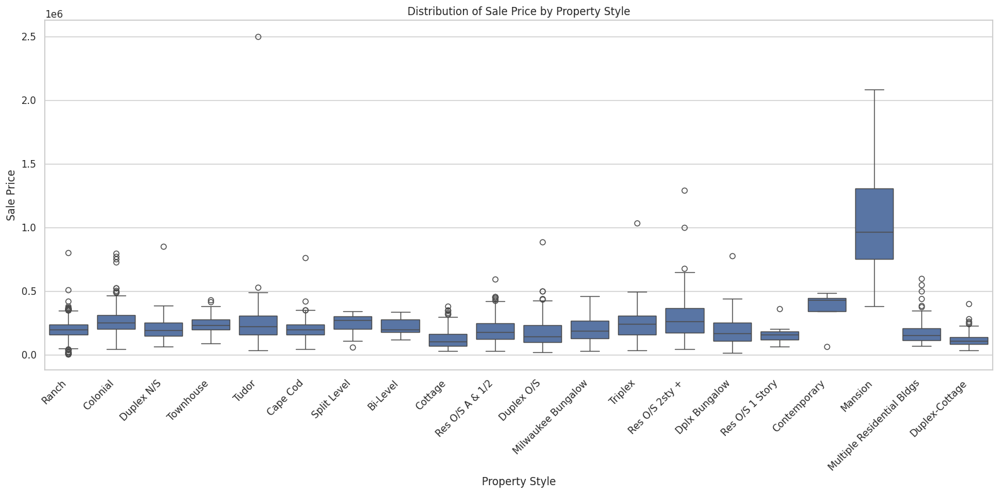

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(16, 8))
sns.boxplot(data=combined_df, x="Style", y="Sale_price")
plt.xticks(rotation=45, ha='right')
plt.title("Distribution of Sale Price by Property Style")
plt.ylabel("Sale Price")
plt.xlabel("Property Style")
plt.tight_layout()
plt.show()

<ipython-input-94-077522a22157>:2: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=combined_df, x="Style", y="Sale_price", inner="box", scale="width")


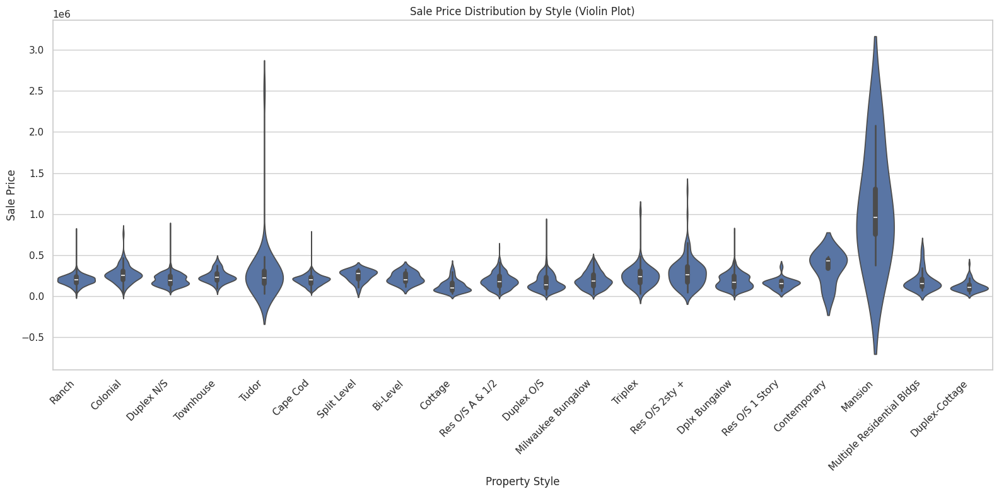

In [ ]:
plt.figure(figsize=(16, 8))
sns.violinplot(data=combined_df, x="Style", y="Sale_price", inner="box", scale="width")
plt.xticks(rotation=45, ha='right')
plt.title("Sale Price Distribution by Style (Violin Plot)")
plt.ylabel("Sale Price")
plt.xlabel("Property Style")
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Ensure output folder exists
os.makedirs("style_price_plots", exist_ok=True)

# ---- Boxplot ----
plt.figure(figsize=(16, 8))
sns.boxplot(data=combined_df, x="Style", y="Sale_price")
plt.xticks(rotation=45, ha='right')
plt.title("Distribution of Sale Price by Property Style")
plt.ylabel("Sale Price")
plt.xlabel("Property Style")
plt.tight_layout()
plt.savefig("style_price_plots/sale_price_boxplot_by_style.png", dpi=300)
plt.close()

# ---- Violin plot ----
plt.figure(figsize=(16, 8))
sns.violinplot(data=combined_df, x="Style", y="Sale_price", inner="box", scale="width")
plt.xticks(rotation=45, ha='right')
plt.title("Sale Price Distribution by Style (Violin Plot)")
plt.ylabel("Sale Price")
plt.xlabel("Property Style")
plt.tight_layout()
plt.savefig("style_price_plots/sale_price_violinplot_by_style.png", dpi=300)
plt.close()

print("✅ Saved boxplot and violin plot to 'style_price_plots/' folder.")

<ipython-input-95-aade72f999d0>:21: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=combined_df, x="Style", y="Sale_price", inner="box", scale="width")


✅ Saved boxplot and violin plot to 'style_price_plots/' folder.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Create output directory
os.makedirs("style_price_plots", exist_ok=True)

# Create the side-by-side plot
fig, axes = plt.subplots(1, 2, figsize=(20, 8), sharey=True)

# Boxplot
sns.boxplot(data=combined_df, x="Style", y="Sale_price", ax=axes[0])
axes[0].set_title("Boxplot of Sale Price by Style")
axes[0].set_xlabel("Style")
axes[0].set_ylabel("Sale Price")
axes[0].tick_params(axis='x', rotation=45)

# Violin plot
sns.violinplot(data=combined_df, x="Style", y="Sale_price", inner="box", scale="width", ax=axes[1])
axes[1].set_title("Violin Plot of Sale Price by Style")
axes[1].set_xlabel("Style")
axes[1].set_ylabel("")  # Shared y-axis
axes[1].tick_params(axis='x', rotation=45)

# Layout and save
plt.tight_layout()
output_path = "style_price_plots/sale_price_box_violin_by_style.png"
plt.savefig(output_path, dpi=300)
plt.close()

print(f"✅ Combined plot saved as '{output_path}'")

<ipython-input-96-a1127cf8854d>:19: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=combined_df, x="Style", y="Sale_price", inner="box", scale="width", ax=axes[1])


✅ Combined plot saved as 'style_price_plots/sale_price_box_violin_by_style.png'


In [ ]:
combined_df['Style'].value_counts()

,count
Style,
Ranch,1798
Cape Cod,1179
Milwaukee Bungalow,475
Res O/S A & 1/2,442
Duplex O/S,417
Duplex N/S,405
Dplx Bungalow,361
Colonial,304
Cottage,144


In [ ]:
import numpy as np
import pandas as pd
from scipy.stats.mstats import winsorize

# Step 1: Style counts
style_counts = combined_df["Style"].value_counts()

# Step 2: Create new column for adjusted price
combined_df["Sale_price_adjusted"] = np.nan

# Step 3: Apply handling per style
for style, count in style_counts.items():
    mask = combined_df["Style"] == style
    subset = combined_df.loc[mask, "Sale_price"]

    if count >= 30:
        # Winsorize for large groups
        winsorized = winsorize(subset, limits=[0.01, 0.01])
        combined_df.loc[mask, "Sale_price_adjusted"] = winsorized

    elif count >= 10:
        # Log1p transform for mid-size groups
        combined_df.loc[mask, "Sale_price_adjusted"] = np.log1p(subset)

    else:
        # Keep as-is or flag for exclusion
        combined_df.loc[mask, "Sale_price_adjusted"] = subset  # or np.nan to exclude

In [ ]:
# Filter only styles with >= 10 entries
valid_styles = style_counts[style_counts >= 10].index.tolist()
df_model_ready = combined_df[combined_df["Style"].isin(valid_styles)].copy()

In [ ]:
print(df_model_ready[["Style", "Sale_price", "Sale_price_adjusted"]].groupby("Style").describe())

                           Sale_price                                          \
                                count           mean            std       min   
Style                                                                           
Bi-Level                         10.0  224070.000000   68248.794047  120000.0   
Cape Cod                       1179.0  197598.558948   62270.142131   45000.0   
Colonial                        304.0  269314.868421  107670.541666   42000.0   
Cottage                         144.0  127881.152778   75853.570636   30000.0   
Dplx Bungalow                   361.0  186426.072022   92930.760537   16000.0   
Duplex N/S                      405.0  202582.990123   73984.797635   65000.0   
Duplex O/S                      417.0  168050.412470   97811.803392   18000.0   
Duplex-Cottage                   71.0  121599.014085   64021.806595   36000.0   
Milwaukee Bungalow              475.0  200782.629474   98173.192358   27000.0   
Multiple Residential Bldgs  

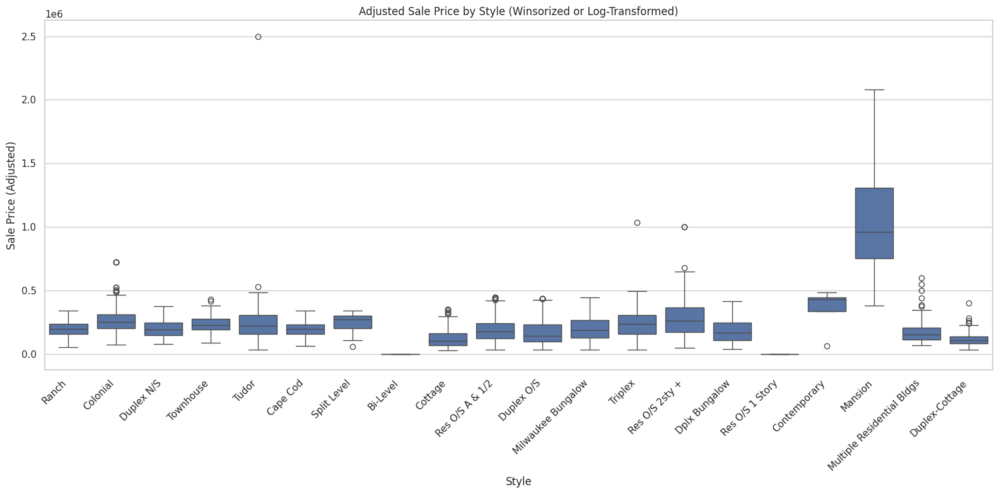

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(16, 8))
sns.boxplot(data=combined_df, x="Style", y="Sale_price_adjusted")
plt.xticks(rotation=45, ha='right')
plt.title("Adjusted Sale Price by Style (Winsorized or Log-Transformed)")
plt.ylabel("Sale Price (Adjusted)")
plt.xlabel("Style")
plt.tight_layout()
plt.savefig("style_price_plots/adjusted_sale_price_by_style.png", dpi=300)
plt.show()

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
combined_df["Sale_price_scaled"] = scaler.fit_transform(
    combined_df[["Sale_price_adjusted"]]
)

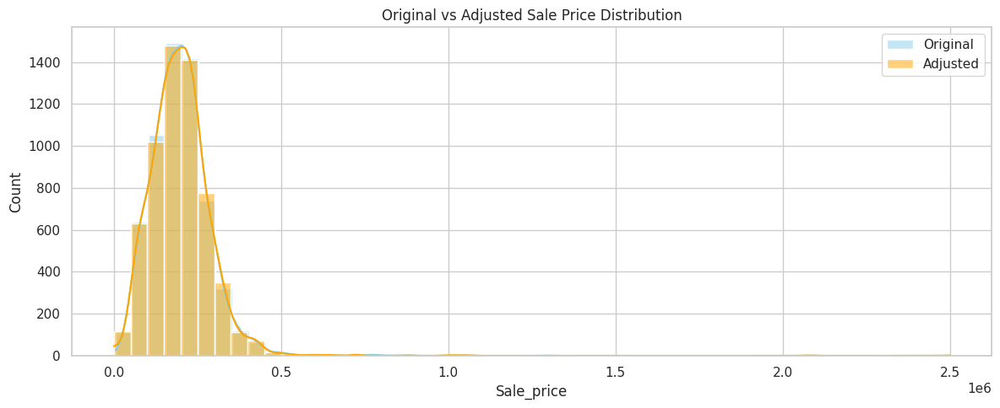

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 5))
sns.histplot(combined_df["Sale_price"], bins=50, kde=True, label="Original", color="skyblue")
sns.histplot(combined_df["Sale_price_adjusted"], bins=50, kde=True, label="Adjusted", color="orange")
plt.title("Original vs Adjusted Sale Price Distribution")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# Save the DataFrame with adjusted sale prices
combined_df.to_csv("cleaned_property_data_with_adjusted_prices.csv", index=False)

print("✅ Saved to 'cleaned_property_data_with_adjusted_prices.csv'")

✅ Saved to 'cleaned_property_data_with_adjusted_prices.csv'


In [ ]:
combined_df.columns

Index(['Address', 'Latitude', 'Longitude', 'TspNum', 'TspDst', 'AtrNum',
       'AtrDst', 'EdcNum', 'EdcDst', 'HthNum', 'HthDst', 'RstNum', 'RstDst',
       'RtlNum', 'RtlDst', 'TspNum_fixed', 'TspDst_fixed', 'AtrNum_fixed',
       'AtrDst_fixed', 'EdcNum_fixed', 'EdcDst_fixed', 'HthNum_fixed',
       'HthDst_fixed', 'RstNum_fixed', 'RstDst_fixed', 'RtlNum_fixed',
       'RtlDst_fixed', 'PropertyID', 'PropType', 'taxkey', 'CondoProject',
       'District', 'nbhd', 'Style', 'Extwall', 'Stories', 'Year_Built',
       'Rooms', 'FinishedSqft', 'Units', 'Bdrms', 'Fbath', 'Hbath', 'Lotsize',
       'Sale_date', 'Sale_price', 'Sale_price_adjusted', 'Sale_price_scaled'],
      dtype='object')

In [ ]:
combined_df['Sale_price']

,Sale_price
0,800000.0
1,280000.0
2,233100.0
3,215000.0
4,150000.0
...,...
6000,275000.0
6001,220000.0
6002,240000.0
6003,195000.0


In [ ]:
combined_df['Sale_price_adjusted']

,Sale_price_adjusted
0,340000.0
1,280000.0
2,233100.0
3,215000.0
4,150000.0
...,...
6000,275000.0
6001,220000.0
6002,240000.0
6003,195000.0


In [ ]:
combined_df['Style'].value_counts()

,count
Style,
Ranch,1798
Cape Cod,1179
Milwaukee Bungalow,475
Res O/S A & 1/2,442
Duplex O/S,417
Duplex N/S,405
Dplx Bungalow,361
Colonial,304
Cottage,144


In [ ]:
combined_df['nbhd'] = combined_df['nbhd'].astype(str)

In [ ]:
from sklearn.preprocessing import LabelEncoder

le_nbhd = LabelEncoder()
combined_df['nbhd'] = le_nbhd.fit_transform(combined_df['nbhd'])


--- Style: Ranch ---
R² Train: 0.674
R² Test:  0.495


<ipython-input-164-3e35371ea23e>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


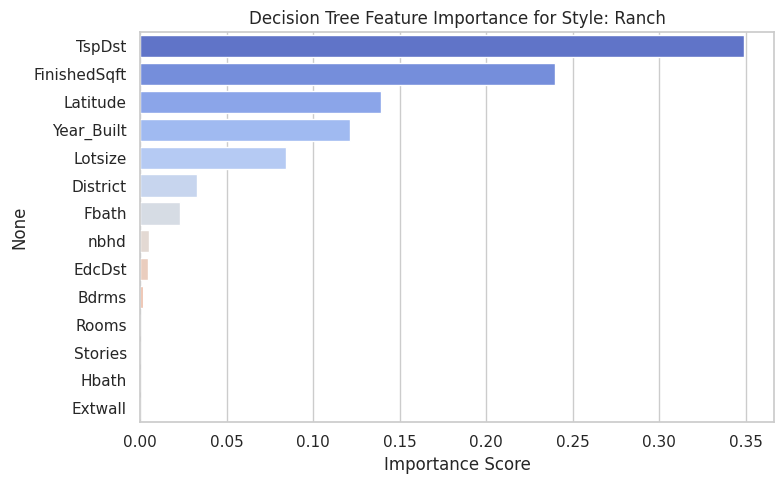


--- Style: Cape Cod ---
R² Train: 0.688
R² Test:  0.433


<ipython-input-164-3e35371ea23e>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


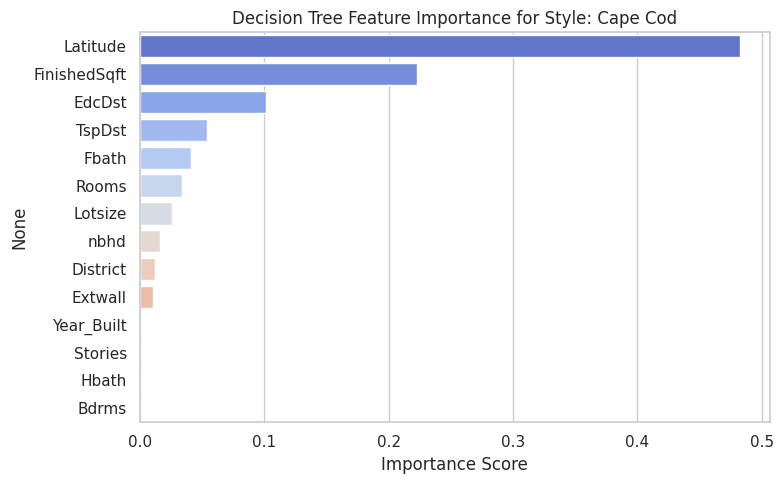


--- Style: Milwaukee Bungalow ---
R² Train: 0.798
R² Test:  0.624


<ipython-input-164-3e35371ea23e>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


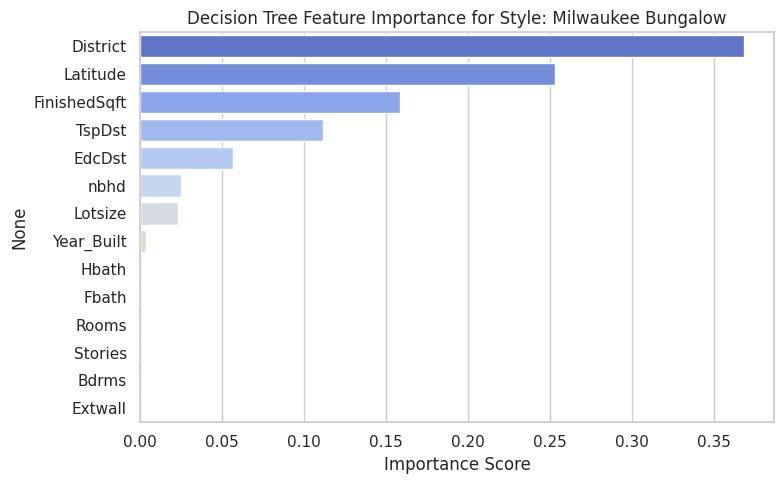


--- Style: Res O/S A & 1/2 ---
R² Train: 0.716
R² Test:  0.412


<ipython-input-164-3e35371ea23e>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


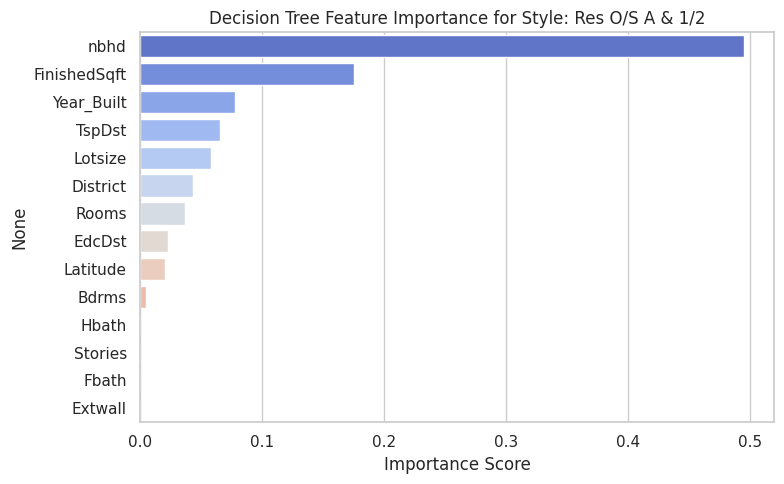


--- Style: Duplex O/S ---
R² Train: 0.788
R² Test:  0.324


<ipython-input-164-3e35371ea23e>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


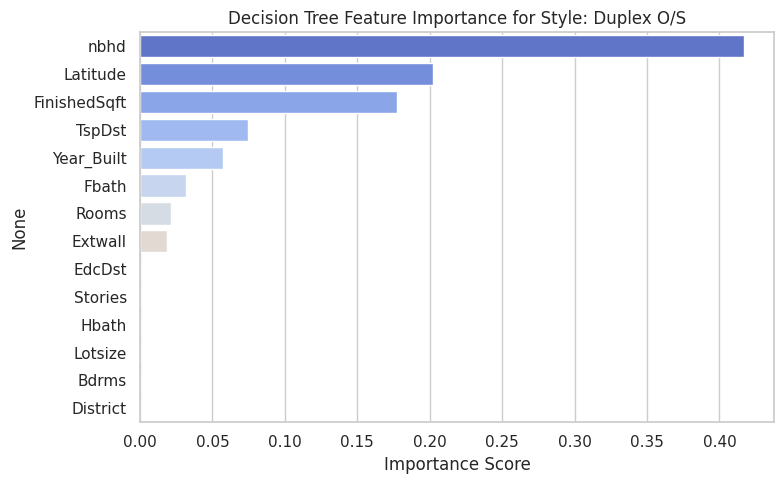


--- Style: Duplex N/S ---
R² Train: 0.805
R² Test:  0.649


<ipython-input-164-3e35371ea23e>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


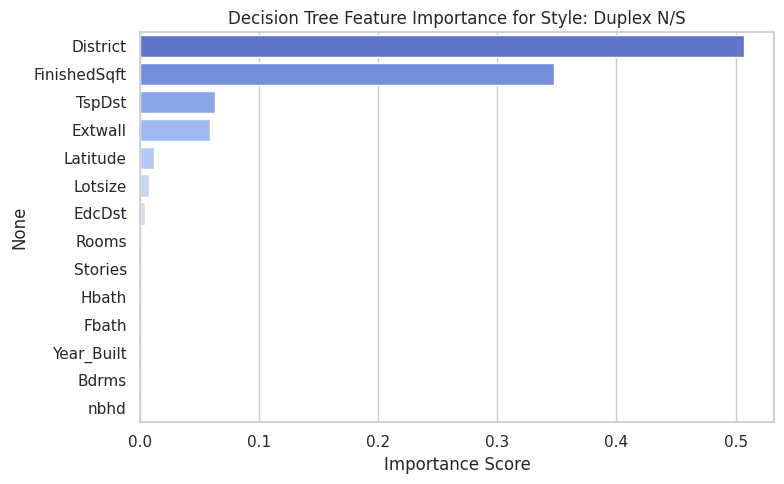


--- Style: Dplx Bungalow ---
R² Train: 0.822
R² Test:  0.616


<ipython-input-164-3e35371ea23e>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


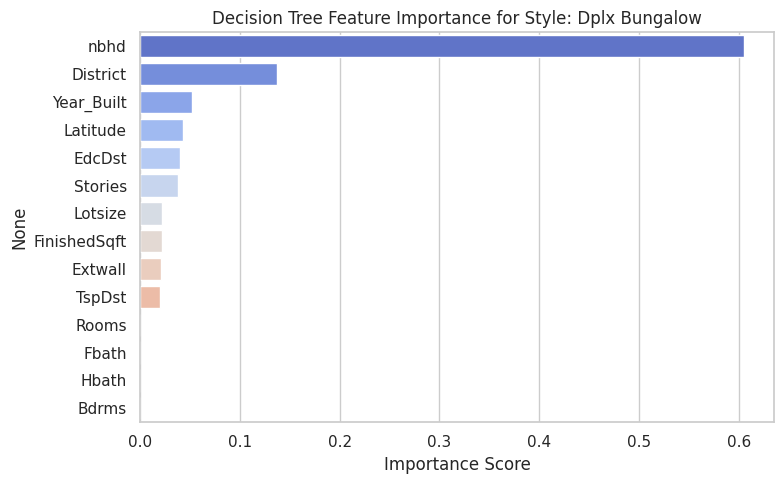


--- Style: Colonial ---
R² Train: 0.810
R² Test:  0.378


<ipython-input-164-3e35371ea23e>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


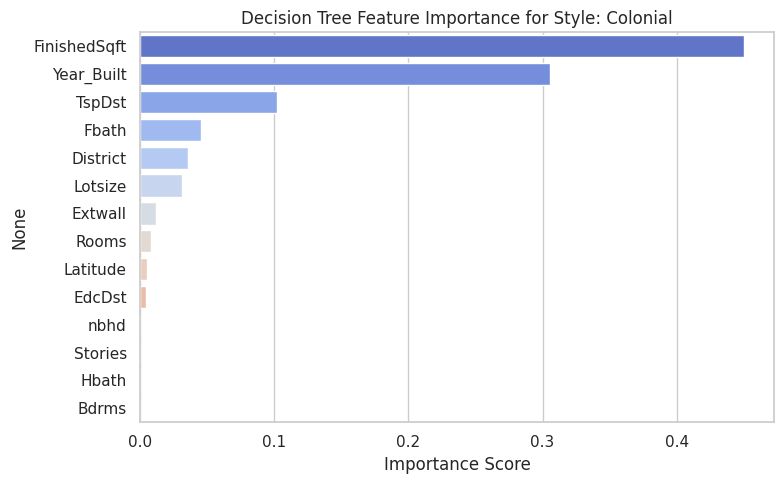


--- Style: Cottage ---
R² Train: 0.782
R² Test:  0.002


<ipython-input-164-3e35371ea23e>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


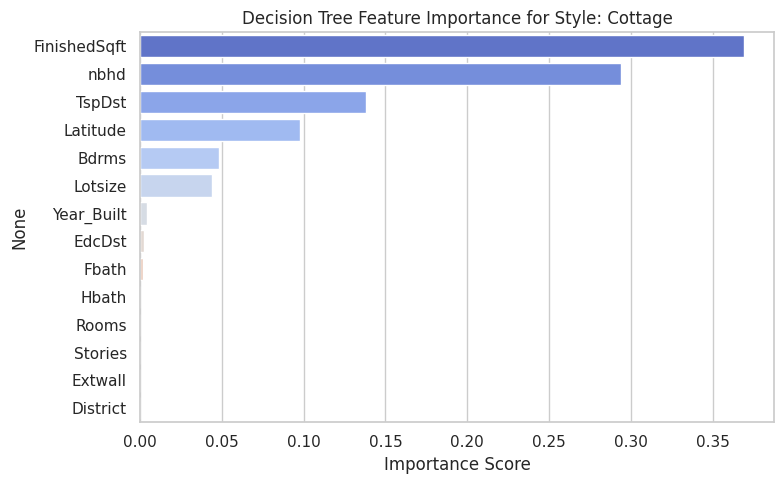


--- Style: Res O/S 2sty + ---
R² Train: 0.892
R² Test:  0.560


<ipython-input-164-3e35371ea23e>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


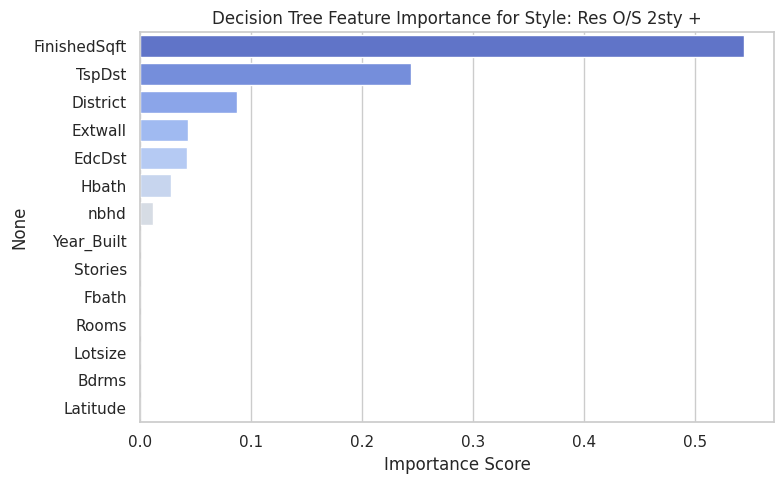

In [ ]:
import pandas as pd
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns

# STEP 1: Filter styles with sufficient data
min_required = 100
style_counts = combined_df['Style'].value_counts()
valid_styles = style_counts[style_counts >= min_required].index
filtered_df = combined_df[combined_df['Style'].isin(valid_styles)].copy()

# STEP 2: Convert nbhd to categorical and encode all categorical features
filtered_df['nbhd'] = filtered_df['nbhd'].astype(str)
label_encoders = {}
for col in ['Style', 'Extwall', 'District', 'nbhd']:
    le = LabelEncoder()
    filtered_df[col] = le.fit_transform(filtered_df[col].astype(str))
    label_encoders[col] = le

# STEP 3: Define features and target
features = [
    'FinishedSqft', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'Rooms', 'Bdrms', 'Lotsize', 'TspDst', 'EdcDst', 'Latitude',
    'Extwall', 'District', 'nbhd'
]
target = 'Sale_price'

# STEP 4: Train DecisionTree for each style
for style in valid_styles:
    print(f"\n--- Style: {style} ---")
    style_code = label_encoders['Style'].transform([style])[0]
    df_style = filtered_df[filtered_df['Style'] == style_code]

    X = df_style[features]
    y = df_style[target]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    model = DecisionTreeRegressor(max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    r2_train = r2_score(y_train, model.predict(X_train))
    r2_test = r2_score(y_test, model.predict(X_test))

    print(f"R² Train: {r2_train:.3f}")
    print(f"R² Test:  {r2_test:.3f}")

    # Plot feature importance
    importances = pd.Series(model.feature_importances_, index=features).sort_values(ascending=False)
    plt.figure(figsize=(8, 5))
    sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')
    plt.title(f'Decision Tree Feature Importance for Style: {style}')
    plt.xlabel('Importance Score')
    plt.tight_layout()
    plt.show()


--- Style: Ranch ---
R² Train: 0.932
R² Test:  0.674


<ipython-input-165-897f94c3a962>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


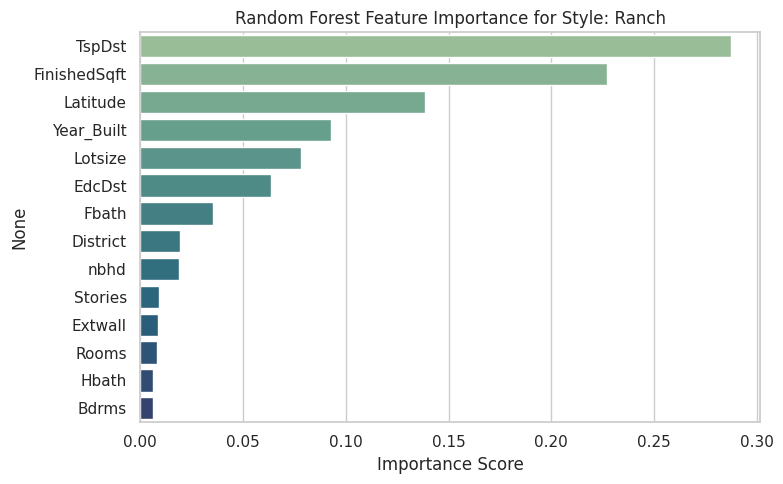


--- Style: Cape Cod ---
R² Train: 0.930
R² Test:  0.617


<ipython-input-165-897f94c3a962>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


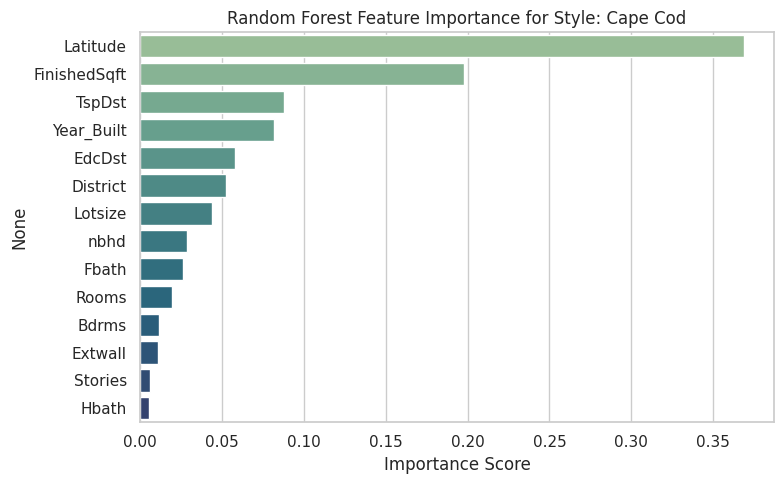


--- Style: Milwaukee Bungalow ---
R² Train: 0.965
R² Test:  0.816


<ipython-input-165-897f94c3a962>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


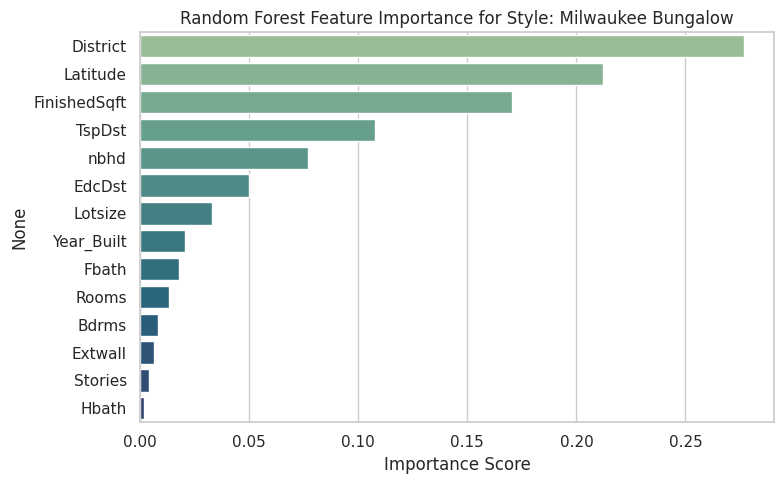


--- Style: Res O/S A & 1/2 ---
R² Train: 0.935
R² Test:  0.671


<ipython-input-165-897f94c3a962>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


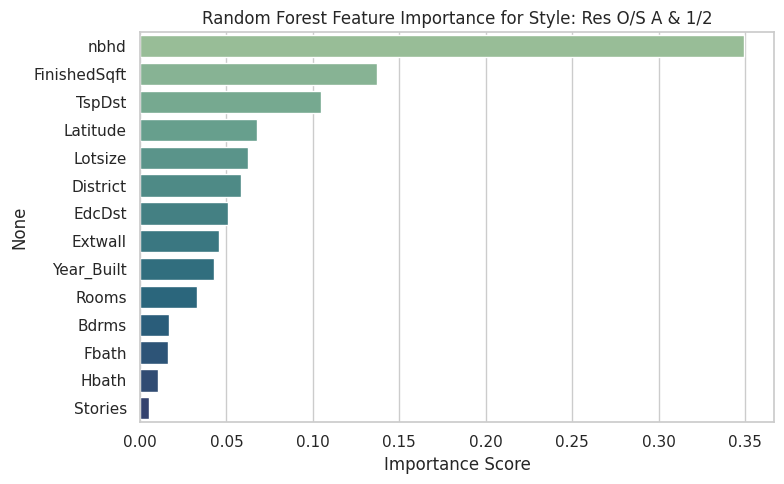


--- Style: Duplex O/S ---
R² Train: 0.941
R² Test:  0.635


<ipython-input-165-897f94c3a962>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


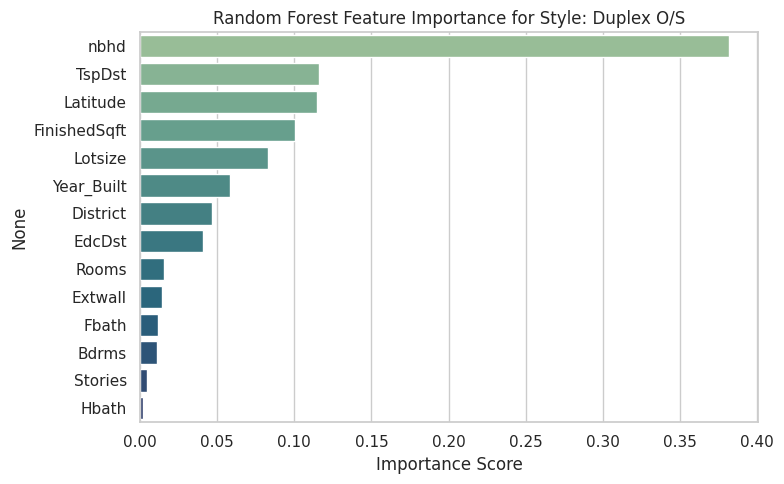


--- Style: Duplex N/S ---
R² Train: 0.955
R² Test:  0.694


<ipython-input-165-897f94c3a962>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


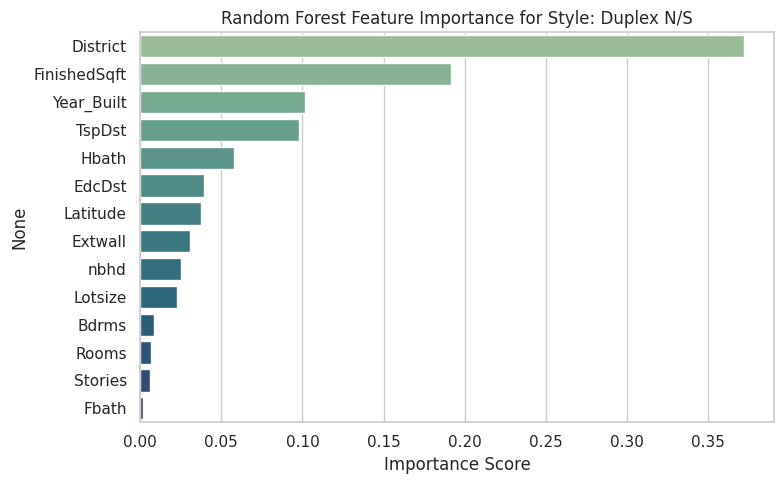


--- Style: Dplx Bungalow ---
R² Train: 0.962
R² Test:  0.594


<ipython-input-165-897f94c3a962>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


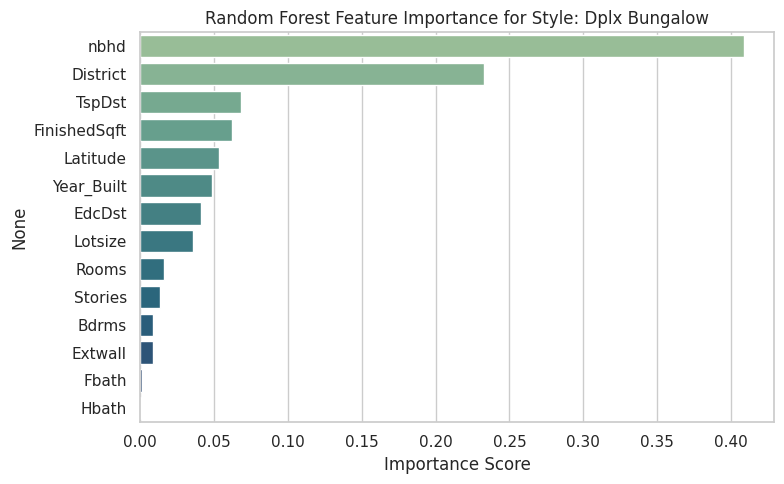


--- Style: Colonial ---
R² Train: 0.911
R² Test:  0.535


<ipython-input-165-897f94c3a962>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


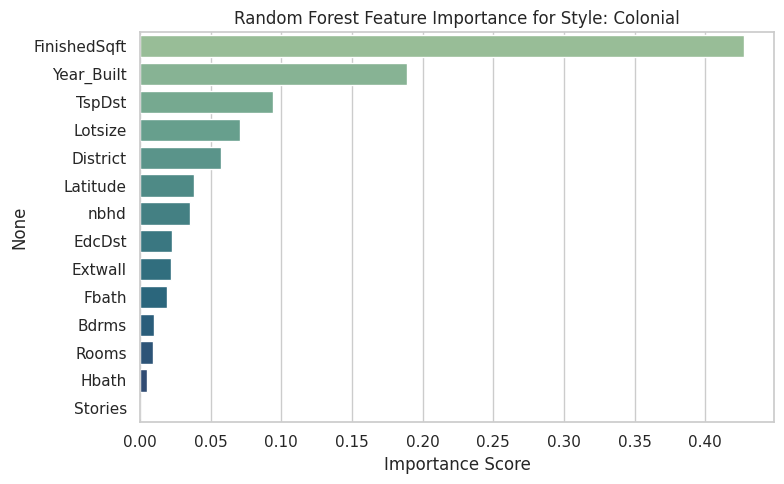


--- Style: Cottage ---
R² Train: 0.918
R² Test:  0.559


<ipython-input-165-897f94c3a962>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


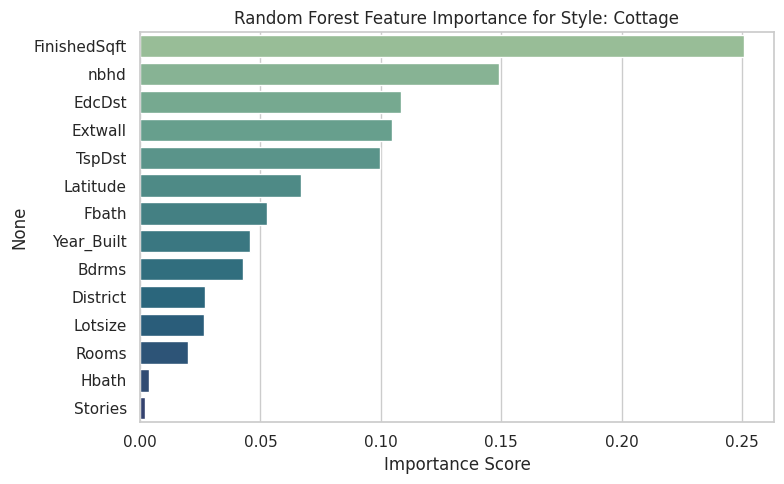


--- Style: Res O/S 2sty + ---
R² Train: 0.939
R² Test:  0.654


<ipython-input-165-897f94c3a962>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


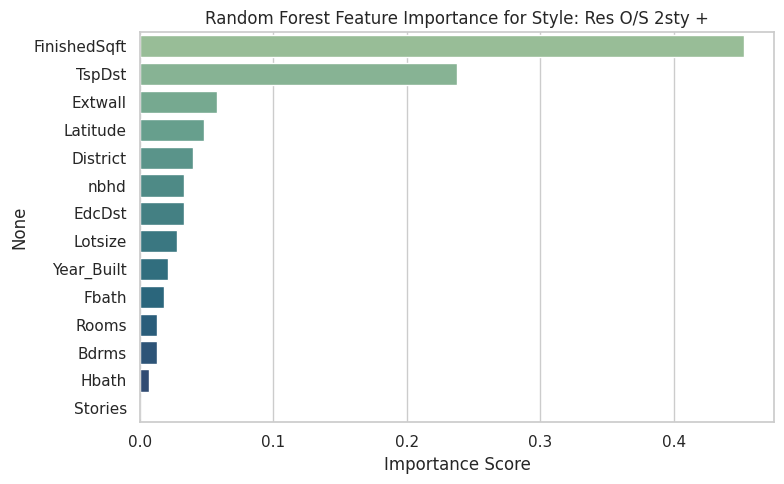

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns

# STEP 1: Filter styles with sufficient data
min_required = 100
style_counts = combined_df['Style'].value_counts()
valid_styles = style_counts[style_counts >= min_required].index
filtered_df = combined_df[combined_df['Style'].isin(valid_styles)].copy()

# STEP 2: Convert nbhd to string and encode all categorical variables
filtered_df['nbhd'] = filtered_df['nbhd'].astype(str)
label_encoders = {}
for col in ['Style', 'Extwall', 'District', 'nbhd']:
    le = LabelEncoder()
    filtered_df[col] = le.fit_transform(filtered_df[col].astype(str))
    label_encoders[col] = le

# STEP 3: Define features and target
features = [
    'FinishedSqft', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'Rooms', 'Bdrms', 'Lotsize', 'TspDst', 'EdcDst', 'Latitude',
    'Extwall', 'District', 'nbhd'
]
target = 'Sale_price'

# STEP 4: Train RandomForestRegressor per Style
for style in valid_styles:
    print(f"\n--- Style: {style} ---")
    style_code = label_encoders['Style'].transform([style])[0]
    df_style = filtered_df[filtered_df['Style'] == style_code]

    X = df_style[features]
    y = df_style[target]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    model = RandomForestRegressor(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)

    r2_train = r2_score(y_train, model.predict(X_train))
    r2_test = r2_score(y_test, model.predict(X_test))

    print(f"R² Train: {r2_train:.3f}")
    print(f"R² Test:  {r2_test:.3f}")

    # Plot feature importance
    importances = pd.Series(model.feature_importances_, index=features).sort_values(ascending=False)
    plt.figure(figsize=(8, 5))
    sns.barplot(x=importances.values, y=importances.index, palette='crest')
    plt.title(f'Random Forest Feature Importance for Style: {style}')
    plt.xlabel('Importance Score')
    plt.tight_layout()
    plt.show()


--- Grid Search for Style: Ranch ---
Best Params: {'max_depth': 10, 'min_samples_leaf': 1, 'n_estimators': 100}
R² Train: 0.890
R² Test:  0.669


<ipython-input-166-315c9a64d06b>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


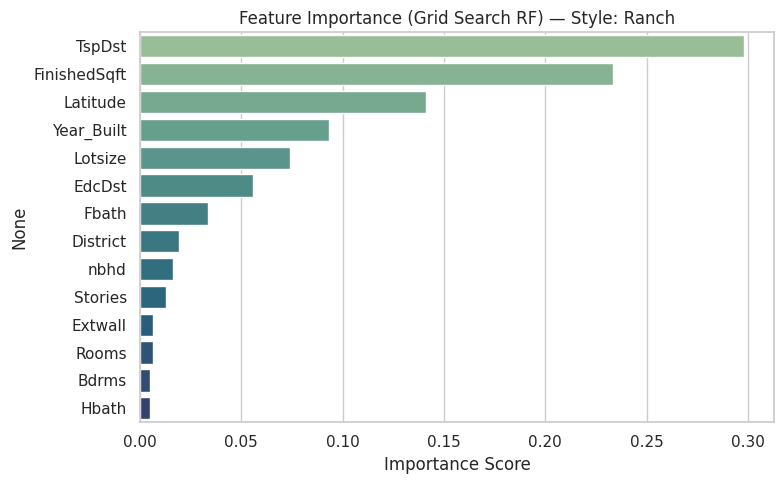


--- Grid Search for Style: Cape Cod ---
Best Params: {'max_depth': None, 'min_samples_leaf': 3, 'n_estimators': 50}
R² Train: 0.860
R² Test:  0.612


<ipython-input-166-315c9a64d06b>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


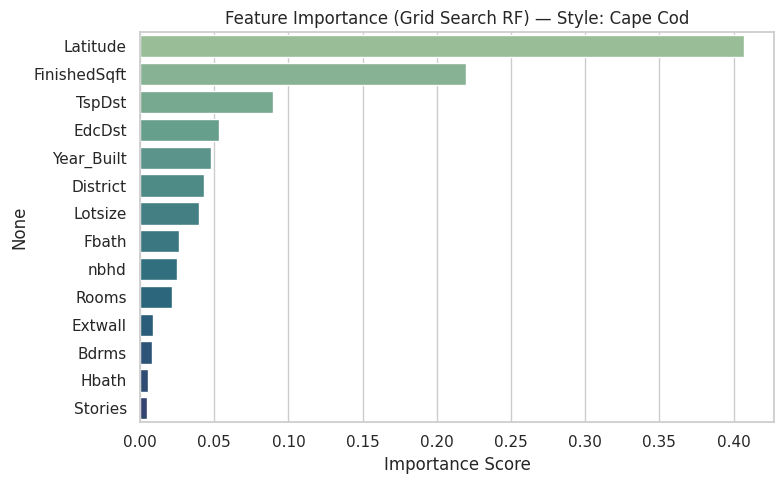


--- Grid Search for Style: Milwaukee Bungalow ---
Best Params: {'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 100}
R² Train: 0.965
R² Test:  0.816


<ipython-input-166-315c9a64d06b>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


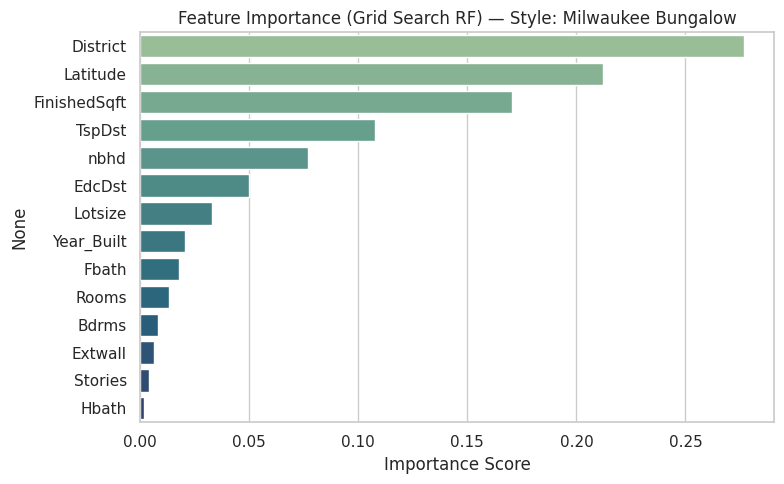


--- Grid Search for Style: Res O/S A & 1/2 ---
Best Params: {'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 100}
R² Train: 0.935
R² Test:  0.671


<ipython-input-166-315c9a64d06b>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


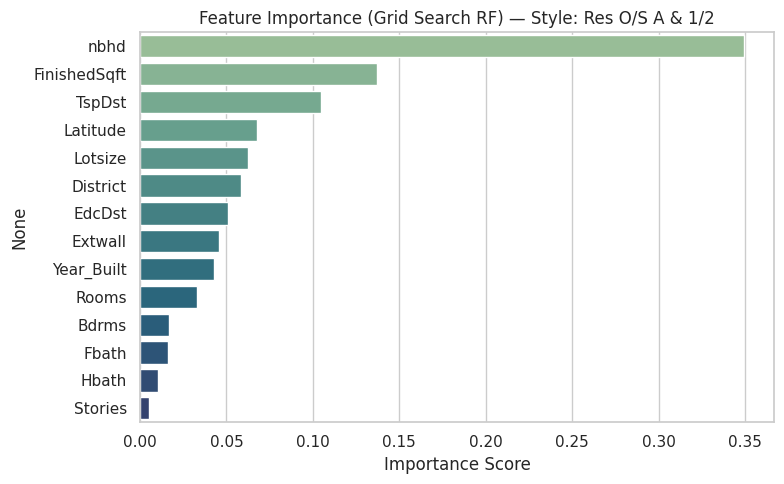


--- Grid Search for Style: Duplex O/S ---
Best Params: {'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 100}
R² Train: 0.941
R² Test:  0.635


<ipython-input-166-315c9a64d06b>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


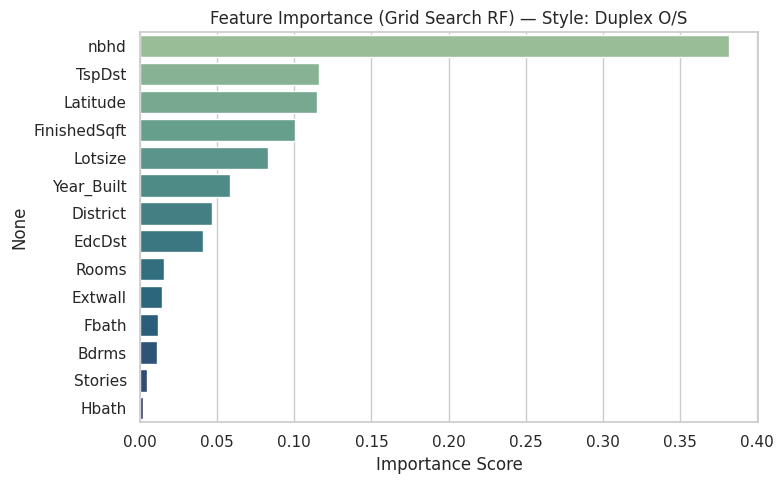


--- Grid Search for Style: Duplex N/S ---
Best Params: {'max_depth': 10, 'min_samples_leaf': 3, 'n_estimators': 100}
R² Train: 0.812
R² Test:  0.634


<ipython-input-166-315c9a64d06b>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


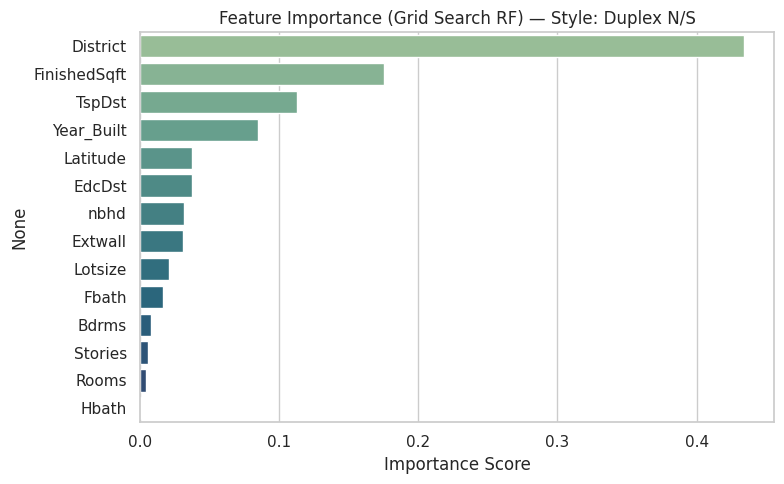


--- Grid Search for Style: Dplx Bungalow ---
Best Params: {'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 100}
R² Train: 0.962
R² Test:  0.594


<ipython-input-166-315c9a64d06b>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


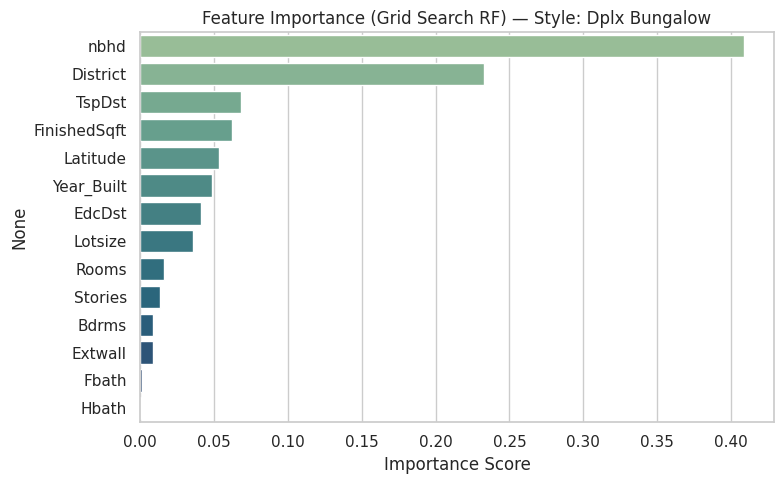


--- Grid Search for Style: Colonial ---
Best Params: {'max_depth': 10, 'min_samples_leaf': 1, 'n_estimators': 100}
R² Train: 0.903
R² Test:  0.531


<ipython-input-166-315c9a64d06b>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


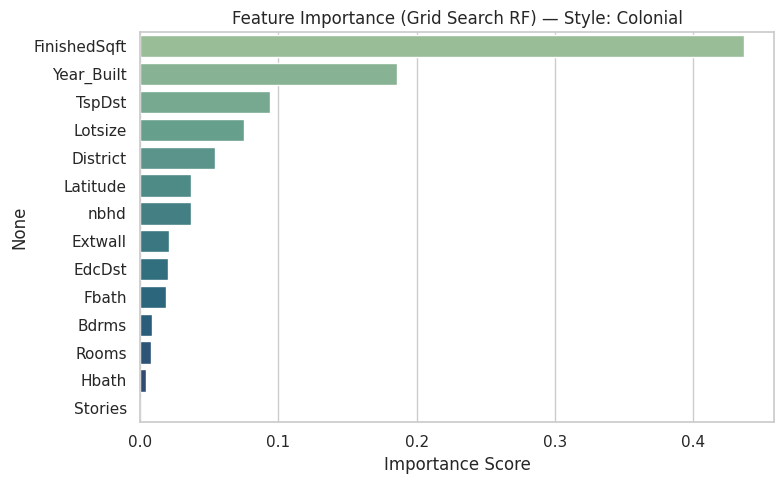


--- Grid Search for Style: Cottage ---
Best Params: {'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 50}
R² Train: 0.918
R² Test:  0.572


<ipython-input-166-315c9a64d06b>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


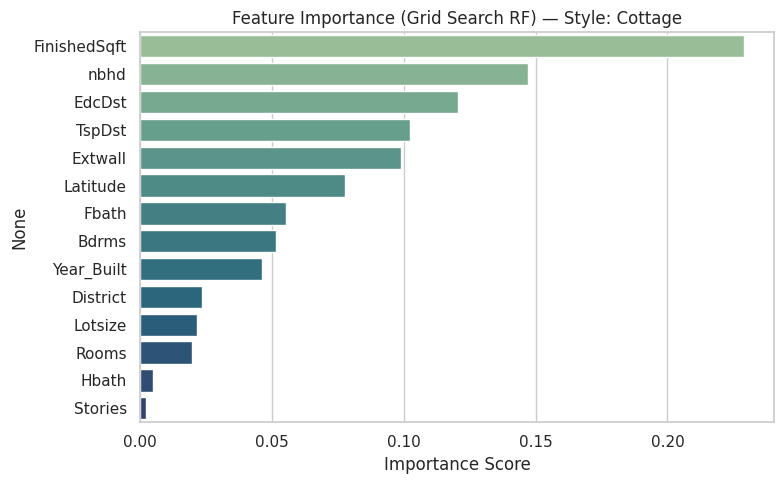


--- Grid Search for Style: Res O/S 2sty + ---
Best Params: {'max_depth': 10, 'min_samples_leaf': 1, 'n_estimators': 50}
R² Train: 0.944
R² Test:  0.660


<ipython-input-166-315c9a64d06b>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='crest')


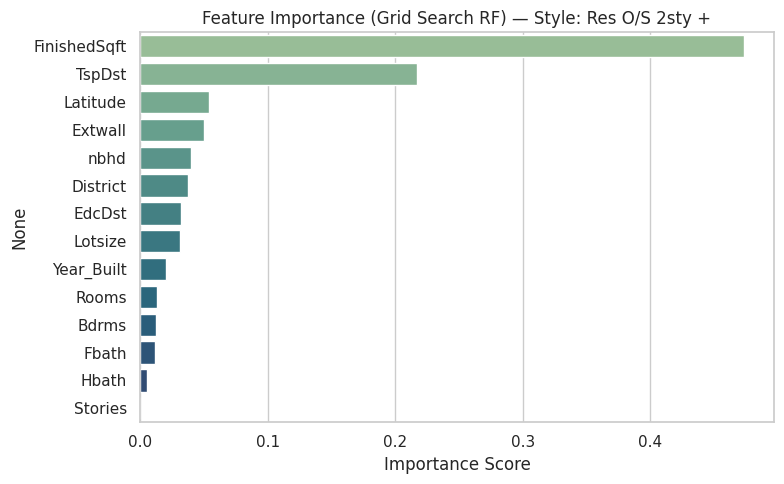

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns

# STEP 1: Filter styles with sufficient data
min_required = 100
style_counts = combined_df['Style'].value_counts()
valid_styles = style_counts[style_counts >= min_required].index
filtered_df = combined_df[combined_df['Style'].isin(valid_styles)].copy()

# STEP 2: Convert nbhd to categorical and encode
filtered_df['nbhd'] = filtered_df['nbhd'].astype(str)
label_encoders = {}
for col in ['Style', 'Extwall', 'District', 'nbhd']:
    le = LabelEncoder()
    filtered_df[col] = le.fit_transform(filtered_df[col].astype(str))
    label_encoders[col] = le

# STEP 3: Define features and target
features = [
    'FinishedSqft', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'Rooms', 'Bdrms', 'Lotsize', 'TspDst', 'EdcDst', 'Latitude',
    'Extwall', 'District', 'nbhd'
]
target = 'Sale_price'

# STEP 4: Grid Search CV for Random Forest (per Style)
param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [5, 10, None],
    'min_samples_leaf': [1, 3, 5]
}

for style in valid_styles:
    print(f"\n--- Grid Search for Style: {style} ---")
    style_code = label_encoders['Style'].transform([style])[0]
    df_style = filtered_df[filtered_df['Style'] == style_code]

    X = df_style[features]
    y = df_style[target]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    rf = RandomForestRegressor(random_state=42)
    grid_search = GridSearchCV(rf, param_grid, cv=3, scoring='r2', n_jobs=-1)
    grid_search.fit(X_train, y_train)

    best_model = grid_search.best_estimator_
    r2_train = r2_score(y_train, best_model.predict(X_train))
    r2_test = r2_score(y_test, best_model.predict(X_test))

    print(f"Best Params: {grid_search.best_params_}")
    print(f"R² Train: {r2_train:.3f}")
    print(f"R² Test:  {r2_test:.3f}")

    # Plot feature importance
    importances = pd.Series(best_model.feature_importances_, index=features).sort_values(ascending=False)
    plt.figure(figsize=(8, 5))
    sns.barplot(x=importances.values, y=importances.index, palette='crest')
    plt.title(f'Feature Importance (Grid Search RF) — Style: {style}')
    plt.xlabel('Importance Score')
    plt.tight_layout()
    plt.show()

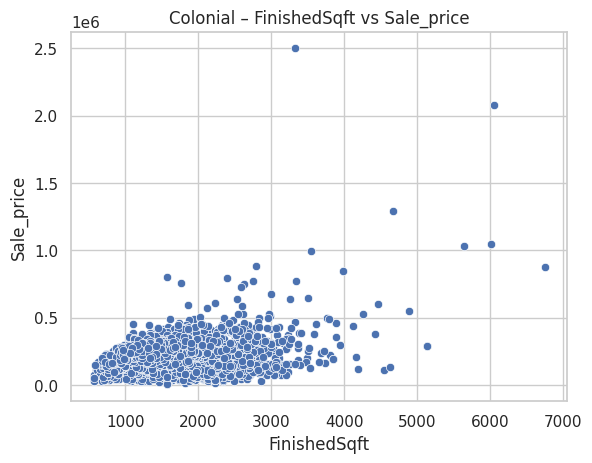

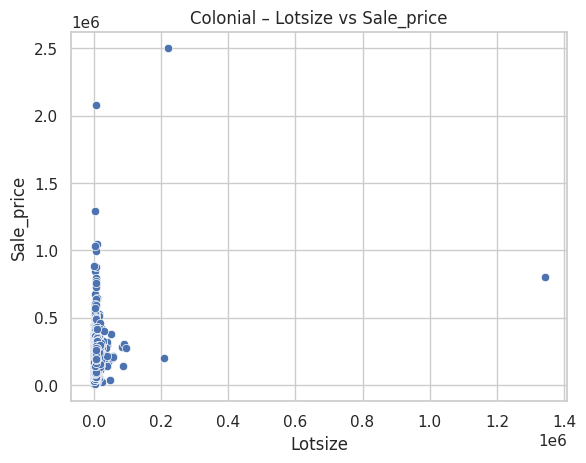

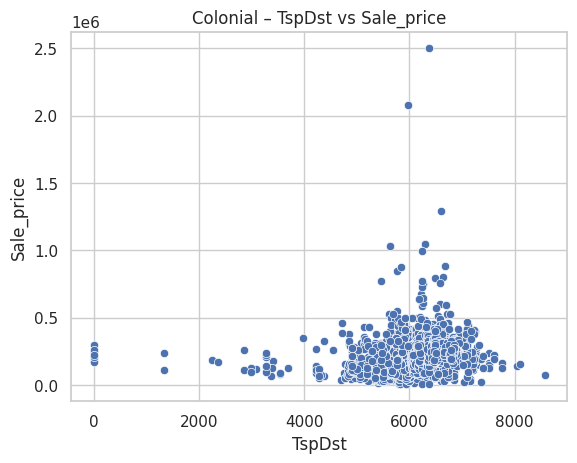

In [ ]:
for feature in ['FinishedSqft', 'Lotsize', 'TspDst']:
    sns.scatterplot(data=combined_df, x=feature, y='Sale_price')
    plt.title(f"Colonial – {feature} vs Sale_price")
    plt.show()

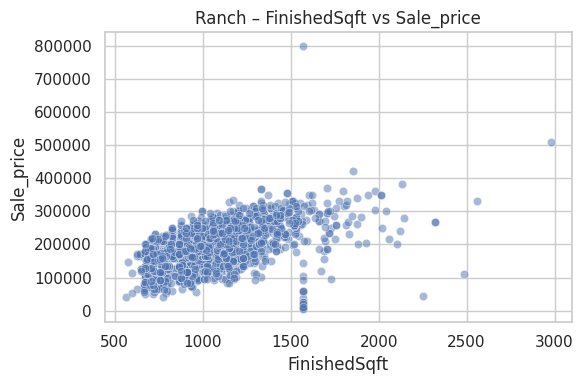

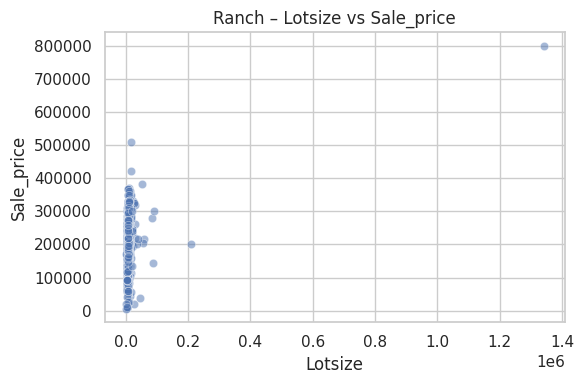

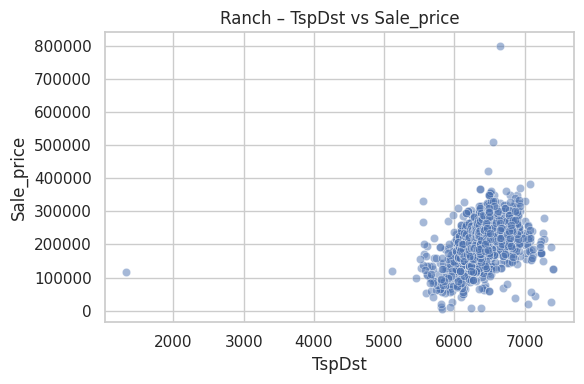

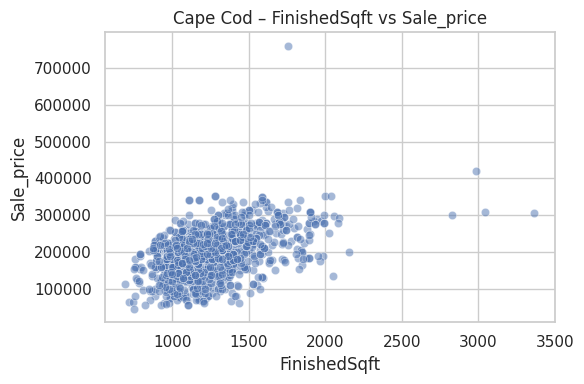

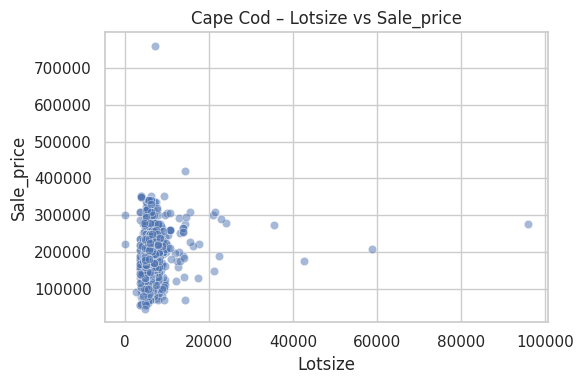

...

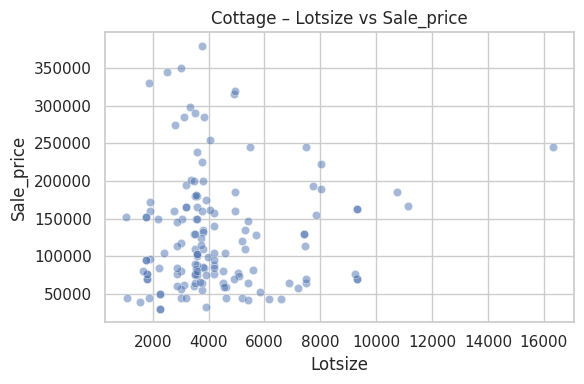

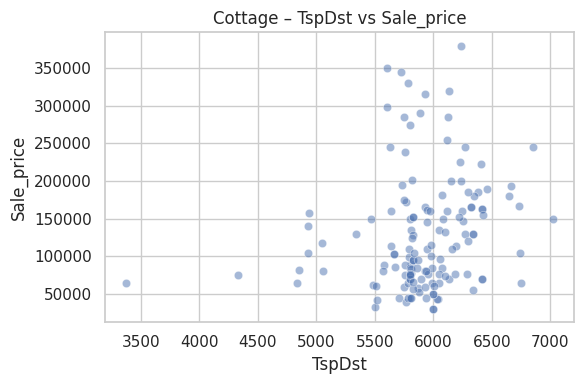

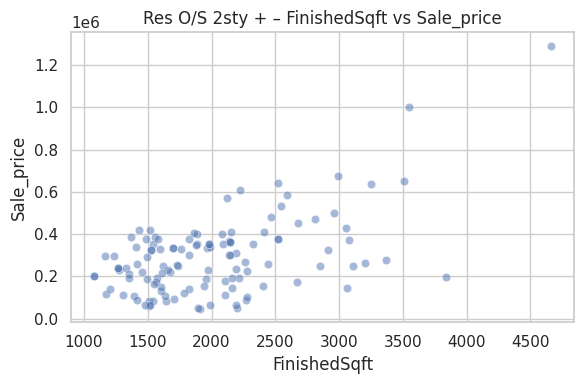

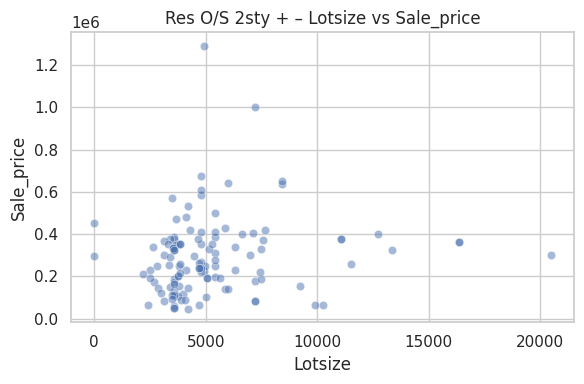

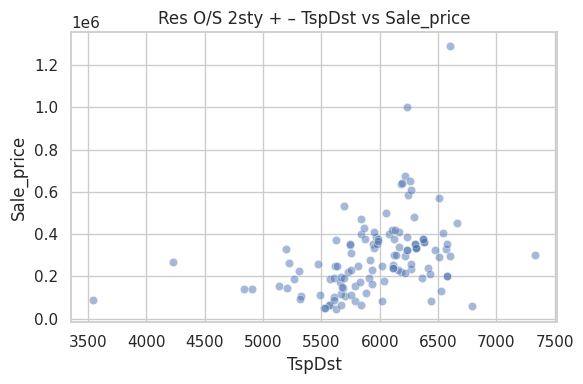

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of relevant styles (≥100 samples)
min_required = 100
style_counts = combined_df['Style'].value_counts()
valid_styles = style_counts[style_counts >= min_required].index

# List of features to plot
features_to_plot = ['FinishedSqft', 'Lotsize', 'TspDst']

# Loop through each style and each feature
for style in valid_styles:
    df_style = combined_df[combined_df['Style'] == style]
    for feature in features_to_plot:
        plt.figure(figsize=(6, 4))
        sns.scatterplot(data=df_style, x=feature, y='Sale_price', alpha=0.5)
        plt.title(f"{style} – {feature} vs Sale_price")
        plt.xlabel(feature)
        plt.ylabel("Sale_price")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

Best Params: {'max_depth': None, 'min_samples_leaf': 5, 'n_estimators': 50}
Train R²: 0.843


<ipython-input-178-d21a530aa231>:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')


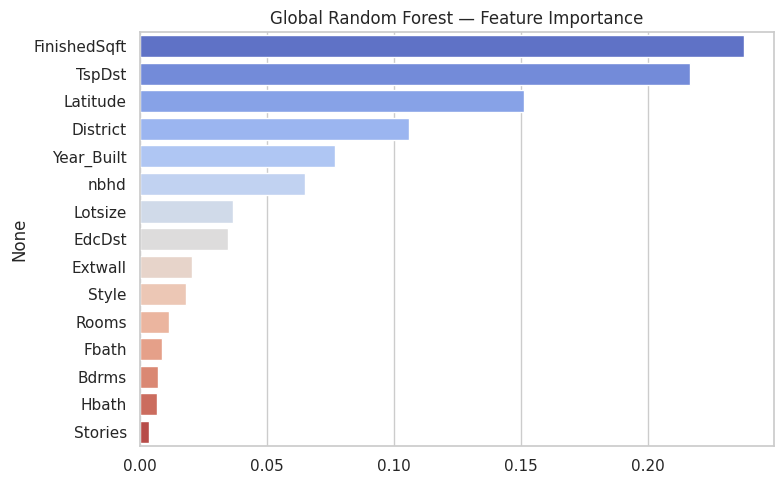

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Clean + Encode
df = combined_df.copy()
df = df[df['Style'].isin(valid_styles)]

# Encode categorical features
df['nbhd'] = df['nbhd'].astype(str)
label_encoders = {}
for col in ['Style', 'Extwall', 'District', 'nbhd']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))
    label_encoders[col] = le

# Step 2: Define Features and Target
features = [
    'FinishedSqft', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'Rooms', 'Bdrms', 'Lotsize', 'TspDst', 'EdcDst', 'Latitude',
    'Extwall', 'District', 'nbhd', 'Style'  # Include Style now
]
target = 'Sale_price'

X = df[features]
y = df[target]

# Step 3: Grid Search for best parameters
param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [5, 10, None],
    'min_samples_leaf': [1, 3, 5]
}

grid = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, cv=3, scoring='r2', n_jobs=-1)
grid.fit(X, y)

# Step 4: Evaluate
best_model = grid.best_estimator_

r2_train = r2_score(y, best_model.predict(X))
print(f"Best Params: {grid.best_params_}")
print(f"Train R²: {r2_train:.3f}")

# Step 5: Feature Importance
importances = pd.Series(best_model.feature_importances_, index=features).sort_values(ascending=False)
plt.figure(figsize=(8, 5))
sns.barplot(x=importances.values, y=importances.index, palette='coolwarm')
plt.title("Global Random Forest — Feature Importance")
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

# Step 1: Prepare data
X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 2: Train Random Forest
rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
rf.fit(X_train, y_train)
r2_train_rf = r2_score(y_train, rf.predict(X_train))
r2_test_rf = r2_score(y_test, rf.predict(X_test))

# Step 3: Train Extra Trees
et = ExtraTreesRegressor(n_estimators=100, max_depth=10, random_state=42)
et.fit(X_train, y_train)
r2_train_et = r2_score(y_train, et.predict(X_train))
r2_test_et = r2_score(y_test, et.predict(X_test))

# Step 4: Print results
print("🌲 Random Forest")
print(f"Train R²: {r2_train_rf:.3f}")
print(f"Test R²:  {r2_test_rf:.3f}\n")

print("🌳 Extra Trees")
print(f"Train R²: {r2_train_et:.3f}")
print(f"Test R²:  {r2_test_et:.3f}")

🌲 Random Forest
Train R²: 0.855
Test R²:  0.685

🌳 Extra Trees
Train R²: 0.833
Test R²:  0.662


In [ ]:
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeRegressor

bagging = BaggingRegressor(
    estimator=DecisionTreeRegressor(max_depth=10),
    n_estimators=100,
    random_state=42
)

bagging.fit(X_train, y_train)
r2_train_bag = r2_score(y_train, bagging.predict(X_train))
r2_test_bag = r2_score(y_test, bagging.predict(X_test))

print("🌾 Bagging Regressor")
print(f"Train R²: {r2_train_bag:.3f}")
print(f"Test R²:  {r2_test_bag:.3f}")

🌾 Bagging Regressor
Train R²: 0.855
Test R²:  0.684



🌲 Random Forest
Best Params: {'max_depth': None, 'max_features': 0.7, 'min_samples_leaf': 3, 'n_estimators': 100}
Train R²: 0.8832464404402307
Test  R²: 0.7297809638366817


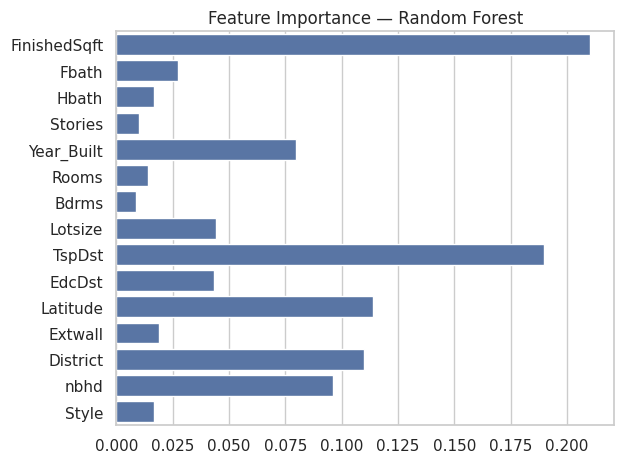


🌳 Extra Trees
Best Params: {'max_depth': None, 'max_features': 0.7, 'min_samples_leaf': 3, 'n_estimators': 100}
Train R²: 0.8959486374318816
Test  R²: 0.7235621970374917


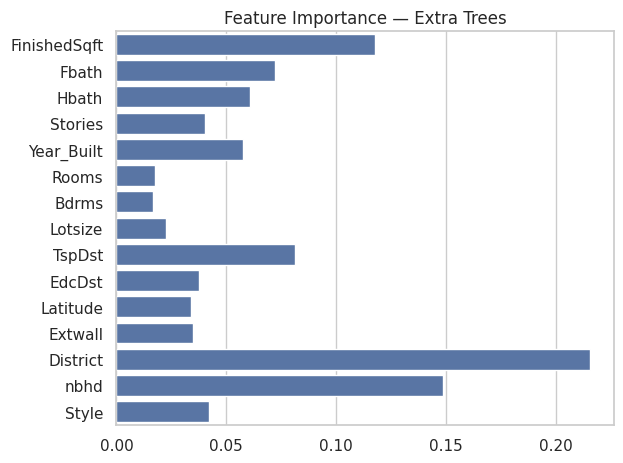


🌾 Bagging Regressor
Best Params: {'estimator__max_depth': None, 'estimator__min_samples_leaf': 3, 'n_estimators': 100}
Train R²: 0.884024797278756
Test  R²: 0.7194364925782866


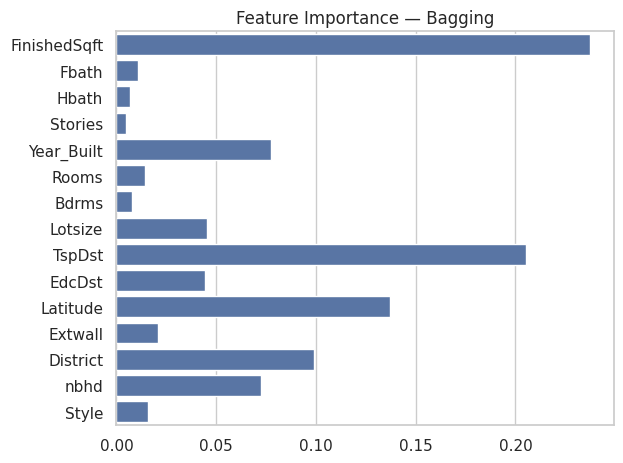

In [ ]:
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- Step 1: Clean + Encode ---
df = combined_df.copy()
df = df[df['Style'].isin(valid_styles)]
df['nbhd'] = df['nbhd'].astype(str)

label_encoders = {}
for col in ['Style', 'Extwall', 'District', 'nbhd']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))
    label_encoders[col] = le

features = [
    'FinishedSqft', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'Rooms', 'Bdrms', 'Lotsize', 'TspDst', 'EdcDst', 'Latitude',
    'Extwall', 'District', 'nbhd', 'Style'
]
target = 'Sale_price'

X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- Common Param Grid (with regularization) ---
param_grid = {
    'n_estimators': [100],
    'max_depth': [10, 15, None],
    'min_samples_leaf': [3, 5, 10],
    'max_features': ['sqrt', 0.7]
}

# --- 1. Random Forest ---
grid_rf = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, cv=3, scoring='r2', n_jobs=-1)
grid_rf.fit(X_train, y_train)
best_rf = grid_rf.best_estimator_

print("\n🌲 Random Forest")
print("Best Params:", grid_rf.best_params_)
print("Train R²:", r2_score(y_train, best_rf.predict(X_train)))
print("Test  R²:", r2_score(y_test, best_rf.predict(X_test)))

sns.barplot(x=best_rf.feature_importances_, y=features)
plt.title("Feature Importance — Random Forest")
plt.tight_layout()
plt.show()

# --- 2. Extra Trees ---
grid_et = GridSearchCV(ExtraTreesRegressor(random_state=42), param_grid, cv=3, scoring='r2', n_jobs=-1)
grid_et.fit(X_train, y_train)
best_et = grid_et.best_estimator_

print("\n🌳 Extra Trees")
print("Best Params:", grid_et.best_params_)
print("Train R²:", r2_score(y_train, best_et.predict(X_train)))
print("Test  R²:", r2_score(y_test, best_et.predict(X_test)))

sns.barplot(x=best_et.feature_importances_, y=features)
plt.title("Feature Importance — Extra Trees")
plt.tight_layout()
plt.show()

# --- 3. Bagging Regressor (with tuned DTs) ---
bagging_param_grid = {
    'n_estimators': [100],
    'estimator__max_depth': [10, 15, None],
    'estimator__min_samples_leaf': [3, 5, 10]
}
bag = BaggingRegressor(estimator=DecisionTreeRegressor(), random_state=42)
grid_bag = GridSearchCV(bag, bagging_param_grid, cv=3, scoring='r2', n_jobs=-1)
grid_bag.fit(X_train, y_train)
best_bag = grid_bag.best_estimator_

print("\n🌾 Bagging Regressor")
print("Best Params:", grid_bag.best_params_)
print("Train R²:", r2_score(y_train, best_bag.predict(X_train)))
print("Test  R²:", r2_score(y_test, best_bag.predict(X_test)))

importances = pd.Series([
    est.feature_importances_ for est in best_bag.estimators_ if hasattr(est, "feature_importances_")
]).mean(axis=0)

sns.barplot(x=importances, y=features)
plt.title("Feature Importance — Bagging")
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, ExtraTreesRegressor, BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score

# Step 1: Define base models with best params
rf = RandomForestRegressor(
    n_estimators=100, max_depth=None, max_features=0.7, min_samples_leaf=3, random_state=42
)
et = ExtraTreesRegressor(
    n_estimators=100, max_depth=None, max_features=0.7, min_samples_leaf=3, random_state=42
)
bag = BaggingRegressor(
    estimator=DecisionTreeRegressor(max_depth=None, min_samples_leaf=3),
    n_estimators=100, random_state=42
)

# Step 2: Meta-model
meta_model = Ridge(alpha=1.0)

# Step 3: Stacking Regressor
stacked_model = StackingRegressor(
    estimators=[('rf', rf), ('et', et), ('bag', bag)],
    final_estimator=meta_model,
    passthrough=True,  # includes original features in meta-model
    n_jobs=-1,
    cv=5
)

# Step 4: Train and evaluate
stacked_model.fit(X_train, y_train)

r2_train = r2_score(y_train, stacked_model.predict(X_train))
r2_test = r2_score(y_test, stacked_model.predict(X_test))

print("\n📦 Stacked Model (Parallel Ensemble)")
print(f"Train R²: {r2_train:.3f}")
print(f"Test  R²: {r2_test:.3f}")


📦 Stacked Model (Parallel Ensemble)
Train R²: 0.914
Test  R²: 0.735


In [ ]:
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, BaggingRegressor, StackingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import r2_score
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- Step 1: Preprocess Data ---
df = combined_df.copy()
df = df[df['Style'].isin(valid_styles)]
df['nbhd'] = df['nbhd'].astype(str)

# Label Encoding categorical columns
label_encoders = {}
for col in ['Style', 'Extwall', 'District', 'nbhd']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))
    label_encoders[col] = le

# Define features and target
features = [
    'FinishedSqft', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'Rooms', 'Bdrms', 'Lotsize', 'TspDst', 'EdcDst', 'Latitude',
    'Extwall', 'District', 'nbhd', 'Style'
]
target = 'Sale_price'

X = df[features]
y = df[target]

# --- Step 2: Split Data ---
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- Step 3: Define Base Models with Regularization ---
rf = RandomForestRegressor(
    n_estimators=100,
    max_depth=15,
    min_samples_leaf=5,
    max_features=0.7,
    random_state=42
)

et = ExtraTreesRegressor(
    n_estimators=100,
    max_depth=15,
    min_samples_leaf=5,
    max_features=0.7,
    random_state=42
)

bag = BaggingRegressor(
    estimator=DecisionTreeRegressor(max_depth=15, min_samples_leaf=5),
    n_estimators=100,
    random_state=42
)

# --- Step 4: Meta-model (Ridge Regression with stronger regularization) ---
meta_model = Ridge(alpha=10.0)

# --- Step 5: Define KFold CV (partitioning strategy) ---
cv_strategy = KFold(n_splits=5, shuffle=True, random_state=42)

# --- Step 6: Stacking Regressor ---
stacked_model = StackingRegressor(
    estimators=[('rf', rf), ('et', et), ('bag', bag)],
    final_estimator=meta_model,
    passthrough=False,  # less risk of overfitting
    cv=cv_strategy,
    n_jobs=-1
)

# --- Step 7: Train and Evaluate ---
stacked_model.fit(X_train, y_train)

r2_train = r2_score(y_train, stacked_model.predict(X_train))
r2_test = r2_score(y_test, stacked_model.predict(X_test))

print("\n📦 Final Stacked Model (RandomForest + ExtraTrees + Bagging)")
print(f"Train R²: {r2_train:.3f}")
print(f"Test  R²: {r2_test:.3f}")


📦 Final Stacked Model (RandomForest + ExtraTrees + Bagging)
Train R²: 0.846
Test  R²: 0.714


In [ ]:
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import r2_score
import pandas as pd

# --- Step 1: Prepare data ---
df = combined_df.copy()
df = df[df['Style'].isin(valid_styles)]
df['nbhd'] = df['nbhd'].astype(str)

# Encode categorical columns
label_encoders = {}
for col in ['Style', 'Extwall', 'District', 'nbhd']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))
    label_encoders[col] = le

features = [
    'FinishedSqft', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'Rooms', 'Bdrms', 'Lotsize', 'TspDst', 'EdcDst', 'Latitude',
    'Extwall', 'District', 'nbhd', 'Style'
]
target = 'Sale_price'

X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- Step 2: Define parameter grids ---
xgb_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 6, 10],
    'learning_rate': [0.05, 0.1],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

lgb_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [5, 10, -1],
    'learning_rate': [0.05, 0.1],
    'subsample': [0.8, 1.0]
}

# --- Step 3: GridSearchCV for XGBoost ---
xgb_model = GridSearchCV(
    XGBRegressor(random_state=42, verbosity=0),
    xgb_param_grid,
    scoring='r2',
    cv=3,
    n_jobs=-1
)
xgb_model.fit(X_train, y_train)

# --- Step 4: GridSearchCV for LightGBM ---
lgb_model = GridSearchCV(
    LGBMRegressor(random_state=42),
    lgb_param_grid,
    scoring='r2',
    cv=3,
    n_jobs=-1
)
lgb_model.fit(X_train, y_train)

# --- Step 5: Evaluate ---
print("\n📦 XGBoost")
print("Best Params:", xgb_model.best_params_)
print("Train R²:", r2_score(y_train, xgb_model.predict(X_train)))
print("Test  R²:", r2_score(y_test, xgb_model.predict(X_test)))

print("\n📦 LightGBM")
print("Best Params:", lgb_model.best_params_)
print("Train R²:", r2_score(y_train, lgb_model.predict(X_train)))
print("Test  R²:", r2_score(y_test, lgb_model.predict(X_test)))

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1613
[LightGBM] [Info] Number of data points in the train set: 4516, number of used features: 15
[LightGBM] [Info] Start training from score 199563.261293
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

In [ ]:
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import Ridge
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score

# Use your best models from GridSearch (recreate them with best params)
xgb_best = XGBRegressor(
    colsample_bytree=0.8,
    learning_rate=0.1,
    max_depth=6,
    n_estimators=200,
    subsample=1.0,
    random_state=42,
    verbosity=0
)

lgb_best = LGBMRegressor(
    learning_rate=0.1,
    max_depth=5,
    n_estimators=200,
    subsample=0.8,
    random_state=42
)

# Meta-model
meta_model = Ridge(alpha=10)

# KFold CV
cv_strategy = KFold(n_splits=5, shuffle=True, random_state=42)

# Stacking
stacked_boost = StackingRegressor(
    estimators=[
        ('xgb', xgb_best),
        ('lgb', lgb_best)
    ],
    final_estimator=meta_model,
    passthrough=False,
    cv=cv_strategy,
    n_jobs=-1
)

# Fit and evaluate
stacked_boost.fit(X_train, y_train)

r2_train = r2_score(y_train, stacked_boost.predict(X_train))
r2_test = r2_score(y_test, stacked_boost.predict(X_test))

print("\n📦 Stacked Sequential Model (XGBoost + LightGBM)")
print(f"Train R²: {r2_train:.3f}")
print(f"Test  R²:  {r2_test:.3f}")


📦 Stacked Sequential Model (XGBoost + LightGBM)
Train R²: 0.941
Test  R²:  0.764


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

# STEP 1: Prepare data (you’ve already encoded it)
X = df[features]
y = df[target]

# STEP 2: Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# STEP 3: Fit best model from grid search
best_model = grid.best_estimator_
best_model.fit(X_train, y_train)

# STEP 4: Evaluate
train_r2 = r2_score(y_train, best_model.predict(X_train))
test_r2 = r2_score(y_test, best_model.predict(X_test))

print(f"Train R²: {train_r2:.3f}")
print(f"Test R²:  {test_r2:.3f}")

Train R²: 0.829
Test R²:  0.704


In [ ]:
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

# Features and target (already encoded)
X = df[features]
y = df[target]

# Train/Test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ---- 1. LightGBM ----
lgbm_model = LGBMRegressor(random_state=42)
lgbm_model.fit(X_train, y_train)

r2_train_lgbm = r2_score(y_train, lgbm_model.predict(X_train))
r2_test_lgbm = r2_score(y_test, lgbm_model.predict(X_test))

print("📦 LightGBM")
print(f"Train R²: {r2_train_lgbm:.3f}")
print(f"Test R²:  {r2_test_lgbm:.3f}\n")

# ---- 2. XGBoost ----
xgb_model = XGBRegressor(random_state=42, verbosity=0)
xgb_model.fit(X_train, y_train)

r2_train_xgb = r2_score(y_train, xgb_model.predict(X_train))
r2_test_xgb = r2_score(y_test, xgb_model.predict(X_test))

print("📦 XGBoost")
print(f"Train R²: {r2_train_xgb:.3f}")
print(f"Test R²:  {r2_test_xgb:.3f}")

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1613
[LightGBM] [Info] Number of data points in the train set: 4516, number of used features: 15
[LightGBM] [Info] Start training from score 199563.261293
📦 LightGBM
Train R²: 0.874
Test R²:  0.732

📦 XGBoost
Train R²: 0.963
Test R²:  0.744


In [ ]:
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ---- 1. LightGBM Grid Search ----
lgbm_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [5, 10, -1],  # -1 = no limit
    'learning_rate': [0.05, 0.1],
    'min_child_samples': [10, 20],
    'subsample': [0.8, 1.0]
}

lgbm = LGBMRegressor(random_state=42)
lgbm_grid = GridSearchCV(lgbm, lgbm_param_grid, scoring='r2', cv=3, n_jobs=-1)
lgbm_grid.fit(X_train, y_train)

print("\n✅ Best LightGBM Params:", lgbm_grid.best_params_)
print("Train R²:", r2_score(y_train, lgbm_grid.best_estimator_.predict(X_train)))
print("Test R²: ", r2_score(y_test, lgbm_grid.best_estimator_.predict(X_test)))

# ---- 2. XGBoost Grid Search ----
xgb_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 6, 10],
    'learning_rate': [0.05, 0.1],
    'min_child_weight': [1, 5],
    'subsample': [0.8, 1.0]
}

xgb = XGBRegressor(random_state=42, verbosity=0)
xgb_grid = GridSearchCV(xgb, xgb_param_grid, scoring='r2', cv=3, n_jobs=-1)
xgb_grid.fit(X_train, y_train)

print("\n✅ Best XGBoost Params:", xgb_grid.best_params_)
print("Train R²:", r2_score(y_train, xgb_grid.best_estimator_.predict(X_train)))
print("Test R²: ", r2_score(y_test, xgb_grid.best_estimator_.predict(X_test)))

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1613
[LightGBM] [Info] Number of data points in the train set: 4516, number of used features: 15
[LightGBM] [Info] Start training from score 199563.261293
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

In [ ]:
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
# from catboost import CatBoostRegressor  # Optional, if installed

from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import r2_score
import pandas as pd

# --- Step 1: Preprocess Data ---
df = combined_df.copy()
df = df[df['Style'].isin(valid_styles)]
df['nbhd'] = df['nbhd'].astype(str)

# Encode categoricals
label_encoders = {}
for col in ['Style', 'Extwall', 'District', 'nbhd']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))
    label_encoders[col] = le

features = [
    'FinishedSqft', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'Rooms', 'Bdrms', 'Lotsize', 'TspDst', 'EdcDst', 'Latitude',
    'Extwall', 'District', 'nbhd', 'Style'
]
target = 'Sale_price'

X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- Step 2: Define Parameter Grids ---

# XGBoost
xgb_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [4, 6],
    'learning_rate': [0.05, 0.1],
    'min_child_weight': [3, 5],
    'subsample': [0.8],
    'colsample_bytree': [0.8],
    'reg_alpha': [0, 0.1],
    'reg_lambda': [1, 5]
}

# LightGBM
lgb_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [4, 6],
    'learning_rate': [0.05, 0.1],
    'num_leaves': [20, 31],
    'min_child_samples': [10, 20],
    'subsample': [0.8]
}

# --- Step 3: Fit Grid Searches ---

xgb_model = GridSearchCV(
    XGBRegressor(random_state=42, verbosity=0),
    xgb_param_grid,
    scoring='r2',
    cv=3,
    n_jobs=-1
)

lgb_model = GridSearchCV(
    LGBMRegressor(random_state=42),
    lgb_param_grid,
    scoring='r2',
    cv=3,
    n_jobs=-1
)

xgb_model.fit(X_train, y_train)
lgb_model.fit(X_train, y_train)

# --- Step 4: Evaluate & Print Results ---

print("\n📦 XGBoost (Regularized)")
print("Best Params:", xgb_model.best_params_)
print("Train R²:", r2_score(y_train, xgb_model.predict(X_train)))
print("Test  R²:", r2_score(y_test, xgb_model.predict(X_test)))

print("\n📦 LightGBM (Regularized)")
print("Best Params:", lgb_model.best_params_)
print("Train R²:", r2_score(y_train, lgb_model.predict(X_train)))
print("Test  R²:", r2_score(y_test, lgb_model.predict(X_test)))

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000438 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1613
[LightGBM] [Info] Number of data points in the train set: 4516, number of used features: 15
[LightGBM] [Info] Start training from score 199563.261293
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

In [ ]:
from sklearn.ensemble import StackingRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

# Step 1: Prepare data
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 2: Define base models
base_models = [
    ('xgb', XGBRegressor(n_estimators=200, max_depth=6, learning_rate=0.1, subsample=0.8, random_state=42, verbosity=0)),
    ('lgbm', LGBMRegressor(n_estimators=200, max_depth=10, learning_rate=0.1, min_child_samples=10, subsample=0.8, random_state=42)),
    ('rf', RandomForestRegressor(n_estimators=100, max_depth=None, min_samples_leaf=5, random_state=42))
]

# Step 3: Meta-model (blender)
meta_model = LinearRegression()

# Step 4: Define stacking regressor
stacked_model = StackingRegressor(
    estimators=base_models,
    final_estimator=meta_model,
    cv=5,
    n_jobs=-1,
    passthrough=True  # Includes original features in final estimator
)

# Step 5: Train and evaluate
stacked_model.fit(X_train, y_train)

r2_train = r2_score(y_train, stacked_model.predict(X_train))
r2_test = r2_score(y_test, stacked_model.predict(X_test))

print("\n📦 Stacked Model")
print(f"Train R²: {r2_train:.3f}")
print(f"Test R²:  {r2_test:.3f}")


📦 Stacked Model
Train R²: 0.934
Test R²:  0.764


In [ ]:
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import r2_score
import pandas as pd

# --- Step 1: Preprocess ---
df = combined_df.copy()
df = df[df['Style'].isin(valid_styles)]
df['nbhd'] = df['nbhd'].astype(str)

# Encode categorical columns
label_encoders = {}
for col in ['Style', 'Extwall', 'District', 'nbhd']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))
    label_encoders[col] = le

features = [
    'FinishedSqft', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'Rooms', 'Bdrms', 'Lotsize', 'TspDst', 'EdcDst', 'Latitude',
    'Extwall', 'District', 'nbhd', 'Style'
]
target = 'Sale_price'

X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- Step 2: Base Models (Tuned) ---
xgb_best = XGBRegressor(
    colsample_bytree=0.8,
    learning_rate=0.1,
    max_depth=6,
    min_child_weight=3,
    n_estimators=200,
    reg_alpha=0.1,
    reg_lambda=5,
    subsample=0.8,
    random_state=42,
    verbosity=0
)

lgb_best = LGBMRegressor(
    learning_rate=0.1,
    max_depth=6,
    min_child_samples=10,
    n_estimators=200,
    num_leaves=31,
    subsample=0.8,
    random_state=42
)

# --- Step 3: Meta Model ---
meta_model = Ridge(alpha=10)

# --- Step 4: Stacking Model ---
stacked_model = StackingRegressor(
    estimators=[('xgb', xgb_best), ('lgb', lgb_best)],
    final_estimator=meta_model,
    passthrough=True,  # includes raw features
    cv=KFold(n_splits=5, shuffle=True, random_state=42),
    n_jobs=-1
)

# --- Step 5: Train and Evaluate ---
stacked_model.fit(X_train, y_train)
r2_train = r2_score(y_train, stacked_model.predict(X_train))
r2_test = r2_score(y_test, stacked_model.predict(X_test))

print("\n📦 Final Stacked Model (XGB + LGBM + passthrough)")
print(f"Train R²: {r2_train:.3f}")
print(f"Test  R²:  {r2_test:.3f}")


📦 Final Stacked Model (XGB + LGBM + passthrough)
Train R²: 0.919
Test  R²:  0.761


In [ ]:
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, BaggingRegressor, StackingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import r2_score
import pandas as pd

# --- Step 1: Preprocess ---
df = combined_df.copy()
df = df[df['Style'].isin(valid_styles)]
df['nbhd'] = df['nbhd'].astype(str)

# Encode categoricals
for col in ['Style', 'Extwall', 'District', 'nbhd']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))

features = [
    'FinishedSqft', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'Rooms', 'Bdrms', 'Lotsize', 'TspDst', 'EdcDst', 'Latitude',
    'Extwall', 'District', 'nbhd', 'Style'
]
target = 'Sale_price'

X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- Step 2: Define Base Models ---
xgb_model = XGBRegressor(
    colsample_bytree=0.8, learning_rate=0.1, max_depth=6,
    min_child_weight=3, n_estimators=200, reg_alpha=0.1,
    reg_lambda=5, subsample=0.8, random_state=42, verbosity=0
)

lgb_model = LGBMRegressor(
    learning_rate=0.1, max_depth=6, min_child_samples=10,
    n_estimators=200, num_leaves=31, subsample=0.8, random_state=42
)

rf_model = RandomForestRegressor(
    n_estimators=100, max_depth=15, min_samples_leaf=5,
    max_features=0.7, random_state=42
)

et_model = ExtraTreesRegressor(
    n_estimators=100, max_depth=15, min_samples_leaf=5,
    max_features=0.7, random_state=42
)

bag_model = BaggingRegressor(
    estimator=DecisionTreeRegressor(max_depth=15, min_samples_leaf=5),
    n_estimators=100, random_state=42
)

# --- Step 3: Meta-Model ---
meta_model = Ridge(alpha=10.0)

# --- Step 4: Define Hybrid Stack ---
hybrid_stack = StackingRegressor(
    estimators=[
        ('xgb', xgb_model),
        ('lgb', lgb_model),
        ('rf', rf_model),
        ('et', et_model),
        ('bag', bag_model)
    ],
    final_estimator=meta_model,
    passthrough=True,
    cv=KFold(n_splits=5, shuffle=True, random_state=42),
    n_jobs=-1
)

# --- Step 5: Train and Evaluate ---
hybrid_stack.fit(X_train, y_train)
r2_train = r2_score(y_train, hybrid_stack.predict(X_train))
r2_test = r2_score(y_test, hybrid_stack.predict(X_test))

print("\n📦 Final Hybrid Stack (XGB + LGBM + RF + ET + Bagging)")
print(f"Train R²: {r2_train:.3f}")
print(f"Test  R²:  {r2_test:.3f}")


📦 Final Hybrid Stack (XGB + LGBM + RF + ET + Bagging)
Train R²: 0.912
Test  R²:  0.755


✅ RMSE: 44847.93
✅ R² Score: 0.709


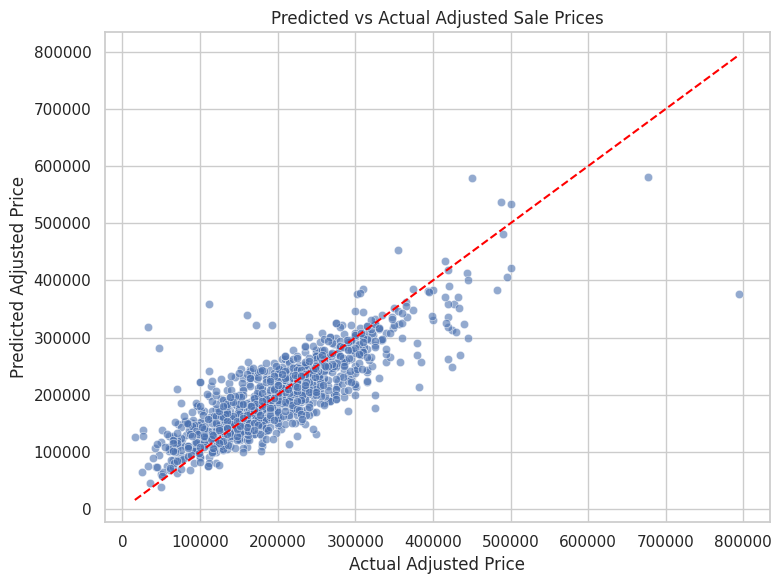

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. Define features and target ---
features = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'TspNum_fixed', 'TspDst_fixed', 'AtrNum_fixed', 'AtrDst_fixed',
    'EdcNum_fixed', 'EdcDst_fixed', 'HthNum_fixed', 'HthDst_fixed',
    'RstNum_fixed', 'RstDst_fixed', 'RtlNum_fixed', 'RtlDst_fixed',
    'Style'  # categorical
]

target = "Sale_price"

# --- 2. Drop rows with missing values in features or target ---
df_model = combined_df.dropna(subset=features + [target])

# --- 3. Train-test split ---
X = df_model[features]
y = df_model[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- 4. Preprocessing: OneHot encode Style, passthrough numerics ---
categorical = ['Style']
numeric = [col for col in features if col not in categorical]

preprocessor = ColumnTransformer(
    transformers=[
        ('num', 'passthrough', numeric),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical)
    ]
)

# --- 5. Pipeline with RandomForest ---
model = Pipeline(steps=[
    ('preprocess', preprocessor),
    ('regressor', RandomForestRegressor(n_estimators=100, random_state=42))
])

# --- 6. Fit the model ---
model.fit(X_train, y_train)

# --- 7. Predict & Evaluate ---
y_pred = model.predict(X_test)

# Use manual sqrt to avoid version issues with `squared=False`
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"✅ RMSE: {rmse:.2f}")
print(f"✅ R² Score: {r2:.3f}")

# --- 8. Plot Actual vs Predicted ---
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
plt.xlabel("Actual Adjusted Price")
plt.ylabel("Predicted Adjusted Price")
plt.title("Predicted vs Actual Adjusted Sale Prices")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
plt.tight_layout()
plt.savefig("predicted_vs_actual_adjusted_price.png", dpi=300)
plt.show()

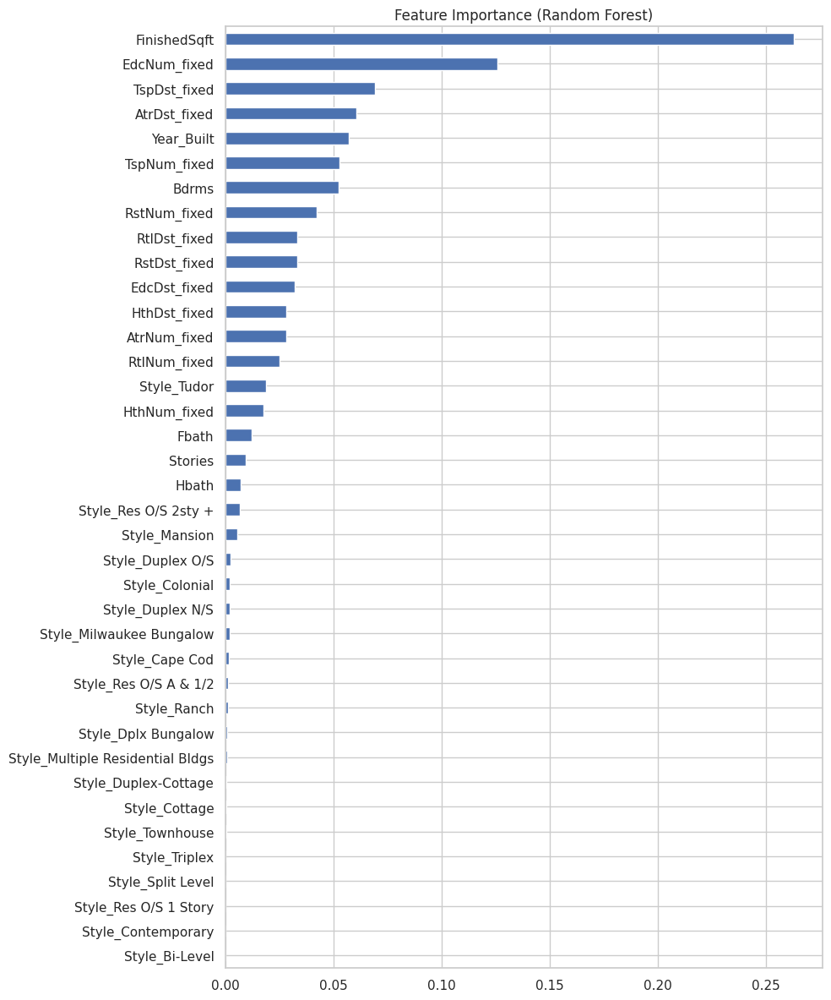

In [ ]:
# Get feature names from one-hot encoder
ohe = model.named_steps['preprocess'].transformers_[1][1]
encoded_styles = ohe.get_feature_names_out(['Style'])

# Combine numeric + encoded
all_features = numeric + list(encoded_styles)

# Get importances
importances = model.named_steps['regressor'].feature_importances_
fi = pd.Series(importances, index=all_features).sort_values(ascending=True)

# Plot
plt.figure(figsize=(10, 12))
fi.plot(kind='barh')
plt.title("Feature Importance (Random Forest)")
plt.tight_layout()
plt.savefig("feature_importance_rf.png", dpi=300)
plt.show()

In [ ]:
# Get importances directly for numeric features
importances = model.named_steps['regressor'].feature_importances_
fi = pd.Series(importances, index=numeric).sort_values(ascending=True)

# Plot
plt.figure(figsize=(10, 8))
fi.plot(kind='barh')
plt.title("Feature Importance (Random Forest)")
plt.tight_layout()
plt.savefig("feature_importance_rf.png", dpi=300)
plt.show()

ValueError: Length of values (38) does not match length of index (18)

In [ ]:
pip install xgboost catboost

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, HistGradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

# --- Feature setup ---
categorical = ['Style']
numeric = [col for col in features if col not in categorical]

preprocessor = ColumnTransformer(
    transformers=[
        ('num', 'passthrough', numeric),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical)
    ]
)

# --- Models to compare ---
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "XGBoost": XGBRegressor(n_estimators=100, random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(n_estimators=100, random_state=42),
    "HistGradient Boosting": HistGradientBoostingRegressor(max_iter=100, random_state=42)
}

# --- Prepare data ---
X = df_model[features]
y = df_model["Sale_price_adjusted"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- Train & evaluate all models ---
results = {}

for name, model_algo in models.items():
    # HistGradientBoosting handles categoricals natively
    if name == "HistGradient Boosting":
        model_algo.fit(X_train[numeric], y_train)
        y_pred = model_algo.predict(X_test[numeric])
    else:
        pipeline = Pipeline(steps=[
            ('preprocess', preprocessor),
            ('regressor', model_algo)
        ])
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_test)

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    results[name] = {"RMSE": rmse, "R²": r2}
    print(f"{name} ➤ RMSE: {rmse:.2f}, R²: {r2:.3f}")

Linear Regression ➤ RMSE: 62766.27, R²: 0.445
Random Forest ➤ RMSE: 44544.21, R²: 0.720
XGBoost ➤ RMSE: 47165.31, R²: 0.686
Gradient Boosting ➤ RMSE: 51239.17, R²: 0.630
HistGradient Boosting ➤ RMSE: 50111.62, R²: 0.646


Dummy Mean ➤ R² Train: 0.000 | R² Test: -0.000
Linear Regression ➤ R² Train: 0.452 | R² Test: 0.445
Ridge Regression ➤ R² Train: 0.451 | R² Test: 0.444
Lasso Regression ➤ R² Train: 0.452 | R² Test: 0.445
Decision Tree ➤ R² Train: 0.564 | R² Test: 0.343


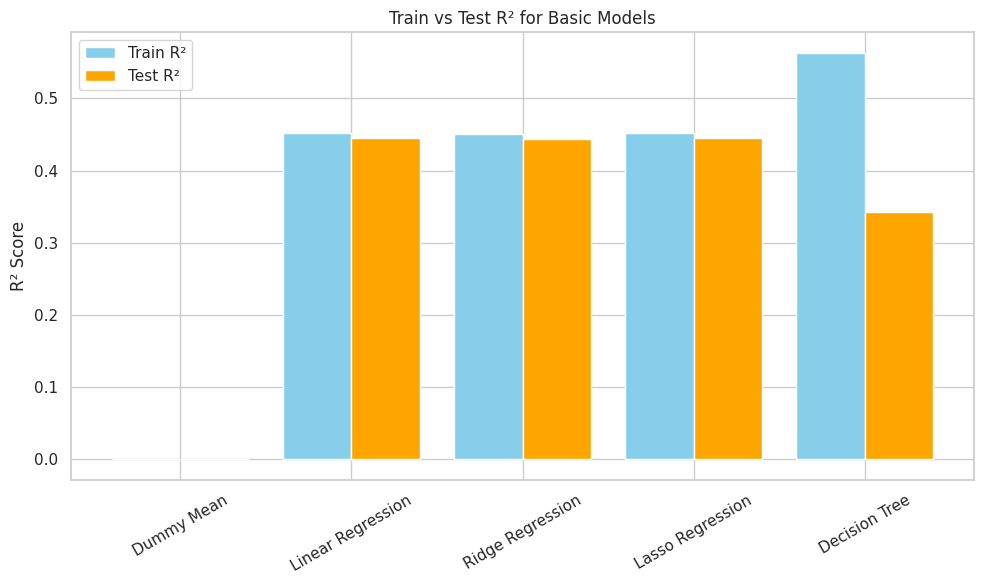

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import r2_score

# --- Prepare Data ---
categorical = ['Style']
numeric = [col for col in features if col not in categorical]

preprocessor = ColumnTransformer(
    transformers=[
        ('num', 'passthrough', numeric),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical)
    ]
)

X = df_model[features]
y = df_model["Sale_price_adjusted"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- Define Models ---
basic_models = {
    "Dummy Mean": DummyRegressor(strategy="mean"),
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(alpha=1.0),
    "Lasso Regression": Lasso(alpha=0.01),
    "Decision Tree": DecisionTreeRegressor(max_depth=5, random_state=42)
}

# --- Train & Evaluate ---
train_scores = []
test_scores = []

for name, model in basic_models.items():
    pipe = Pipeline(steps=[
        ('preprocess', preprocessor),
        ('regressor', model)
    ])
    pipe.fit(X_train, y_train)

    r2_train = pipe.score(X_train, y_train)
    r2_test = pipe.score(X_test, y_test)

    train_scores.append(r2_train)
    test_scores.append(r2_test)

    print(f"{name} ➤ R² Train: {r2_train:.3f} | R² Test: {r2_test:.3f}")

# --- Plot Overfitting/Underfitting ---
plt.figure(figsize=(10, 6))
x_labels = list(basic_models.keys())
x_pos = np.arange(len(x_labels))

plt.bar(x_pos - 0.2, train_scores, width=0.4, label="Train R²", color="skyblue")
plt.bar(x_pos + 0.2, test_scores, width=0.4, label="Test R²", color="orange")
plt.xticks(x_pos, x_labels, rotation=30)
plt.ylabel("R² Score")
plt.title("Train vs Test R² for Basic Models")
plt.legend()
plt.tight_layout()
plt.savefig("basic_models_r2_comparison.png", dpi=300)
plt.show()

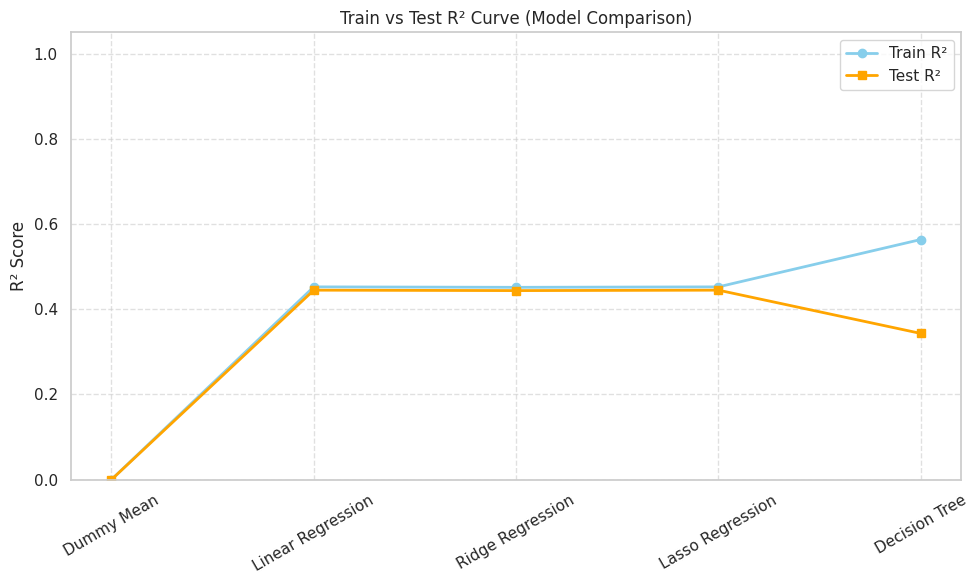

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# x-axis labels (model names)
x_labels = list(basic_models.keys())
x_pos = np.arange(len(x_labels))

# --- Line plot ---
plt.figure(figsize=(10, 6))
plt.plot(x_labels, train_scores, marker='o', label="Train R²", color='skyblue', linewidth=2)
plt.plot(x_labels, test_scores, marker='s', label="Test R²", color='orange', linewidth=2)

plt.xticks(rotation=30)
plt.ylabel("R² Score")
plt.ylim(0, 1.05)
plt.title("Train vs Test R² Curve (Model Comparison)")
plt.grid(True, linestyle="--", alpha=0.6)
plt.legend()
plt.tight_layout()
plt.savefig("basic_models_r2_line_plot.png", dpi=300)
plt.show()

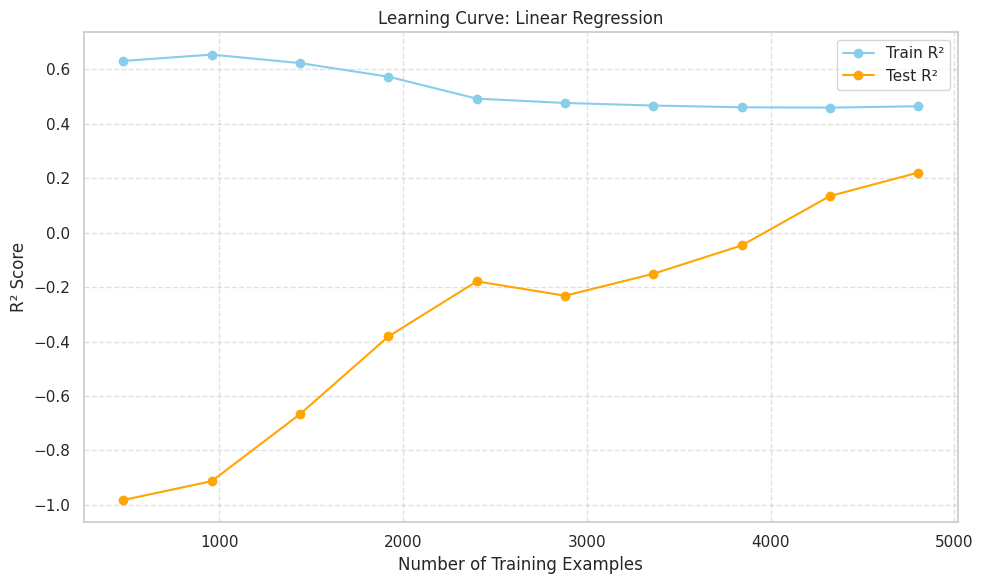

In [ ]:
from sklearn.model_selection import learning_curve
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import numpy as np

# Use pipeline with preprocessing + model
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

# --- Prep data ---
categorical = ['Style']
numeric = [col for col in features if col not in categorical]

preprocessor = ColumnTransformer(
    transformers=[
        ('num', 'passthrough', numeric),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical)
    ]
)

pipe = Pipeline(steps=[
    ('preprocess', preprocessor),
    ('regressor', LinearRegression())
])

X = df_model[features]
y = df_model["Sale_price_adjusted"]

# --- Get learning curve ---
train_sizes, train_scores, test_scores = learning_curve(
    pipe, X, y, cv=5,
    scoring='r2',
    train_sizes=np.linspace(0.1, 1.0, 10),
    random_state=42
)

train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

# --- Plot the learning curve ---
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, 'o-', color="skyblue", label="Train R²")
plt.plot(train_sizes, test_mean, 'o-', color="orange", label="Test R²")

plt.xlabel("Number of Training Examples")
plt.ylabel("R² Score")
plt.title("Learning Curve: Linear Regression")
plt.legend(loc="best")
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.savefig("learning_curve_r2.png", dpi=300)
plt.show()

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

# Preprocessing setup (same as before)
categorical = ['Style']
numeric = [col for col in features if col not in categorical]

preprocessor = ColumnTransformer(
    transformers=[
        ('num', 'passthrough', numeric),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical)
    ]
)

# Split data
X = df_model[features]
y = df_model["Sale_price_adjusted"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# KNN pipeline
knn_pipe = Pipeline(steps=[
    ('preprocess', preprocessor),
    ('regressor', KNeighborsRegressor(n_neighbors=5))
])

knn_pipe.fit(X_train, y_train)
y_pred_knn = knn_pipe.predict(X_test)

rmse_knn = np.sqrt(mean_squared_error(y_test, y_pred_knn))
r2_knn = r2_score(y_test, y_pred_knn)

print(f"KNN Regressor ➤ RMSE: {rmse_knn:.2f}, R²: {r2_knn:.3f}")

KNN Regressor ➤ RMSE: 81748.67, R²: 0.058


Random Forest ➤ R² Train: 0.941 | R² Test: 0.720
XGBoost ➤ R² Train: 0.893 | R² Test: 0.688
Gradient Boosting ➤ R² Train: 0.772 | R² Test: 0.630
HistGradient Boosting ➤ R² Train: 0.817 | R² Test: 0.642


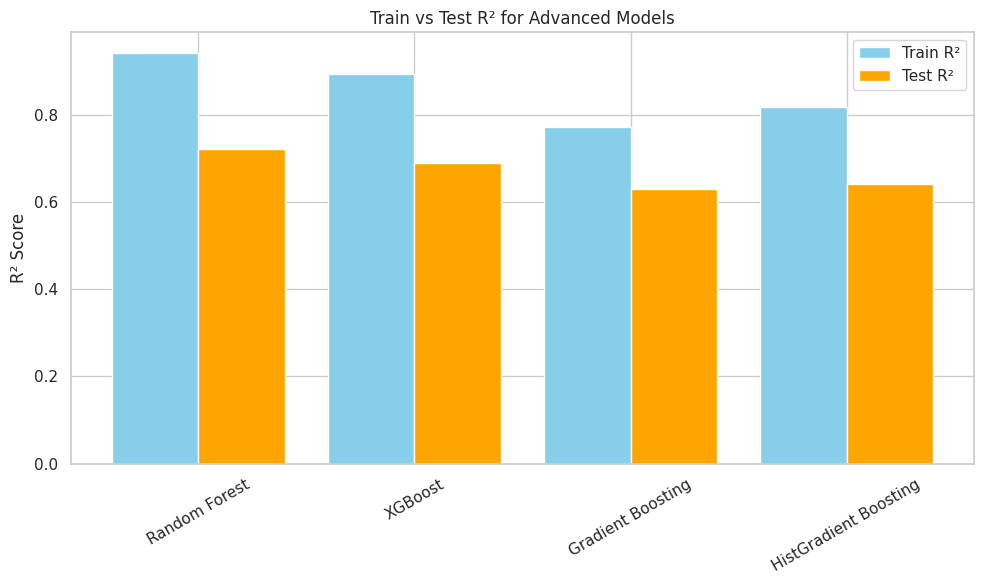

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import r2_score

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, HistGradientBoostingRegressor
from xgboost import XGBRegressor

# --- Features Setup ---
categorical = ['Style']
numeric = [col for col in features if col not in categorical]

# --- Preprocessing Pipeline ---
preprocessor = ColumnTransformer(
    transformers=[
        ('num', 'passthrough', numeric),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical)
    ]
)

# --- Data Split ---
X = df_model[features]
y = df_model["Sale_price_adjusted"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- Define Advanced Models ---
advanced_models = {
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "XGBoost": XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
    "HistGradient Boosting": HistGradientBoostingRegressor(max_iter=100, random_state=42)
}

train_scores = []
test_scores = []

# --- Train & Evaluate Each Model ---
for name, model in advanced_models.items():
    pipe = Pipeline(steps=[
        ('preprocess', preprocessor),
        ('regressor', model)
    ])

    pipe.fit(X_train, y_train)

    r2_train = pipe.score(X_train, y_train)
    r2_test = pipe.score(X_test, y_test)

    train_scores.append(r2_train)
    test_scores.append(r2_test)

    print(f"{name} ➤ R² Train: {r2_train:.3f} | R² Test: {r2_test:.3f}")

# --- Plot Overfitting/Underfitting ---
plt.figure(figsize=(10, 6))
x_labels = list(advanced_models.keys())
x_pos = np.arange(len(x_labels))

plt.bar(x_pos - 0.2, train_scores, width=0.4, label="Train R²", color="skyblue")
plt.bar(x_pos + 0.2, test_scores, width=0.4, label="Test R²", color="orange")
plt.xticks(x_pos, x_labels, rotation=30)
plt.ylabel("R² Score")
plt.title("Train vs Test R² for Advanced Models")
plt.legend()
plt.tight_layout()
plt.savefig("advanced_models_r2_comparison.png", dpi=300)
plt.show()

In [ ]:
df_model.columns

Index(['Address', 'Latitude', 'Longitude', 'TspNum', 'TspDst', 'AtrNum',
       'AtrDst', 'EdcNum', 'EdcDst', 'HthNum', 'HthDst', 'RstNum', 'RstDst',
       'RtlNum', 'RtlDst', 'TspNum_fixed', 'TspDst_fixed', 'AtrNum_fixed',
       'AtrDst_fixed', 'EdcNum_fixed', 'EdcDst_fixed', 'HthNum_fixed',
       'HthDst_fixed', 'RstNum_fixed', 'RstDst_fixed', 'RtlNum_fixed',
       'RtlDst_fixed', 'PropertyID', 'PropType', 'taxkey', 'CondoProject',
       'District', 'nbhd', 'Style', 'Extwall', 'Stories', 'Year_Built',
       'Rooms', 'FinishedSqft', 'Units', 'Bdrms', 'Fbath', 'Hbath', 'Lotsize',
       'Sale_date', 'Sale_price', 'Sale_price_adjusted', 'Sale_price_scaled'],
      dtype='object')

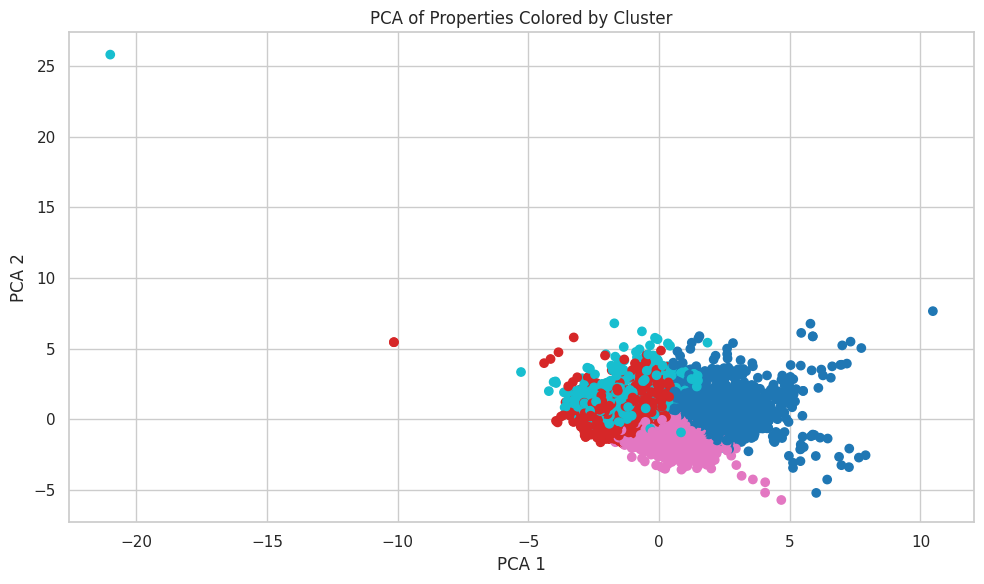

<ipython-input-119-648b52299e56>:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_cluster, x='cluster', y='Sale_price_adjusted', palette='pastel')


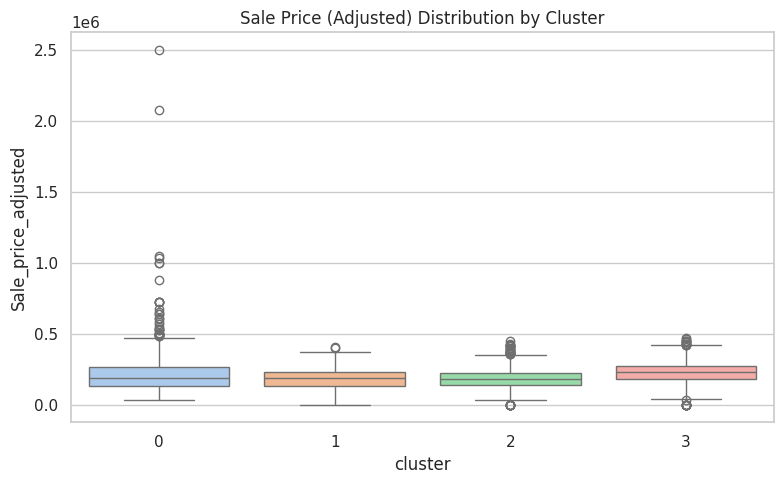

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

import folium
from folium.plugins import MarkerCluster

# --- 1. Select Features for Clustering ---
cluster_features = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories',
    'TspDst_fixed', 'AtrDst_fixed', 'EdcDst_fixed',
    'HthDst_fixed', 'RstDst_fixed', 'RtlDst_fixed'
]

df_cluster = df_model.dropna(subset=cluster_features).copy()
X_cluster = df_cluster[cluster_features]

# --- 2. Scale the Features ---
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster)

# --- 3. Apply KMeans Clustering ---
kmeans = KMeans(n_clusters=4, random_state=42)
df_cluster['cluster'] = kmeans.fit_predict(X_scaled)

# --- 4. Visualize with PCA ---
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=df_cluster['cluster'], cmap='tab10')
plt.title("PCA of Properties Colored by Cluster")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.grid(True)
plt.tight_layout()
plt.savefig("pca_cluster_scatter.png", dpi=300)
plt.show()

# --- 5. Profile Each Cluster ---
cluster_summary = df_cluster.groupby('cluster')[cluster_features + ['Sale_price_adjusted']].mean().round(2)
cluster_summary.to_csv("cluster_summary.csv")

# --- 6. Price Distribution by Cluster ---
plt.figure(figsize=(8, 5))
sns.boxplot(data=df_cluster, x='cluster', y='Sale_price_adjusted', palette='pastel')
plt.title("Sale Price (Adjusted) Distribution by Cluster")
plt.tight_layout()
plt.savefig("price_by_cluster_boxplot.png", dpi=300)
plt.show()

# --- 7. Map Clusters on Folium ---
m = folium.Map(location=[df_cluster['Latitude'].mean(), df_cluster['Longitude'].mean()], zoom_start=12)
marker_cluster = MarkerCluster().add_to(m)

for _, row in df_cluster.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,
        color=f'#{(row["cluster"] * 50) % 256:02x}0033',
        fill=True,
        fill_opacity=0.6
    ).add_to(marker_cluster)

m.save("property_clusters_map.html")

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

import folium
from folium.plugins import MarkerCluster

# --- 1. Select Features for Clustering ---
cluster_features = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories',
    'TspDst_fixed', 'AtrDst_fixed', 'EdcDst_fixed',
    'HthDst_fixed', 'RstDst_fixed', 'RtlDst_fixed'
]

df_cluster = df_model.dropna(subset=cluster_features).copy()
X_cluster = df_cluster[cluster_features]

# --- 2. Scale the Features ---
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster)

# --- 3. Apply KMeans Clustering ---
kmeans = KMeans(n_clusters=4, random_state=42)
df_cluster['cluster'] = kmeans.fit_predict(X_scaled)

# --- 4. PCA Visualization (2D) ---
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=df_cluster['cluster'], cmap='tab10')
plt.title("PCA of Properties Colored by Cluster")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.grid(True)
plt.tight_layout()
plt.savefig("pca_cluster_scatter.png", dpi=300)
plt.close()

# --- 5. Cluster Summary to CSV ---
cluster_summary = df_cluster.groupby('cluster')[cluster_features + ['Sale_price_adjusted']].mean().round(2)
cluster_summary.to_csv("cluster_summary.csv")

# --- 6. Boxplot of Price by Cluster ---
plt.figure(figsize=(8, 5))
sns.boxplot(data=df_cluster, x='cluster', y='Sale_price_adjusted', palette='pastel')
plt.title("Sale Price (Adjusted) Distribution by Cluster")
plt.xlabel("Cluster")
plt.ylabel("Sale Price (Adjusted)")
plt.tight_layout()
plt.savefig("price_by_cluster_boxplot.png", dpi=300)
plt.close()

# --- 7. Folium Map of Clusters ---
m = folium.Map(location=[df_cluster['Latitude'].mean(), df_cluster['Longitude'].mean()], zoom_start=12)
marker_cluster = MarkerCluster().add_to(m)

for _, row in df_cluster.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,
        color=f'#{(row["cluster"] * 50) % 256:02x}0033',
        fill=True,
        fill_opacity=0.6
    ).add_to(marker_cluster)

m.save("property_clusters_map.html")

<ipython-input-120-fa78fedfa7b9>:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_cluster, x='cluster', y='Sale_price_adjusted', palette='pastel')


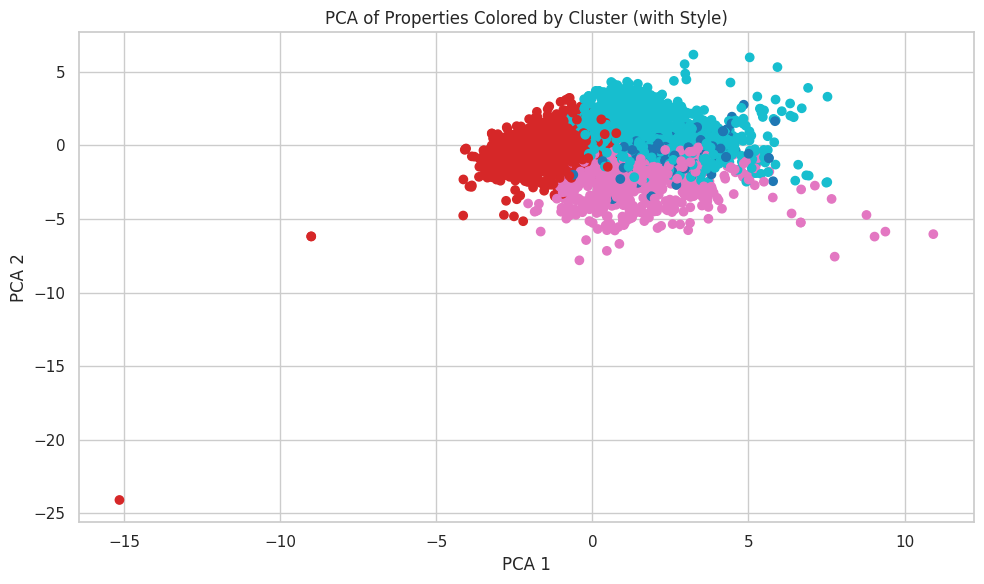

<ipython-input-121-a05c82015f64>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_cluster, x='cluster', y='Sale_price_adjusted', palette='pastel')


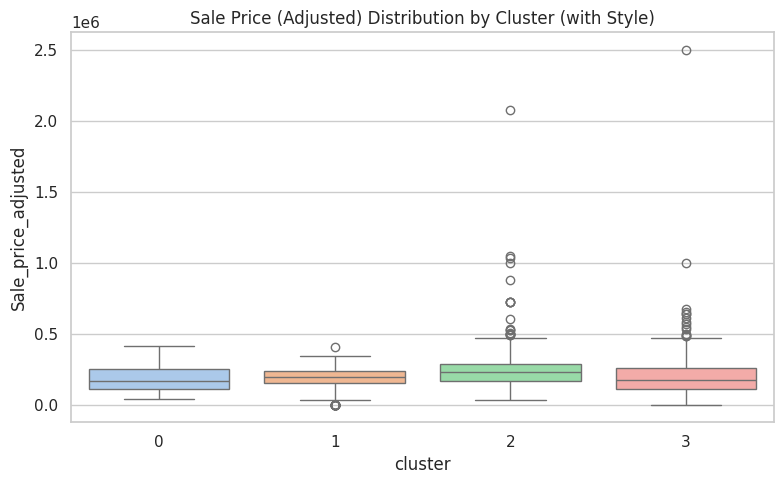

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

import folium
from folium.plugins import MarkerCluster

# --- 1. Select Features for Clustering ---
base_features = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories',
    'TspDst_fixed', 'AtrDst_fixed', 'EdcDst_fixed',
    'HthDst_fixed', 'RstDst_fixed', 'RtlDst_fixed'
]

# Drop rows with missing data for selected features + Style
df_cluster = df_model.dropna(subset=base_features + ['Style']).copy()

# One-hot encode 'Style' and concatenate
style_encoded = pd.get_dummies(df_cluster['Style'], prefix='Style')
X_cluster = pd.concat([df_cluster[base_features], style_encoded], axis=1)

# --- 2. Scale the Features ---
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster)

# --- 3. Apply KMeans Clustering ---
kmeans = KMeans(n_clusters=4, random_state=42)
df_cluster['cluster'] = kmeans.fit_predict(X_scaled)

# --- 4. Visualize with PCA ---
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=df_cluster['cluster'], cmap='tab10')
plt.title("PCA of Properties Colored by Cluster (with Style)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.grid(True)
plt.tight_layout()
plt.savefig("pca_cluster_scatter_with_style.png", dpi=300)
plt.show()

# --- 5. Profile Each Cluster ---
cluster_summary = df_cluster.groupby('cluster')[base_features + ['Sale_price_adjusted']].mean().round(2)
cluster_summary.to_csv("cluster_summary_with_style.csv")

# --- 6. Price Distribution by Cluster ---
plt.figure(figsize=(8, 5))
sns.boxplot(data=df_cluster, x='cluster', y='Sale_price_adjusted', palette='pastel')
plt.title("Sale Price (Adjusted) Distribution by Cluster (with Style)")
plt.tight_layout()
plt.savefig("price_by_cluster_boxplot_with_style.png", dpi=300)
plt.show()

# --- 7. Map Clusters on Folium ---
m = folium.Map(location=[df_cluster['Latitude'].mean(), df_cluster['Longitude'].mean()], zoom_start=12)
marker_cluster = MarkerCluster().add_to(m)

for _, row in df_cluster.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,
        color=f'#{(row["cluster"] * 50) % 256:02x}0033',
        fill=True,
        fill_opacity=0.6
    ).add_to(marker_cluster)

m.save("property_clusters_map_with_style.html")

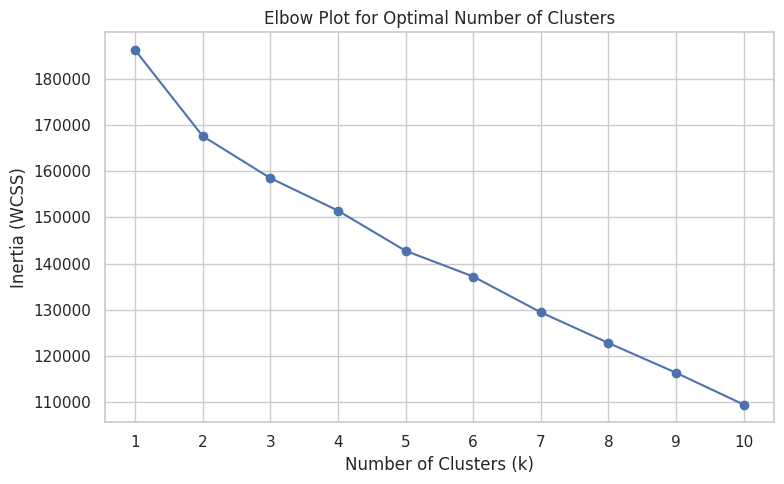

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pandas as pd

# --- Select Features (excluding nbhd) ---
base_features = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories',
    'TspDst_fixed', 'AtrDst_fixed', 'EdcDst_fixed',
    'HthDst_fixed', 'RstDst_fixed', 'RtlDst_fixed'
]

df_cluster = df_model.dropna(subset=base_features + ['Style']).copy()
style_encoded = pd.get_dummies(df_cluster['Style'], prefix='Style')
X_cluster = pd.concat([df_cluster[base_features], style_encoded], axis=1)

# --- Scale Features ---
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster)

# --- Elbow Method ---
inertia = []
k_range = range(1, 11)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# --- Plot Elbow Curve ---
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertia, marker='o')
plt.title("Elbow Plot for Optimal Number of Clusters")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia (WCSS)")
plt.xticks(k_range)
plt.grid(True)
plt.tight_layout()
plt.savefig("elbow_plot_clusters.png", dpi=300)
plt.show()

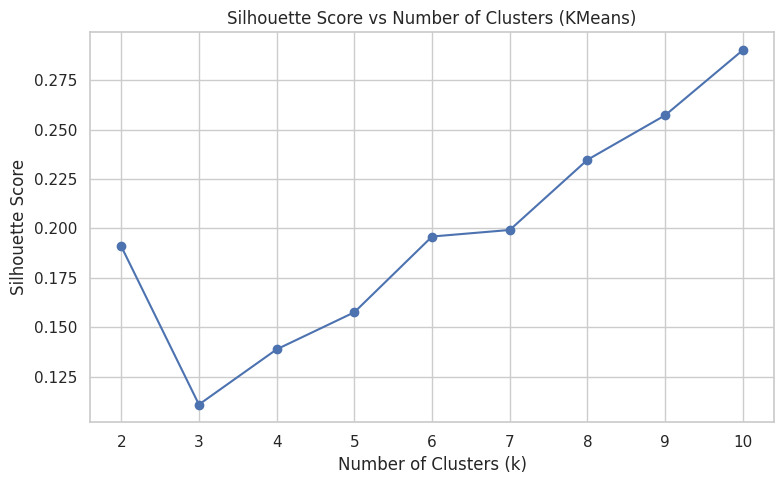

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import pandas as pd

# --- Prepare Data ---
base_features = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories',
    'TspDst_fixed', 'AtrDst_fixed', 'EdcDst_fixed',
    'HthDst_fixed', 'RstDst_fixed', 'RtlDst_fixed'
]

df_cluster = df_model.dropna(subset=base_features + ['Style']).copy()
style_encoded = pd.get_dummies(df_cluster['Style'], prefix='Style')
X_cluster = pd.concat([df_cluster[base_features], style_encoded], axis=1)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster)

# --- Silhouette Scores ---
silhouette_scores = []
k_range = range(2, 11)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(X_scaled)
    score = silhouette_score(X_scaled, cluster_labels)
    silhouette_scores.append(score)

# --- Plot Silhouette Score ---
plt.figure(figsize=(8, 5))
plt.plot(k_range, silhouette_scores, marker='o')
plt.title("Silhouette Score vs Number of Clusters (KMeans)")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.grid(True)
plt.tight_layout()
plt.savefig("silhouette_scores_kmeans.png", dpi=300)
plt.show()

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=10)
X_pca = pca.fit_transform(X_scaled)

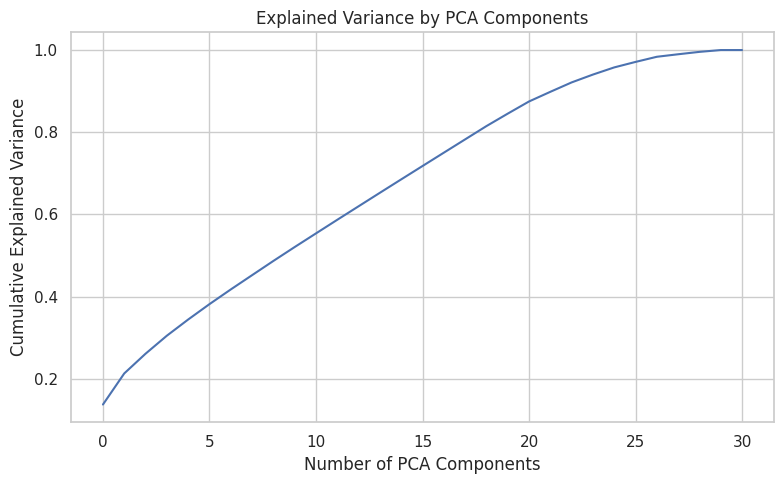

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA().fit(X_scaled)
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Number of PCA Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("Explained Variance by PCA Components")
plt.grid(True)
plt.tight_layout()
plt.show()

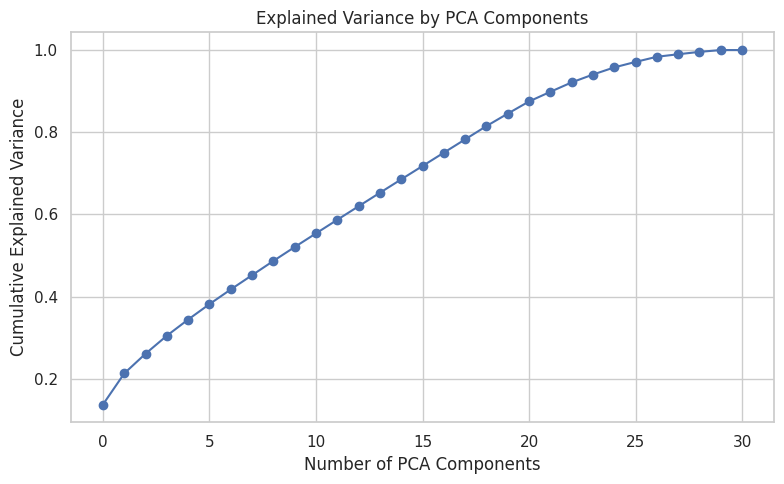

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Assuming X_scaled is already your standardized feature matrix
pca = PCA().fit(X_scaled)

# --- Scree Plot: Cumulative Explained Variance ---
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel("Number of PCA Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("Explained Variance by PCA Components")
plt.grid(True)
plt.tight_layout()
plt.savefig("pca_variance_curve.png", dpi=300)
plt.show()

In [ ]:
pca = PCA(n_components=22)
X_pca = pca.fit_transform(X_scaled)

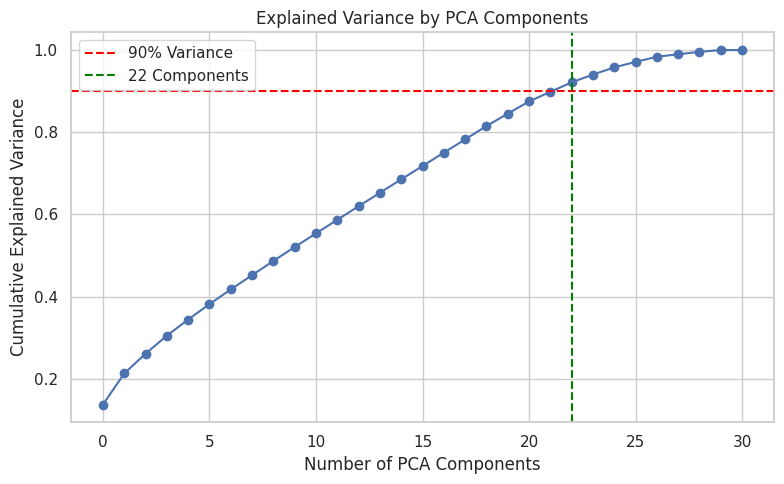

In [ ]:
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA().fit(X_scaled)
cum_var = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(8, 5))
plt.plot(cum_var, marker='o')
plt.axhline(y=0.9, color='red', linestyle='--', label='90% Variance')
plt.axvline(x=np.argmax(cum_var >= 0.9), color='green', linestyle='--', label=f'{np.argmax(cum_var >= 0.9)} Components')
plt.xlabel("Number of PCA Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("Explained Variance by PCA Components")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("pca_variance_annotated.png", dpi=300)
plt.show()

In [ ]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# --- Reduce to 22 PCA Components ---
pca = PCA(n_components=22)
X_pca = pca.fit_transform(X_scaled)

# --- KMeans Clustering ---
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
df_cluster['cluster'] = kmeans.fit_predict(X_pca)

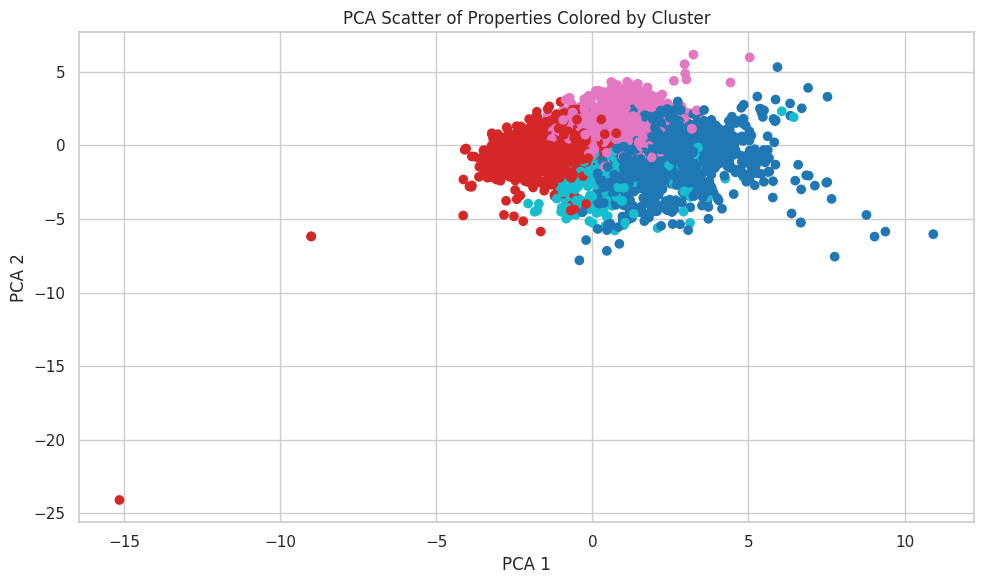

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- 2D PCA for Plot ---
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X_scaled)

# --- PCA Scatter with Cluster Labels ---
plt.figure(figsize=(10, 6))
plt.scatter(X_pca_2d[:, 0], X_pca_2d[:, 1], c=df_cluster['cluster'], cmap='tab10')
plt.title("PCA Scatter of Properties Colored by Cluster")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.grid(True)
plt.tight_layout()
plt.savefig("cluster_pca_scatter_2d.png", dpi=300)
plt.show()

In [ ]:
# --- Analyze Cluster Profiles ---
cluster_profile = df_cluster.groupby('cluster')[
    ['FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories', 'Sale_price_adjusted']
].mean().round(2)

print(cluster_profile)
cluster_profile.to_csv("cluster_profiles.csv")

         FinishedSqft  Bdrms  Fbath  Hbath  Stories  Sale_price_adjusted
cluster                                                                 
0             2141.61   5.21   2.10   0.22     1.78            201268.90
1             1157.04   3.57   1.24   0.34     1.05            193728.21
2             1370.41   3.90   1.41   0.25     1.16            189077.80
3             1728.11   3.98   1.48   0.83     1.99            269159.14


In [ ]:
# Merge cluster info back into df_model
df_model = df_model.merge(df_cluster[['Address', 'cluster']], on='Address', how='left')

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# --- Define Features ---
features = numeric + ['Style', 'cluster']  # include cluster
X = df_model.dropna(subset=features + ['Sale_price_adjusted'])[features]
y = df_model.dropna(subset=features + ['Sale_price_adjusted'])['Sale_price_adjusted']

# --- Preprocessing ---
preprocessor = ColumnTransformer([
    ('num', 'passthrough', [col for col in features if col not in ['Style', 'cluster']]),
    ('cat', OneHotEncoder(handle_unknown='ignore'), ['Style', 'cluster'])
])

# --- Train/Test Split ---
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- Final Model ---
pipe = Pipeline([
    ('preprocess', preprocessor),
    ('model', RandomForestRegressor(n_estimators=100, random_state=42))
])

pipe.fit(X_train, y_train)
r2_train = pipe.score(X_train, y_train)
r2_test = pipe.score(X_test, y_test)

print(f"✅ Random Forest with Cluster ➤ R² Train: {r2_train:.3f} | R² Test: {r2_test:.3f}")

✅ Random Forest with Cluster ➤ R² Train: 0.927 | R² Test: 0.647


Random Forest ➤ R² Train: 0.818, R² Test: 0.606
XGBoost ➤ R² Train: 0.849, R² Test: 0.625
Gradient Boosting ➤ R² Train: 0.683, R² Test: 0.556
HistGradient Boosting ➤ R² Train: 0.800, R² Test: 0.620
Ridge ➤ R² Train: 0.370, R² Test: 0.433


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.772e+12, tolerance: 3.036e+09
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.091e+12, tolerance: 3.456e+09
  model = cd_fast.enet_coordinate_descent(


Lasso ➤ R² Train: 0.370, R² Test: 0.444
KNN ➤ R² Train: 0.490, R² Test: 0.321


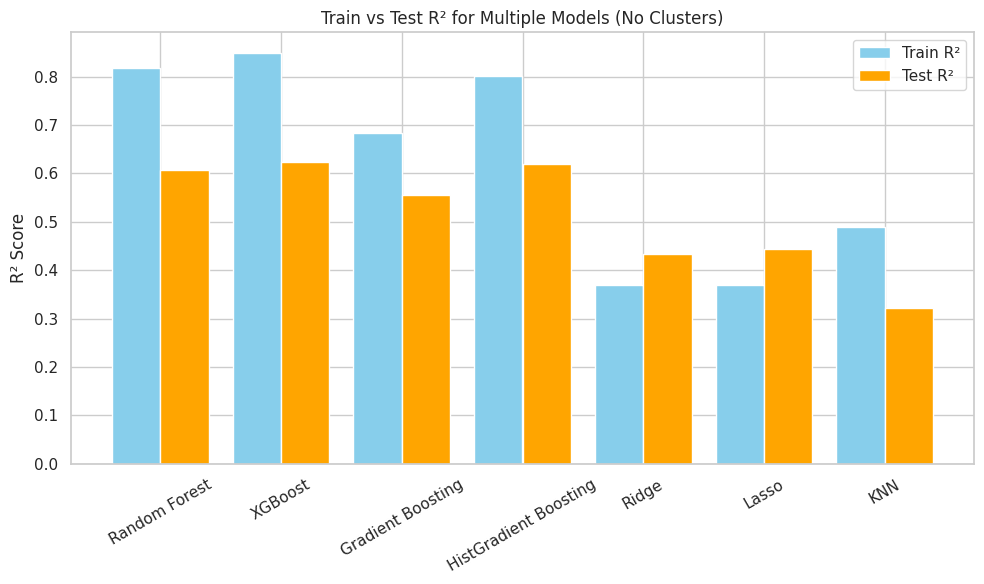

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import r2_score

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, HistGradientBoostingRegressor
from sklearn.linear_model import Ridge, Lasso
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor

# --- Define features ---
categorical = ['Style']
numeric = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories',
    'TspDst_fixed', 'AtrDst_fixed', 'EdcDst_fixed',
    'HthDst_fixed', 'RstDst_fixed', 'RtlDst_fixed'
]
features = numeric + categorical

# --- Clean and split ---
df_clean = df_model.dropna(subset=features + ['Sale_price_adjusted'])
X = df_clean[features]
y = df_clean['Sale_price_adjusted']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- Preprocessor ---
preprocessor = ColumnTransformer([
    ('num', 'passthrough', numeric),
    ('cat', OneHotEncoder(handle_unknown='ignore'), categorical)
])

# --- Define model configs (light search) ---
model_configs = {
    'Random Forest': (RandomForestRegressor(random_state=42), {
        'model__n_estimators': [100],
        'model__max_depth': [10]
    }),
    'XGBoost': (XGBRegressor(random_state=42, verbosity=0), {
        'model__n_estimators': [100],
        'model__max_depth': [6],
        'model__learning_rate': [0.1]
    }),
    'Gradient Boosting': (GradientBoostingRegressor(random_state=42), {
        'model__n_estimators': [100],
        'model__learning_rate': [0.1]
    }),
    'HistGradient Boosting': (HistGradientBoostingRegressor(random_state=42), {
        'model__max_iter': [100],
        'model__learning_rate': [0.1]
    }),
    'Ridge': (Ridge(), {'model__alpha': [1.0]}),
    'Lasso': (Lasso(), {'model__alpha': [0.01]}),
    'KNN': (KNeighborsRegressor(), {'model__n_neighbors': [5]})
}

# --- Train & evaluate ---
results = []

for name, (model, params) in model_configs.items():
    pipe = Pipeline([
        ('preprocess', preprocessor),
        ('model', model)
    ])
    grid = GridSearchCV(pipe, params, cv=3, scoring='r2', n_jobs=1)  # Fixed here
    grid.fit(X_train, y_train)

    best_model = grid.best_estimator_
    r2_train = best_model.score(X_train, y_train)
    r2_test = best_model.score(X_test, y_test)

    print(f"{name} ➤ R² Train: {r2_train:.3f}, R² Test: {r2_test:.3f}")
    results.append((name, r2_train, r2_test))

# --- Create results DataFrame ---
df_results = pd.DataFrame(results, columns=["Model", "Train R²", "Test R²"])

# --- Plot & Save ---
plt.figure(figsize=(10, 6))
x = np.arange(len(df_results))
plt.bar(x - 0.2, df_results["Train R²"], width=0.4, label="Train R²", color="skyblue")
plt.bar(x + 0.2, df_results["Test R²"], width=0.4, label="Test R²", color="orange")
plt.xticks(x, df_results["Model"], rotation=30)
plt.ylabel("R² Score")
plt.title("Train vs Test R² for Multiple Models (No Clusters)")
plt.legend()
plt.tight_layout()
plt.savefig("model_r2_comparison.png", dpi=300)
plt.show()

Bagging (RF) ➤ R² Train: 0.925, R² Test: 0.648
Boosting (XGBoost) ➤ R² Train: 0.849, R² Test: 0.625
Stacking ➤ R² Train: 0.924, R² Test: 0.671


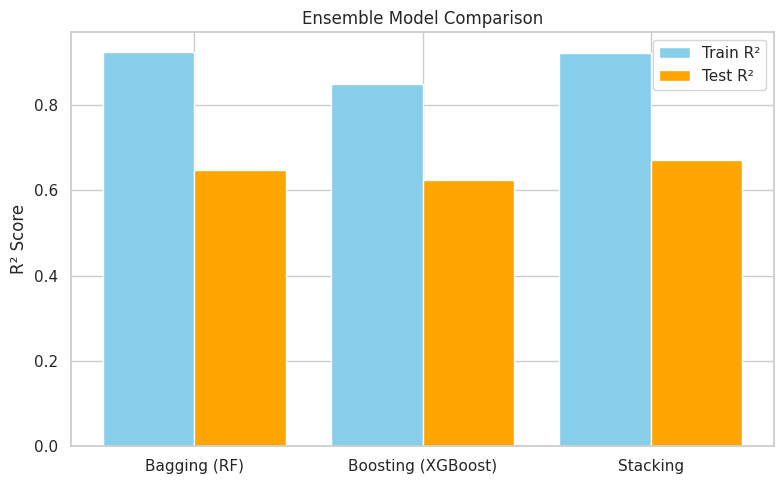

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, HistGradientBoostingRegressor, StackingRegressor
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score

from xgboost import XGBRegressor

# --- Setup ---
categorical = ['Style']
numeric = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories',
    'TspDst_fixed', 'AtrDst_fixed', 'EdcDst_fixed',
    'HthDst_fixed', 'RstDst_fixed', 'RtlDst_fixed'
]
features = numeric + categorical

df_clean = df_model.dropna(subset=features + ['Sale_price_adjusted'])
X = df_clean[features]
y = df_clean['Sale_price_adjusted']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

preprocessor = ColumnTransformer([
    ('num', 'passthrough', numeric),
    ('cat', OneHotEncoder(handle_unknown='ignore'), categorical)
])

# --- Define Ensemble Models ---

# 1. Bagging: Random Forest
bagging_model = Pipeline([
    ('preprocess', preprocessor),
    ('model', RandomForestRegressor(n_estimators=100, random_state=42))
])

# 2. Boosting: XGBoost
boosting_model = Pipeline([
    ('preprocess', preprocessor),
    ('model', XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=6, random_state=42, verbosity=0))
])

# 3. Stacking: Combine RF + Ridge + XGBoost
stacking_model = Pipeline([
    ('preprocess', preprocessor),
    ('model', StackingRegressor(
        estimators=[
            ('rf', RandomForestRegressor(n_estimators=100, random_state=42)),
            ('ridge', Ridge(alpha=1.0)),
            ('xgb', XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=6, random_state=42, verbosity=0))
        ],
        final_estimator=Ridge()
    ))
])

# --- Train & Evaluate ---
ensemble_results = []
for name, model in [('Bagging (RF)', bagging_model),
                    ('Boosting (XGBoost)', boosting_model),
                    ('Stacking', stacking_model)]:

    model.fit(X_train, y_train)
    r2_train = model.score(X_train, y_train)
    r2_test = model.score(X_test, y_test)
    print(f"{name} ➤ R² Train: {r2_train:.3f}, R² Test: {r2_test:.3f}")
    ensemble_results.append((name, r2_train, r2_test))

# --- Plot Results ---
df_ensemble = pd.DataFrame(ensemble_results, columns=["Model", "Train R²", "Test R²"])

plt.figure(figsize=(8, 5))
x = np.arange(len(df_ensemble))
plt.bar(x - 0.2, df_ensemble["Train R²"], width=0.4, label="Train R²", color="skyblue")
plt.bar(x + 0.2, df_ensemble["Test R²"], width=0.4, label="Test R²", color="orange")
plt.xticks(x, df_ensemble["Model"])
plt.ylabel("R² Score")
plt.title("Ensemble Model Comparison")
plt.legend()
plt.tight_layout()
plt.savefig("ensemble_model_comparison.png", dpi=300)
plt.show()

Bagging (RF) ➤ R² Train: 0.925, R² Test: 0.648, R² CV: 0.391
Boosting (XGBoost) ➤ R² Train: 0.849, R² Test: 0.625, R² CV: 0.338
Stacking ➤ R² Train: 0.924, R² Test: 0.671, R² CV: 0.408


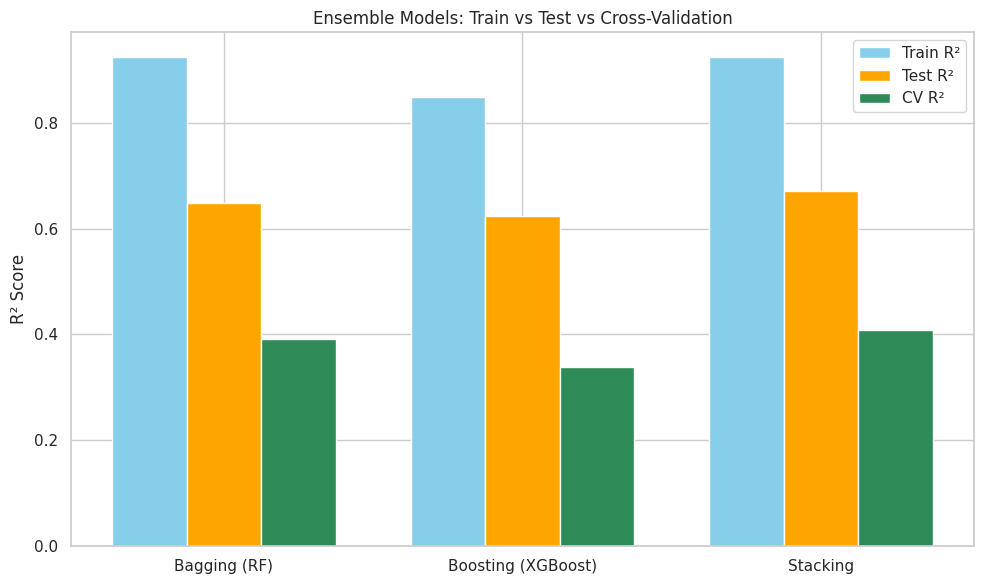

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestRegressor, StackingRegressor
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score
from xgboost import XGBRegressor

# --- Setup ---
categorical = ['Style']
numeric = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories',
    'TspDst_fixed', 'AtrDst_fixed', 'EdcDst_fixed',
    'HthDst_fixed', 'RstDst_fixed', 'RtlDst_fixed'
]
features = numeric + categorical

df_clean = df_model.dropna(subset=features + ['Sale_price_adjusted'])
X = df_clean[features]
y = df_clean['Sale_price_adjusted']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

preprocessor = ColumnTransformer([
    ('num', 'passthrough', numeric),
    ('cat', OneHotEncoder(handle_unknown='ignore'), categorical)
])

# --- Define Ensemble Models ---
bagging_model = Pipeline([
    ('preprocess', preprocessor),
    ('model', RandomForestRegressor(n_estimators=100, random_state=42))
])

boosting_model = Pipeline([
    ('preprocess', preprocessor),
    ('model', XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=6, random_state=42, verbosity=0))
])

stacking_model = Pipeline([
    ('preprocess', preprocessor),
    ('model', StackingRegressor(
        estimators=[
            ('rf', RandomForestRegressor(n_estimators=100, random_state=42)),
            ('ridge', Ridge(alpha=1.0)),
            ('xgb', XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=6, random_state=42, verbosity=0))
        ],
        final_estimator=Ridge()
    ))
])

# --- Train, Evaluate & Cross-Validate ---
ensemble_results = []

for name, model in [('Bagging (RF)', bagging_model),
                    ('Boosting (XGBoost)', boosting_model),
                    ('Stacking', stacking_model)]:

    model.fit(X_train, y_train)
    r2_train = model.score(X_train, y_train)
    r2_test = model.score(X_test, y_test)

    # Cross-validated R² (5-fold)
    cv_scores = cross_val_score(model, X, y, cv=5, scoring='r2')
    r2_cv_mean = np.mean(cv_scores)

    print(f"{name} ➤ R² Train: {r2_train:.3f}, R² Test: {r2_test:.3f}, R² CV: {r2_cv_mean:.3f}")
    ensemble_results.append((name, r2_train, r2_test, r2_cv_mean))

# --- Plot Results ---
df_ensemble = pd.DataFrame(ensemble_results, columns=["Model", "Train R²", "Test R²", "CV R²"])

x = np.arange(len(df_ensemble))
bar_width = 0.25

plt.figure(figsize=(10, 6))
plt.bar(x - bar_width, df_ensemble["Train R²"], width=bar_width, label="Train R²", color="skyblue")
plt.bar(x, df_ensemble["Test R²"], width=bar_width, label="Test R²", color="orange")
plt.bar(x + bar_width, df_ensemble["CV R²"], width=bar_width, label="CV R²", color="seagreen")

plt.xticks(x, df_ensemble["Model"])
plt.ylabel("R² Score")
plt.title("Ensemble Models: Train vs Test vs Cross-Validation")
plt.legend()
plt.tight_layout()
plt.savefig("ensemble_model_cv_comparison.png", dpi=300)
plt.show()

Bagging (RF) ➤ R² Train: 0.555, R² Test: 0.427, R² CV: 0.189
Boosting (XGBoost) ➤ R² Train: 0.745, R² Test: 0.540, R² CV: 0.302
Stacking (Improved) ➤ R² Train: 0.749, R² Test: 0.547, R² CV: 0.324


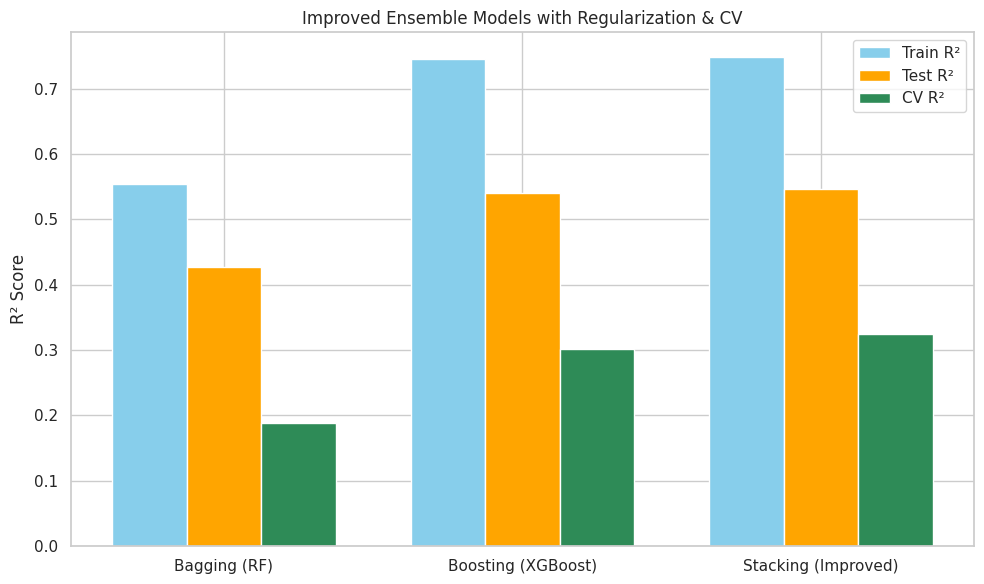

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestRegressor, StackingRegressor
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score
from xgboost import XGBRegressor


# --- Define features ---
categorical = ['Style']
numeric = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories',
    'TspDst_fixed', 'AtrDst_fixed', 'EdcDst_fixed',
    'HthDst_fixed', 'RstDst_fixed', 'RtlDst_fixed'
]
features = numeric + categorical

# --- Drop nulls ---
df_clean = df_model.dropna(subset=features + ['Sale_price_adjusted'])
X = df_clean[features]
y = df_clean['Sale_price_adjusted']

# --- Train-test split ---
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- Preprocessing pipeline ---
preprocessor = ColumnTransformer([
    ('num', 'passthrough', numeric),
    ('cat', OneHotEncoder(handle_unknown='ignore'), categorical)
])

# --- Define Ensemble Models with regularization ---
# 1. Random Forest (Bagging)
bagging_model = Pipeline([
    ('preprocess', preprocessor),
    ('model', RandomForestRegressor(
        n_estimators=100, max_depth=8, min_samples_leaf=4, max_features='sqrt', random_state=42))
])

# 2. XGBoost (Boosting)
boosting_model = Pipeline([
    ('preprocess', preprocessor),
    ('model', XGBRegressor(
        n_estimators=100, learning_rate=0.1, max_depth=4,
        reg_lambda=1, reg_alpha=0.1, random_state=42, verbosity=0))
])

# 3. Stacking
stacking_model = Pipeline([
    ('preprocess', preprocessor),
    ('model', StackingRegressor(
        estimators=[
            ('rf', RandomForestRegressor(n_estimators=100, max_depth=6, random_state=42)),
            ('xgb', XGBRegressor(n_estimators=100, max_depth=4, learning_rate=0.1,
                                 reg_lambda=1, reg_alpha=0.1, random_state=42, verbosity=0))
        ],
        final_estimator=RidgeCV(alphas=np.logspace(-3, 3, 7)),
        cv=5  # Important for avoiding overfitting in stacking
    ))
])

# --- Train, Evaluate & Cross-Validate ---
ensemble_results = []
models = [
    ("Bagging (RF)", bagging_model),
    ("Boosting (XGBoost)", boosting_model),
    ("Stacking (Improved)", stacking_model)
]

for name, model in models:
    model.fit(X_train, y_train)
    r2_train = model.score(X_train, y_train)
    r2_test = model.score(X_test, y_test)
    r2_cv = cross_val_score(model, X, y, cv=5, scoring='r2').mean()

    print(f"{name} ➤ R² Train: {r2_train:.3f}, R² Test: {r2_test:.3f}, R² CV: {r2_cv:.3f}")
    ensemble_results.append((name, r2_train, r2_test, r2_cv))

# --- Plot results ---
df_results = pd.DataFrame(ensemble_results, columns=["Model", "Train R²", "Test R²", "CV R²"])
x = np.arange(len(df_results))
bar_width = 0.25

plt.figure(figsize=(10, 6))
plt.bar(x - bar_width, df_results["Train R²"], width=bar_width, label="Train R²", color="skyblue")
plt.bar(x, df_results["Test R²"], width=bar_width, label="Test R²", color="orange")
plt.bar(x + bar_width, df_results["CV R²"], width=bar_width, label="CV R²", color="seagreen")

plt.xticks(x, df_results["Model"])
plt.ylabel("R² Score")
plt.title("Improved Ensemble Models with Regularization & CV")
plt.legend()
plt.tight_layout()
plt.savefig("improved_ensemble_model_comparison.png", dpi=300)
plt.show()

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
import pandas as pd
import numpy as np

# --- Setup ---
categorical = ['Style']
numeric = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories',
    'TspDst_fixed', 'AtrDst_fixed', 'EdcDst_fixed',
    'HthDst_fixed', 'RstDst_fixed', 'RtlDst_fixed'
]
features = numeric + categorical

df_clean = df_model.dropna(subset=features + ['Sale_price_adjusted'])
X = df_clean[features]
y = df_clean['Sale_price_adjusted']

# --- Preprocessing for model ---
preprocessor = ColumnTransformer([
    ('num', 'passthrough', numeric),
    ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical)
])

# --- Fit Random Forest for Feature Importance ---
rf = Pipeline([
    ('preprocess', preprocessor),
    ('model', RandomForestRegressor(n_estimators=100, random_state=42))
])
rf.fit(X, y)

# --- Get Feature Names from ColumnTransformer ---
cat_encoded_cols = rf.named_steps['preprocess'].named_transformers_['cat'].get_feature_names_out(categorical)
all_feature_names = numeric + list(cat_encoded_cols)

# --- Get Importances and Filter ---
importances = rf.named_steps['model'].feature_importances_
feature_importance_df = pd.DataFrame({
    'feature': all_feature_names,
    'importance': importances
}).sort_values(by='importance', ascending=False)

# Drop features with less than 1% importance
threshold = 0.01
selected_features = feature_importance_df[feature_importance_df['importance'] >= threshold]['feature'].tolist()

print("🔍 Selected features based on importance ≥ 1%:")
print(selected_features)

# --- Optional: Recreate reduced dataset ---
# You can use this to train models only on these features later
reduced_X = rf.named_steps['preprocess'].transform(X)
reduced_X_df = pd.DataFrame(reduced_X, columns=all_feature_names)[selected_features]

🔍 Selected features based on importance ≥ 1%:
['FinishedSqft', 'TspDst_fixed', 'AtrDst_fixed', 'RstDst_fixed', 'EdcDst_fixed', 'RtlDst_fixed', 'Bdrms', 'HthDst_fixed', 'Fbath', 'Stories', 'Style_Res O/S 1 Story', 'Style_Colonial', 'Hbath']


                Model  Train R²   Test R²     CV R²
0        Bagging (RF)  0.923236  0.626777  0.379818
1  Boosting (XGBoost)  0.843434  0.499966  0.326540
2            Stacking  0.927671  0.625015  0.390230


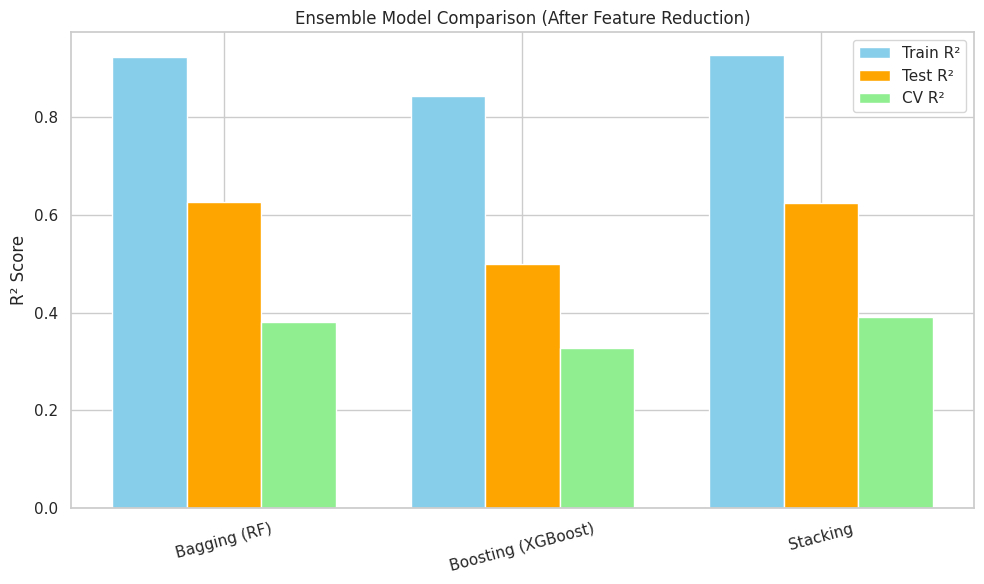

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestRegressor, StackingRegressor
from sklearn.linear_model import Ridge
from xgboost import XGBRegressor

# Assuming df_model already contains these selected columns and 'Sale_price_adjusted'
selected_features = [
    'FinishedSqft', 'TspDst_fixed', 'AtrDst_fixed', 'RstDst_fixed', 'EdcDst_fixed',
    'RtlDst_fixed', 'Bdrms', 'HthDst_fixed', 'Fbath', 'Stories',
    'Hbath'
]

# --- Prepare Data ---
df_clean = df_model.dropna(subset=selected_features + ['Sale_price_adjusted'])
X = df_clean[selected_features]
y = df_clean['Sale_price_adjusted'].reset_index(drop=True)

# --- Train-Test Split ---
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- Define Ensemble Models ---
models = {
    'Bagging (RF)': RandomForestRegressor(n_estimators=100, random_state=42),
    'Boosting (XGBoost)': XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=6, random_state=42, verbosity=0),
    'Stacking': StackingRegressor(
        estimators=[
            ('rf', RandomForestRegressor(n_estimators=100, random_state=42)),
            ('ridge', Ridge(alpha=1.0)),
            ('xgb', XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=6, random_state=42, verbosity=0))
        ],
        final_estimator=Ridge()
    )
}

# --- Train, Test, and Cross-Validate ---
results = []
for name, model in models.items():
    model.fit(X_train, y_train)
    r2_train = model.score(X_train, y_train)
    r2_test = model.score(X_test, y_test)
    r2_cv = cross_val_score(model, X, y, cv=5, scoring='r2').mean()
    results.append((name, r2_train, r2_test, r2_cv))

# --- Results Table ---
results_df = pd.DataFrame(results, columns=["Model", "Train R²", "Test R²", "CV R²"])
print(results_df)

# --- Plot R² Comparison ---
import matplotlib.pyplot as plt

x = np.arange(len(results_df))
bar_width = 0.25

plt.figure(figsize=(10, 6))
plt.bar(x - bar_width, results_df["Train R²"], width=bar_width, label="Train R²", color="skyblue")
plt.bar(x, results_df["Test R²"], width=bar_width, label="Test R²", color="orange")
plt.bar(x + bar_width, results_df["CV R²"], width=bar_width, label="CV R²", color="lightgreen")

plt.xticks(x, results_df["Model"], rotation=15)
plt.ylabel("R² Score")
plt.title("Ensemble Model Comparison (After Feature Reduction)")
plt.legend()
plt.tight_layout()
plt.savefig("ensemble_comparison_after_feature_reduction.png", dpi=300)
plt.show()

✅ Random Forest ➤ RMSE: 44994.92 | R²: 0.715
✅ Gradient Boosting ➤ RMSE: 50556.38 | R²: 0.640
✅ HistGradient Boosting ➤ RMSE: 49771.83 | R²: 0.651
✅ XGBoost ➤ RMSE: 47647.16 | R²: 0.680
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3131
[LightGBM] [Info] Number of data points in the train set: 4804, number of used features: 19
[LightGBM] [Info] Start training from score 198519.357107
✅ LightGBM ➤ RMSE: 49451.14 | R²: 0.655


<ipython-input-140-a0e4bd28ae76>:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=model_names, y=r2_scores, palette="viridis")


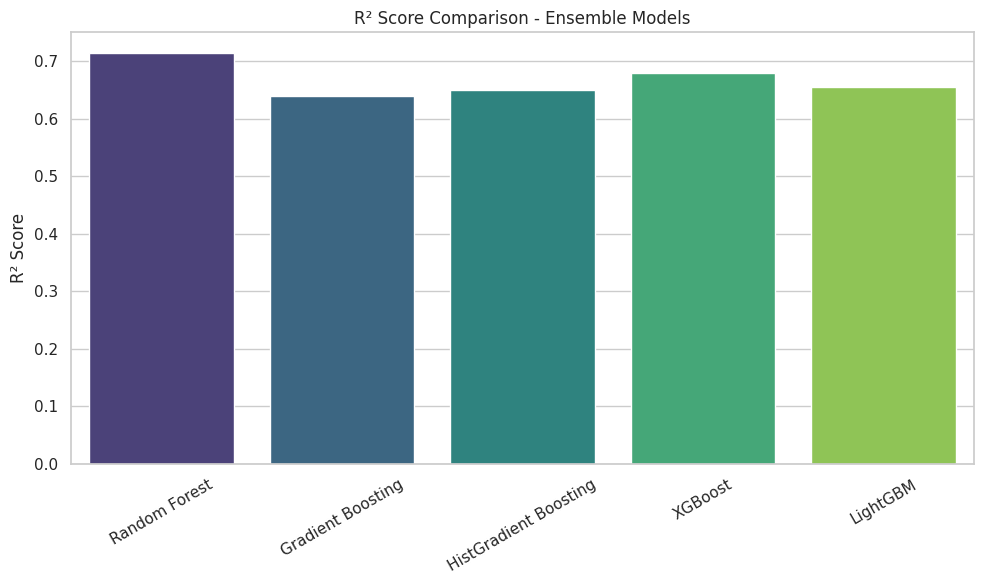

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, HistGradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Optional: If available, use XGBoost and LightGBM
try:
    from xgboost import XGBRegressor
    xgb_available = True
except ImportError:
    xgb_available = False

try:
    from lightgbm import LGBMRegressor
    lgbm_available = True
except ImportError:
    lgbm_available = False

# --- 1. Define features and target ---
features = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'TspNum_fixed', 'TspDst_fixed', 'AtrNum_fixed', 'AtrDst_fixed',
    'EdcNum_fixed', 'EdcDst_fixed', 'HthNum_fixed', 'HthDst_fixed',
    'RstNum_fixed', 'RstDst_fixed', 'RtlNum_fixed', 'RtlDst_fixed',
    'Style'  # categorical
]
target = "Sale_price_adjusted"

# --- 2. Drop missing ---
df_model = combined_df.dropna(subset=features + [target])

# --- 3. Convert categorical to codes for trees ---
df_model['Style_code'] = df_model['Style'].astype('category').cat.codes
features_tree = [col if col != 'Style' else 'Style_code' for col in features]

# --- 4. Split data ---
X = df_model[features_tree]
y = df_model[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- 5. Define ensemble models ---
ensemble_models = {
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(n_estimators=100, random_state=42),
    "HistGradient Boosting": HistGradientBoostingRegressor(random_state=42)
}

if xgb_available:
    ensemble_models["XGBoost"] = XGBRegressor(n_estimators=100, random_state=42)
if lgbm_available:
    ensemble_models["LightGBM"] = LGBMRegressor(n_estimators=100, random_state=42)

# --- 6. Train, predict, evaluate ---
results = []

for name, model in ensemble_models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    results.append((name, rmse, r2))
    print(f"✅ {name} ➤ RMSE: {rmse:.2f} | R²: {r2:.3f}")

# --- 7. Plot Comparison ---
model_names = [r[0] for r in results]
r2_scores = [r[2] for r in results]
rmse_scores = [r[1] for r in results]

plt.figure(figsize=(10, 6))
sns.barplot(x=model_names, y=r2_scores, palette="viridis")
plt.title("R² Score Comparison - Ensemble Models")
plt.ylabel("R² Score")
plt.xticks(rotation=30)
plt.tight_layout()
plt.savefig("ensemble_r2_comparison.png", dpi=300)
plt.show()

✅ Random Forest ➤ R² Train: 0.941 | R² Test: 0.715
✅ Gradient Boosting ➤ R² Train: 0.776 | R² Test: 0.640
✅ HistGradient Boosting ➤ R² Train: 0.819 | R² Test: 0.651
✅ XGBoost ➤ R² Train: 0.963 | R² Test: 0.680
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3131
[LightGBM] [Info] Number of data points in the train set: 4804, number of used features: 19
[LightGBM] [Info] Start training from score 198519.357107
✅ LightGBM ➤ R² Train: 0.824 | R² Test: 0.655


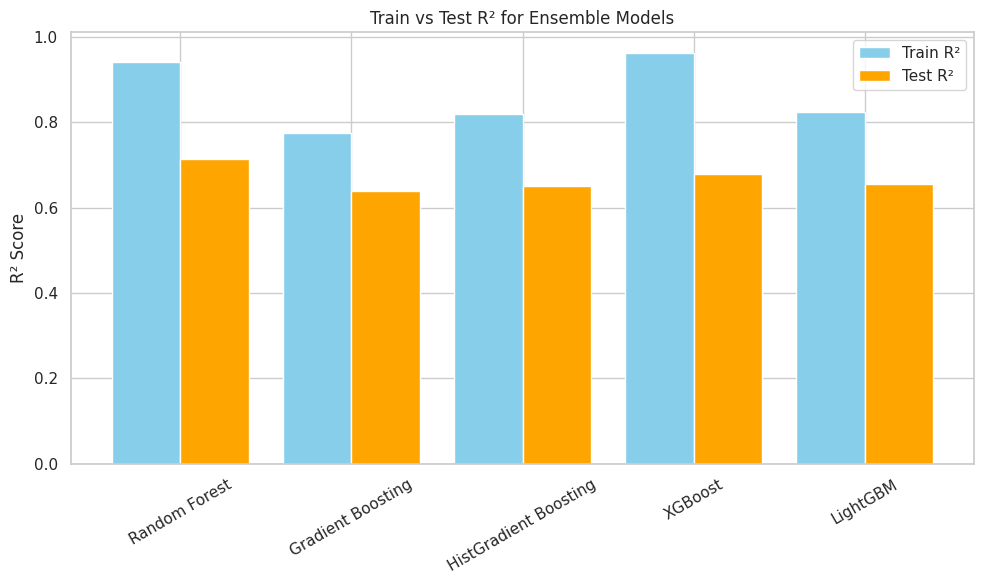

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, HistGradientBoostingRegressor
from sklearn.metrics import r2_score
from sklearn.preprocessing import OneHotEncoder

# Optional: If available, use XGBoost and LightGBM
try:
    from xgboost import XGBRegressor
    xgb_available = True
except ImportError:
    xgb_available = False

try:
    from lightgbm import LGBMRegressor
    lgbm_available = True
except ImportError:
    lgbm_available = False

# --- 1. Prepare data ---
features = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'TspNum_fixed', 'TspDst_fixed', 'AtrNum_fixed', 'AtrDst_fixed',
    'EdcNum_fixed', 'EdcDst_fixed', 'HthNum_fixed', 'HthDst_fixed',
    'RstNum_fixed', 'RstDst_fixed', 'RtlNum_fixed', 'RtlDst_fixed',
    'Style'  # categorical
]
target = "Sale_price_adjusted"

df_model = combined_df.dropna(subset=features + [target])
df_model['Style_code'] = df_model['Style'].astype('category').cat.codes
features_tree = [col if col != 'Style' else 'Style_code' for col in features]

X = df_model[features_tree]
y = df_model[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- 2. Define ensemble models ---
ensemble_models = {
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(n_estimators=100, random_state=42),
    "HistGradient Boosting": HistGradientBoostingRegressor(random_state=42)
}
if xgb_available:
    ensemble_models["XGBoost"] = XGBRegressor(n_estimators=100, random_state=42)
if lgbm_available:
    ensemble_models["LightGBM"] = LGBMRegressor(n_estimators=100, random_state=42)

# --- 3. Train and collect R² scores ---
train_scores = []
test_scores = []

for name, model in ensemble_models.items():
    model.fit(X_train, y_train)
    r2_train = model.score(X_train, y_train)
    r2_test = model.score(X_test, y_test)

    train_scores.append(r2_train)
    test_scores.append(r2_test)

    print(f"✅ {name} ➤ R² Train: {r2_train:.3f} | R² Test: {r2_test:.3f}")

# --- 4. Plot Train vs Test R² ---
x_labels = list(ensemble_models.keys())
x_pos = np.arange(len(x_labels))

plt.figure(figsize=(10, 6))
plt.bar(x_pos - 0.2, train_scores, width=0.4, label="Train R²", color="skyblue")
plt.bar(x_pos + 0.2, test_scores, width=0.4, label="Test R²", color="orange")
plt.xticks(x_pos, x_labels, rotation=30)
plt.ylabel("R² Score")
plt.title("Train vs Test R² for Ensemble Models")
plt.legend()
plt.tight_layout()
plt.savefig("train_vs_test_r2_ensemble.png", dpi=300)
plt.show()

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import r2_score
from scipy.stats import randint

# --- 1. Define parameter distribution for tuning ---
param_dist = {
    'n_estimators': randint(50, 300),
    'max_depth': randint(5, 30),
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 10),
    'max_features': ['auto', 'sqrt', 'log2']
}

# --- 2. Create RandomForestRegressor ---
rf = RandomForestRegressor(random_state=42)

# --- 3. Setup RandomizedSearchCV ---
random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist,
    n_iter=30,               # number of random combinations to try
    cv=5,                    # 5-fold cross-validation
    scoring='r2',            # use R² score
    n_jobs=1,                # ✅ run in serial to avoid multiprocessing issues
    verbose=2,
    random_state=42
)

# --- 4. Fit the search on the training data ---
random_search.fit(X_train, y_train)

# --- 5. Report best parameters and performance ---
best_model = random_search.best_estimator_
print("✅ Best Hyperparameters:", random_search.best_params_)
print(f"✅ Best CV R² Score: {random_search.best_score_:.3f}")

# --- 6. Evaluate on test set ---
y_pred = best_model.predict(X_test)
r2_test = r2_score(y_test, y_pred)
print(f"✅ Tuned Random Forest ➤ R² Test: {r2_test:.3f}")

Fitting 5 folds for each of 30 candidates, totalling 150 fits
[CV] END max_depth=11, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=171; total time=   0.0s
[CV] END max_depth=11, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=171; total time=   0.0s
[CV] END max_depth=11, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=171; total time=   0.0s
[CV] END max_depth=11, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=171; total time=   0.0s
[CV] END max_depth=11, max_features=auto, min_samples_leaf=8, min_samples_split=8, n_estimators=171; total time=   0.0s
[CV] END max_depth=23, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=153; total time=   1.5s
[CV] END max_depth=23, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=153; total time=   1.9s
[CV] END max_depth=23, max_features=log2, min_samples_leaf=8, min_samples_split=5, n_estimators=15

/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
65 fits failed out of a total of 150.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
65 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.11/dist-packages/sklearn/utils/

✅ Best Hyperparameters: {'max_depth': 19, 'max_features': 'sqrt', 'min_samples_leaf': 3, 'min_samples_split': 8, 'n_estimators': 290}
✅ Best CV R² Score: 0.610
✅ Tuned Random Forest ➤ R² Test: 0.649


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

# --- 1. Use the best parameters from RandomizedSearchCV ---
tuned_rf = RandomForestRegressor(
    n_estimators=290,
    max_depth=19,
    max_features='sqrt',
    min_samples_leaf=3,
    min_samples_split=8,
    random_state=42
)

# --- 2. Fit on training data ---
tuned_rf.fit(X_train, y_train)

# --- 3. Predict and score ---
r2_train = tuned_rf.score(X_train, y_train)
r2_test = tuned_rf.score(X_test, y_test)

print(f"🎯 Tuned Random Forest ➤ R² Train: {r2_train:.3f} | R² Test: {r2_test:.3f}")

🎯 Tuned Random Forest ➤ R² Train: 0.810 | R² Test: 0.649


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor, StackingRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score

# --- 1. Define features & target ---
features = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'TspNum_fixed', 'TspDst_fixed', 'AtrNum_fixed', 'AtrDst_fixed',
    'EdcNum_fixed', 'EdcDst_fixed', 'HthNum_fixed', 'HthDst_fixed',
    'RstNum_fixed', 'RstDst_fixed', 'RtlNum_fixed', 'RtlDst_fixed',
    'Style'  # categorical
]
target = "Sale_price_adjusted"

# --- 2. Drop NA values ---
df_model = combined_df.dropna(subset=features + [target])

# --- 3. Train/test split ---
X = df_model[features]
y = df_model[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- 4. Preprocessing: OneHotEncode 'Style' ---
categorical = ['Style']
numeric = [col for col in features if col not in categorical]

preprocessor = ColumnTransformer([
    ('num', 'passthrough', numeric),
    ('cat', OneHotEncoder(handle_unknown='ignore'), categorical)
])

# --- 5. Base models ---
lasso = Pipeline([
    ('preprocess', preprocessor),
    ('regressor', Lasso(alpha=0.1, max_iter=10000, random_state=42))
])

xgb = Pipeline([
    ('preprocess', preprocessor),
    ('regressor', XGBRegressor(n_estimators=100, max_depth=4, learning_rate=0.1, random_state=42))
])

rf = Pipeline([
    ('preprocess', preprocessor),
    ('regressor', RandomForestRegressor(
        n_estimators=290,
        max_depth=19,
        min_samples_split=8,
        min_samples_leaf=3,
        max_features='sqrt',
        random_state=42
    ))
])

# --- 6. Stacking model (passthrough=False to avoid raw string features) ---
stack = StackingRegressor(
    estimators=[
        ('lasso', lasso),
        ('xgb', xgb),
        ('rf', rf)
    ],
    final_estimator=Lasso(alpha=0.05, max_iter=10000),
    passthrough=False,
    n_jobs=1
)

# --- 7. Train & Evaluate All Models ---
models = {
    'Lasso': lasso,
    'XGBoost': xgb,
    'Random Forest': rf,
    'Stacked': stack
}

for name, model in models.items():
    model.fit(X_train, y_train)
    r2_train = model.score(X_train, y_train)
    r2_test = model.score(X_test, y_test)
    print(f"✅ {name} ➤ R² Train: {r2_train:.3f} | R² Test: {r2_test:.3f}")

✅ Lasso ➤ R² Train: 0.452 | R² Test: 0.445
✅ XGBoost ➤ R² Train: 0.814 | R² Test: 0.652
✅ Random Forest ➤ R² Train: 0.796 | R² Test: 0.644
✅ Stacked ➤ R² Train: 0.848 | R² Test: 0.684


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor, HistGradientBoostingRegressor, StackingRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score

# --- 1. Define features & target ---
features = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'TspNum_fixed', 'TspDst_fixed', 'AtrNum_fixed', 'AtrDst_fixed',
    'EdcNum_fixed', 'EdcDst_fixed', 'HthNum_fixed', 'HthDst_fixed',
    'RstNum_fixed', 'RstDst_fixed', 'RtlNum_fixed', 'RtlDst_fixed',
    'Style'
]
target = "Sale_price_adjusted"

df_model = combined_df.dropna(subset=features + [target])

# --- 2. Quick Random Forest for Feature Importance ---
X_feat = df_model[features].copy()
X_feat['Style_code'] = df_model['Style'].astype('category').cat.codes
X_feat = X_feat.drop(columns=['Style'])
y_feat = df_model[target]

rf_temp = RandomForestRegressor(n_estimators=100, random_state=42)
rf_temp.fit(X_feat, y_feat)

importances = rf_temp.feature_importances_
important_features = X_feat.columns[importances > 0.01].tolist()
print("📌 Selected Important Features (above 1%):", important_features)

# --- 3. Update features list (drop Style_code) ---
important_features = [f for f in important_features if f != 'Style_code']
final_features = important_features + ['Style']

# --- 4. Train/test split ---
X = df_model[final_features]
y = df_model[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- 5. Preprocessing ---
categorical = ['Style']
numeric = [col for col in final_features if col not in categorical]

preprocessor = ColumnTransformer([
    ('num', 'passthrough', numeric),
    ('cat', OneHotEncoder(handle_unknown='ignore'), categorical)
])

# --- 6. Define models ---
lasso = Pipeline([
    ('preprocess', preprocessor),
    ('regressor', Lasso(alpha=0.1, max_iter=10000, random_state=42))
])

ridge = Pipeline([
    ('preprocess', preprocessor),
    ('regressor', Ridge(alpha=1.0))
])

xgb = Pipeline([
    ('preprocess', preprocessor),
    ('regressor', XGBRegressor(n_estimators=100, max_depth=4, learning_rate=0.1, random_state=42))
])

lgbm = Pipeline([
    ('preprocess', preprocessor),
    ('regressor', LGBMRegressor(n_estimators=100, learning_rate=0.1, random_state=42))
])

hgb = Pipeline([
    ('preprocess', preprocessor),
    ('regressor', HistGradientBoostingRegressor(max_iter=100, random_state=42))
])

rf = Pipeline([
    ('preprocess', preprocessor),
    ('regressor', RandomForestRegressor(
        n_estimators=290,
        max_depth=19,
        min_samples_split=8,
        min_samples_leaf=3,
        max_features='sqrt',
        random_state=42
    ))
])

# --- 7. Stacking Regressor ---
stack = StackingRegressor(
    estimators=[
        ('lasso', lasso),
        ('ridge', ridge),
        ('xgb', xgb),
        ('lgbm', lgbm),
        ('hgb', hgb),
        ('rf', rf)
    ],
    final_estimator=Ridge(alpha=1.0),
    passthrough=False,
    cv=5,
    n_jobs=1
)

# --- 8. Train & Evaluate ---
models = {
    'Lasso': lasso,
    'XGBoost': xgb,
    'Random Forest': rf,
    'Stacked': stack
}

print("\n🎯 Evaluating Models:")
for name, model in models.items():
    model.fit(X_train, y_train)
    r2_train = model.score(X_train, y_train)
    r2_test = model.score(X_test, y_test)
    print(f"✅ {name} ➤ R² Train: {r2_train:.3f} | R² Test: {r2_test:.3f}")

In [ ]:
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor
from lightgbm import LGBMRegressor
from sklearn.model_selection import RandomizedSearchCV

# --- 1. LightGBM with hyperparameter tuning ---
lgbm_model = LGBMRegressor(random_state=42)

lgbm_params = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [15, 31, 63],
    'max_depth': [-1, 5, 10],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.7, 1.0]
}

lgbm_search = RandomizedSearchCV(
    estimator=lgbm_model,
    param_distributions=lgbm_params,
    n_iter=25,
    scoring='r2',
    cv=5,
    verbose=1,
    n_jobs=-1,
    random_state=42
)

# OneHot encoded pipeline again
lgbm_pipe = Pipeline([
    ('preprocess', preprocessor),
    ('model', lgbm_search)
])

lgbm_pipe.fit(X_train, y_train)
print("🔍 Best LGBM params:", lgbm_search.best_params_)

# --- 2. Tune HistGradientBoostingRegressor ---
hgb_params = {
    'learning_rate': [0.01, 0.05, 0.1],
    'max_iter': [100, 200, 300],
    'max_leaf_nodes': [20, 31, 50],
    'min_samples_leaf': [10, 20, 50]
}

hgb = HistGradientBoostingRegressor(random_state=42)

hgb_search = RandomizedSearchCV(
    estimator=hgb,
    param_distributions=hgb_params,
    n_iter=20,
    scoring='r2',
    cv=5,
    verbose=1,
    n_jobs=-1,
    random_state=42
)

hgb_pipe = Pipeline([
    ('preprocess', preprocessor),
    ('model', hgb_search)
])

hgb_pipe.fit(X_train, y_train)
print("🔍 Best HGB params:", hgb_search.best_params_)

# --- 3. Evaluate both ---
models = {
    "Tuned LightGBM": lgbm_pipe,
    "Tuned HistGradientBoosting": hgb_pipe
}

for name, model in models.items():
    r2_train = model.score(X_train, y_train)
    r2_test = model.score(X_test, y_test)
    print(f"✅ {name} ➤ R² Train: {r2_train:.3f} | R² Test: {r2_test:.3f}")

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import HistGradientBoostingRegressor
from lightgbm import LGBMRegressor
from sklearn.metrics import r2_score

# --- 1. Define features and target ---
features = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'TspNum_fixed', 'TspDst_fixed', 'AtrNum_fixed', 'AtrDst_fixed',
    'EdcNum_fixed', 'EdcDst_fixed', 'HthNum_fixed', 'HthDst_fixed',
    'RstNum_fixed', 'RstDst_fixed', 'RtlNum_fixed', 'RtlDst_fixed',
    'Style'  # categorical
]
target = "Sale_price_adjusted"

# --- 2. Prepare the dataset ---
df_model = combined_df.dropna(subset=features + [target])

X = df_model[features]
y = df_model[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- 3. Preprocessing pipeline ---
categorical = ['Style']
numeric = [col for col in features if col not in categorical]

preprocessor = ColumnTransformer([
    ('num', 'passthrough', numeric),
    ('cat', OneHotEncoder(handle_unknown='ignore'), categorical)
])

# --- 4. LightGBM tuning ---
lgbm_model = LGBMRegressor(random_state=42)
lgbm_params = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [15, 31, 63],
    'max_depth': [-1, 5, 10],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.7, 1.0]
}

lgbm_search = RandomizedSearchCV(
    estimator=lgbm_model,
    param_distributions=lgbm_params,
    n_iter=25,
    scoring='r2',
    cv=5,
    verbose=2,
    n_jobs=1,  # ✅ Prevents BrokenProcessPool error
    random_state=42
)

lgbm_pipe = Pipeline([
    ('preprocess', preprocessor),
    ('model', lgbm_search)
])

# --- 5. HistGradientBoosting tuning ---
hgb_model = HistGradientBoostingRegressor(random_state=42)
hgb_params = {
    'learning_rate': [0.01, 0.05, 0.1],
    'max_iter': [100, 200, 300],
    'max_leaf_nodes': [20, 31, 50],
    'min_samples_leaf': [10, 20, 50]
}

hgb_search = RandomizedSearchCV(
    estimator=hgb_model,
    param_distributions=hgb_params,
    n_iter=20,
    scoring='r2',
    cv=5,
    verbose=2,
    n_jobs=1,  # ✅ Prevents BrokenProcessPool error
    random_state=42
)

hgb_pipe = Pipeline([
    ('preprocess', preprocessor),
    ('model', hgb_search)
])

# --- 6. Fit both models ---
print("\n🔧 Tuning LightGBM...")
lgbm_pipe.fit(X_train, y_train)

print("\n🔧 Tuning HistGradientBoosting...")
hgb_pipe.fit(X_train, y_train)

# --- 7. Evaluate performance ---
models = {
    "Tuned LightGBM": lgbm_pipe,
    "Tuned HistGradientBoosting": hgb_pipe
}

print("\n🎯 Evaluation Results:")
for name, model in models.items():
    r2_train = model.score(X_train, y_train)
    r2_test = model.score(X_test, y_test)
    print(f"✅ {name} ➤ R² Train: {r2_train:.3f} | R² Test: {r2_test:.3f}")

# --- 8. Show best hyperparameters ---
print("\n📌 Best Parameters:")
print("LightGBM:", lgbm_search.best_params_)
print("HistGradientBoosting:", hgb_search.best_params_)


🔧 Tuning LightGBM...
Fitting 5 folds for each of 25 candidates, totalling 125 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198535.911579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198535.911579
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1, n_estimators=100, num_leaves=15, subsample=0.8; total time=   0.1s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 199008.656142


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1, n_estimators=100, num_leaves=15, subsample=0.8; total time=   0.1s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 32
[LightGBM] [Info] Start training from score 198678.703123
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1, n_estimators=100, num_leaves=15, subsample=0.8; total time=   0.1s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1, n_estimators=100, num_leaves=15, subsample=0.8; total time=   0.1s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3121
[LightGBM] [Info] Number of data points in the train set: 3844, number of used features: 32
[LightGBM] [Info] Start training from score 197941.536573
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1, n_estimators=100, num_leaves=15, subsample=0.8; total time=   0.1s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198535.911579
[LightGBM] [Warning] No further splits with po

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1, n_estimators=200, num_leaves=31, subsample=1.0; total time=   0.4s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 199008.656142


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1, n_estimators=200, num_leaves=31, subsample=1.0; total time=   0.5s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 32
[LightGBM] [Info] Start training from score 198678.703123


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1, n_estimators=200, num_leaves=31, subsample=1.0; total time=   0.6s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1, n_estimators=200, num_leaves=31, subsample=1.0; total time=   0.6s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3121
[LightGBM] [Info] Number of data points in the train set: 3844, number of used features: 32
[LightGBM] [Info] Start training from score 197941.536573


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1, n_estimators=200, num_leaves=31, subsample=1.0; total time=   0.6s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198535.911579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=5, n_estimators=100, num_leaves=15, subsample=0.8; total time=   0.2s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 199008.656142


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=5, n_estimators=100, num_leaves=15, subsample=0.8; total time=   0.2s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 32
[LightGBM] [Info] Start training from score 198678.703123


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=5, n_estimators=100, num_leaves=15, subsample=0.8; total time=   0.2s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000460 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=5, n_estimators=100, num_leaves=15, subsample=0.8; total time=   0.2s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3121
[LightGBM] [Info] Number of data points in the train set: 3844, number of used features: 32
[LightGBM] [Info] Start training from score 197941.536573
[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=5, n_estimators=100, num_leaves=15, subsample=0.8; total time=   0.2s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from sc

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.05, max_depth=-1, n_estimators=100, num_leaves=31, subsample=1.0; total time=   0.2s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 199008.656142


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.05, max_depth=-1, n_estimators=100, num_leaves=31, subsample=1.0; total time=   0.2s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 32
[LightGBM] [Info] Start training from score 198678.703123
[CV] END colsample_bytree=1.0, learning_rate=0.05, max_depth=-1, n_estimators=100, num_leaves=31, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474
[CV] END colsample_bytree=1.0, learning_rate=0.05, max_depth=-1, n_estimators=100, num_leaves=31, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3121
[LightGBM] [Info] Number of data points in the train set: 3844, number of used features: 32
[LightGBM] [Info] Start training from score 197941.536573
[CV] END colsample_bytree=1.0, learning_rate=0.05, max_depth=-1, n_estimators=100, num_leaves=31, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198535.911579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=5, n_estimators=300, num_leaves=63, subsample=0.8; total time=   0.4s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 199008.656142
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.05, max_depth=10, n_estimators=300, num_leaves=31, subsample=0.8; total time=   0.5s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 32
[LightGBM] [Info] Start training from score 198678.703123
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=100, num_leaves=15, subsample=0.8; total time=   0.1s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 199008.656142
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=100, num_leaves=15, subsample=0.8; total time=   0.1s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 32
[LightGBM] [Info] Start training from score 198678.703123


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=100, num_leaves=15, subsample=0.8; total time=   0.1s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=100, num_leaves=15, subsample=0.8; total time=   0.1s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3121
[LightGBM] [Info] Number of data points in the train set: 3844, number of used features: 32
[LightGBM] [Info] Start training from score 197941.536573


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=10, n_estimators=100, num_leaves=15, subsample=0.8; total time=   0.1s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198535.911579


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, n_estimators=300, num_leaves=63, subsample=1.0; total time=   1.0s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 199008.656142


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, n_estimators=300, num_leaves=63, subsample=1.0; total time=   1.0s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 32
[LightGBM] [Info] Start training from score 198678.703123


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, n_estimators=300, num_leaves=63, subsample=1.0; total time=   1.1s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, n_estimators=300, num_leaves=63, subsample=1.0; total time=   1.4s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000484 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3121
[LightGBM] [Info] Number of data points in the train set: 3844, number of used features: 32
[LightGBM] [Info] Start training from score 197941.536573


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, n_estimators=300, num_leaves=63, subsample=1.0; total time=   1.7s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000484 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198535.911579


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, n_estimators=100, num_leaves=31, subsample=0.8; total time=   0.4s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 199008.656142


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, n_estimators=100, num_leaves=31, subsample=0.8; total time=   0.3s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 32
[LightGBM] [Info] Start training from score 198678.703123


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, n_estimators=100, num_leaves=31, subsample=0.8; total time=   0.2s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, n_estimators=100, num_leaves=31, subsample=0.8; total time=   0.2s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3121
[LightGBM] [Info] Number of data points in the train set: 3844, number of used features: 32
[LightGBM] [Info] Start training from score 197941.536573


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, n_estimators=100, num_leaves=31, subsample=0.8; total time=   0.2s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198535.911579


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.05, max_depth=-1, n_estimators=200, num_leaves=63, subsample=0.8; total time=   0.7s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 199008.656142


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.05, max_depth=-1, n_estimators=200, num_leaves=63, subsample=0.8; total time=   0.6s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 32
[LightGBM] [Info] Start training from score 198678.703123


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.05, max_depth=-1, n_estimators=200, num_leaves=63, subsample=0.8; total time=   0.6s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.05, max_depth=-1, n_estimators=200, num_leaves=63, subsample=0.8; total time=   0.7s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3121
[LightGBM] [Info] Number of data points in the train set: 3844, number of used features: 32
[LightGBM] [Info] Start training from score 197941.536573


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.05, max_depth=-1, n_estimators=200, num_leaves=63, subsample=0.8; total time=   0.7s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198535.911579


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1, n_estimators=300, num_leaves=63, subsample=0.8; total time=   0.8s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 199008.656142


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1, n_estimators=300, num_leaves=63, subsample=0.8; total time=   0.8s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 32
[LightGBM] [Info] Start training from score 198678.703123


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1, n_estimators=300, num_leaves=63, subsample=0.8; total time=   0.8s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1, n_estimators=300, num_leaves=63, subsample=0.8; total time=   0.8s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3121
[LightGBM] [Info] Number of data points in the train set: 3844, number of used features: 32
[LightGBM] [Info] Start training from score 197941.536573


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1, n_estimators=300, num_leaves=63, subsample=0.8; total time=   0.8s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198535.911579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=5, n_estimators=200, num_leaves=15, subsample=0.8; total time=   0.2s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 32
[LightGBM] [Info] Start training from score 198678.703123


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=5, n_estimators=200, num_leaves=15, subsample=0.8; total time=   0.2s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=5, n_estimators=200, num_leaves=15, subsample=0.8; total time=   0.2s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3121
[LightGBM] [Info] Number of data points in the train set: 3844, number of used features: 32
[LightGBM] [Info] Start training from score 197941.536573
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=5, n_estimators=200, num_leaves=15, subsample=0.8; total time=   0.3s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198535.911579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.1, max_depth=5, n_estimators=300, num_leaves=31, subsample=0.8; total time=   0.5s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3121
[LightGBM] [Info] Number of data points in the train set: 3844, number of used features: 32
[LightGBM] [Info] Start training from score 197941.536573
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.1, max_depth=5, n_estimators=300, num_leaves=31, subsample=0.8; total time=   0.5s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198535.911579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.1, max_depth=5, n_estimators=200, num_leaves=31, subsample=0.8; total time=   0.3s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000491 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 32
[LightGBM] [Info] Start training from score 198678.703123
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.1, max_depth=5, n_estimators=200, num_leaves=31, subsample=0.8; total time=   0.3s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198535.911579


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1, n_estimators=200, num_leaves=31, subsample=0.8; total time=   0.5s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 199008.656142


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1, n_estimators=200, num_leaves=31, subsample=0.8; total time=   0.3s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 32
[LightGBM] [Info] Start training from score 198678.703123


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1, n_estimators=200, num_leaves=31, subsample=0.8; total time=   0.3s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1, n_estimators=200, num_leaves=31, subsample=0.8; total time=   0.3s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3121
[LightGBM] [Info] Number of data points in the train set: 3844, number of used features: 32
[LightGBM] [Info] Start training from score 197941.536573


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=-1, n_estimators=200, num_leaves=31, subsample=0.8; total time=   0.3s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198535.911579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 199008.656142
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=5, n_estimators=200, num_leaves=15, subsample=1.0; total time=   0.2s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=5, n_estimators=200, num_leaves=15, subsample=1.0; total time=   0.2s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=5, n_estimators=200, num_leaves=15, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3121
[LightGBM] [Info] Number of data points in the train set: 3844, number of used features: 32
[LightGBM] [Info] Start training from score 197941.536573
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1, n_estimators=100, num_leaves=63, subsample=1.0; total time=   0.3s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 199008.656142


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1, n_estimators=100, num_leaves=63, subsample=1.0; total time=   0.3s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 32
[LightGBM] [Info] Start training from score 198678.703123


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1, n_estimators=100, num_leaves=63, subsample=1.0; total time=   0.3s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1, n_estimators=100, num_leaves=63, subsample=1.0; total time=   0.3s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3121
[LightGBM] [Info] Number of data points in the train set: 3844, number of used features: 32
[LightGBM] [Info] Start training from score 197941.536573


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=-1, n_estimators=100, num_leaves=63, subsample=1.0; total time=   0.3s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198535.911579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END colsample_bytree=1.0, learning_rate=0.1, max_depth=10, n_estimators=200, num_leaves=15, subsample=1.0; total time=   0.2s
[LightGBM] [Info] Auto-choo

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.1, max_depth=10, n_estimators=200, num_leaves=15, subsample=1.0; total time=   0.2s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 32
[LightGBM] [Info] Start training from score 198678.703123


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.1, max_depth=10, n_estimators=200, num_leaves=15, subsample=1.0; total time=   0.2s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.1, max_depth=10, n_estimators=200, num_leaves=15, subsample=1.0; total time=   0.2s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3121
[LightGBM] [Info] Number of data points in the train set: 3844, number of used features: 32
[LightGBM] [Info] Start training from score 197941.536573


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.1, max_depth=10, n_estimators=200, num_leaves=15, subsample=1.0; total time=   0.2s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198535.911579


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, n_estimators=100, num_leaves=31, subsample=0.8; total time=   0.2s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 199008.656142


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, n_estimators=100, num_leaves=31, subsample=0.8; total time=   0.2s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 32
[LightGBM] [Info] Start training from score 198678.703123


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, n_estimators=100, num_leaves=31, subsample=0.8; total time=   0.2s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474
[CV] END colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, n_estimators=100, num_leaves=31, subsample=0.8; total time=   0.2s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3121
[LightGBM] [Info] Number of data points in the train set: 3844, number of used features: 32
[LightGBM] [Info] Start training from sc

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198535.911579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=10, n_estimators=200, num_leaves=63, subsample=0.8; total time=   0.6s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 199008.656142


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=10, n_estimators=200, num_leaves=63, subsample=0.8; total time=   0.6s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 32
[LightGBM] [Info] Start training from score 198678.703123


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=10, n_estimators=200, num_leaves=63, subsample=0.8; total time=   0.5s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=10, n_estimators=200, num_leaves=63, subsample=0.8; total time=   0.6s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3121
[LightGBM] [Info] Number of data points in the train set: 3844, number of used features: 32
[LightGBM] [Info] Start training from score 197941.536573
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END colsample_bytree=0.7, learning_rate=0.01, max_depth=10, n_estimators=200, num_leaves=63, subsample=0.8; total time=   0.6s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start tra

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=100, num_leaves=31, subsample=1.0; total time=   0.2s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3123
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 199008.656142
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=100, num_leaves=31, subsample=1.0; total time=   0.3s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3126
[LightGBM] [Info] Number of data points in the train set: 3843, number of used features: 33
[LightGBM] [Info] Start training from score 198432.128474


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=100, num_leaves=31, subsample=1.0; total time=   0.3s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3121
[LightGBM] [Info] Number of data points in the train set: 3844, number of used features: 32
[LightGBM] [Info] Start training from score 197941.536573


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END colsample_bytree=0.7, learning_rate=0.05, max_depth=10, n_estimators=100, num_leaves=31, subsample=1.0; total time=   0.3s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3143
[LightGBM] [Info] Number of data points in the train set: 4804, number of used features: 34
[LightGBM] [Info] Start training from score 198519.357107


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(



🔧 Tuning HistGradientBoosting...
Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] END learning_rate=0.05, max_iter=100, max_leaf_nodes=31, min_samples_leaf=10; total time=   0.9s
[CV] END learning_rate=0.05, max_iter=100, max_leaf_nodes=31, min_samples_leaf=10; total time=   0.8s
[CV] END learning_rate=0.05, max_iter=100, max_leaf_nodes=31, min_samples_leaf=10; total time=   0.6s
[CV] END learning_rate=0.05, max_iter=100, max_leaf_nodes=31, min_samples_leaf=10; total time=   0.6s
[CV] END learning_rate=0.05, max_iter=100, max_leaf_nodes=31, min_samples_leaf=10; total time=   0.6s
[CV] END learning_rate=0.01, max_iter=100, max_leaf_nodes=20, min_samples_leaf=10; total time=   0.5s
[CV] END learning_rate=0.01, max_iter=100, max_leaf_nodes=20, min_samples_leaf=10; total time=   0.5s
[CV] END learning_rate=0.01, max_iter=100, max_leaf_nodes=20, min_samples_leaf=10; total time=   0.5s
[CV] END learning_rate=0.01, max_iter=100, max_leaf_nodes=20, min_samples_leaf=10; total

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


✅ Tuned HistGradientBoosting ➤ R² Train: 0.833 | R² Test: 0.669

📌 Best Parameters:
LightGBM: {'subsample': 0.8, 'num_leaves': 31, 'n_estimators': 200, 'max_depth': -1, 'learning_rate': 0.1, 'colsample_bytree': 0.7}
HistGradientBoosting: {'min_samples_leaf': 10, 'max_leaf_nodes': 50, 'max_iter': 100, 'learning_rate': 0.05}


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# --- R² Scores for Your Models ---
models = [
    "Lasso",
    "Random Forest",
    "XGBoost",
    "Stacked Ensemble",
    "Tuned LightGBM",
    "Tuned HGB"
]

r2_train = [
    0.444,  # Lasso
    0.793,  # Random Forest
    0.810,  # XGBoost
    0.845,  # Stacked
    0.888,  # Tuned LightGBM
    0.833   # Tuned HGB
]

r2_test = [
    0.425,  # Lasso
    0.641,  # Random Forest
    0.645,  # XGBoost
    0.681,  # Stacked
    0.661,  # Tuned LightGBM
    0.669   # Tuned HGB
]

# --- Plotting ---
x = np.arange(len(models))
width = 0.35

plt.figure(figsize=(12, 6))
plt.bar(x - width/2, r2_train, width, label='Train R²', color='skyblue')
plt.bar(x + width/2, r2_test, width, label='Test R²', color='orange')

plt.xticks(x, models, rotation=30)
plt.ylabel("R² Score")
plt.title("Train vs Test R² Scores for Best Models")
plt.legend()
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.metrics import r2_score, mean_squared_error

# --- Step 1: Load Your Data ---
# Make sure combined_df is defined; replace below line with your actual data source
# combined_df = pd.read_csv("your_cleaned_dataset.csv")

# --- Step 2: Define Features and Target ---
features = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'TspNum_fixed', 'TspDst_fixed', 'AtrNum_fixed', 'AtrDst_fixed',
    'EdcNum_fixed', 'EdcDst_fixed', 'HthNum_fixed', 'HthDst_fixed',
    'RstNum_fixed', 'RstDst_fixed', 'RtlNum_fixed', 'RtlDst_fixed',
    'Style'  # Categorical
]
target = "Sale_price_adjusted"

# --- Step 3: Drop Missing Values ---
df_model = combined_df.dropna(subset=features + [target])
X = df_model[features]
y = df_model[target]

# --- Step 4: Train/Test Split ---
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- Step 5: Preprocessing ---
categorical = ['Style']
numeric = [col for col in features if col not in categorical]

preprocessor = ColumnTransformer([
    ('num', 'passthrough', numeric),
    ('cat', OneHotEncoder(handle_unknown='ignore'), categorical)
])

# --- Step 6: Model Setup ---
model = HistGradientBoostingRegressor(
    learning_rate=0.05,
    max_iter=200,
    max_leaf_nodes=40,
    min_samples_leaf=20,
    random_state=42
)

pipeline = Pipeline([
    ('preprocess', preprocessor),
    ('regressor', model)
])

# --- Step 7: Train Model ---
pipeline.fit(X_train, y_train)

# --- Step 8: Predict & Evaluate ---
y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)

r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

print(f"✅ R² Train: {r2_train:.3f} | R² Test: {r2_test:.3f}")
print(f"📉 RMSE Train: {rmse_train:.2f} | RMSE Test: {rmse_test:.2f}")

# --- Step 9: Plot R² and RMSE ---
plt.figure(figsize=(10, 4))

# R² Plot
plt.subplot(1, 2, 1)
plt.bar(['Train', 'Test'], [r2_train, r2_test], color=['skyblue', 'orange'])
plt.title("R² Scores")
plt.ylim(0, 1)
plt.grid(axis='y', linestyle='--', alpha=0.5)

# RMSE Plot
plt.subplot(1, 2, 2)
plt.bar(['Train', 'Test'], [rmse_train, rmse_test], color=['skyblue', 'orange'])
plt.title("RMSE Scores")
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.neural_network import MLPRegressor
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Feature Setup ---
features = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'TspNum_fixed', 'TspDst_fixed', 'AtrNum_fixed', 'AtrDst_fixed',
    'EdcNum_fixed', 'EdcDst_fixed', 'HthNum_fixed', 'HthDst_fixed',
    'RstNum_fixed', 'RstDst_fixed', 'RtlNum_fixed', 'RtlDst_fixed',
    'Style'
]
target = "Sale_price_adjusted"

# --- 2. Train/Test Split ---
df_model = combined_df.dropna(subset=features + [target])
X = df_model[features]
y = df_model[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- 3. Preprocessing ---
categorical = ['Style']
numeric = [col for col in features if col not in categorical]

preprocessor = ColumnTransformer([
    ('num', 'passthrough', numeric),
    ('cat', OneHotEncoder(handle_unknown='ignore'), categorical)
])

# --- 4. MLP Regressor ---
mlp = MLPRegressor(
    hidden_layer_sizes=(128, 64),
    activation='relu',
    solver='adam',
    alpha=0.0005,
    max_iter=1000,
    random_state=42,
    early_stopping=True,
    verbose=True
)

mlp_pipeline = Pipeline([
    ('preprocess', preprocessor),
    ('regressor', mlp)
])

# --- 5. Fit Model ---
mlp_pipeline.fit(X_train, y_train)

# --- 6. Evaluate ---
y_train_pred = mlp_pipeline.predict(X_train)
y_test_pred = mlp_pipeline.predict(X_test)

r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

print(f"✅ MLP Regressor ➤ R² Train: {r2_train:.3f} | R² Test: {r2_test:.3f}")
print(f"📉 RMSE ➤ Train: {rmse_train:.2f} | Test: {rmse_test:.2f}")

# --- 7. Optional: Actual vs Predicted ---
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_test_pred, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual Sale Price")
plt.ylabel("Predicted Sale Price")
plt.title("MLP Regressor: Actual vs Predicted")
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import matplotlib.pyplot as plt
import numpy as np

# --- 1. Define features and target ---
features = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'TspNum_fixed', 'TspDst_fixed', 'AtrNum_fixed', 'AtrDst_fixed',
    'EdcNum_fixed', 'EdcDst_fixed', 'HthNum_fixed', 'HthDst_fixed',
    'RstNum_fixed', 'RstDst_fixed', 'RtlNum_fixed', 'RtlDst_fixed',
    'Style'
]
target = "Sale_price_adjusted"

# --- 2. Preprocess & split ---
df_model = combined_df.dropna(subset=features + [target])
X = df_model[features]
y = df_model[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- 3. Column Transformer ---
categorical = ['Style']
numeric = [col for col in features if col not in categorical]

preprocessor = ColumnTransformer([
    ('num', 'passthrough', numeric),
    ('cat', OneHotEncoder(handle_unknown='ignore'), categorical)
])

# --- 4. Define base learners (simpler models) ---
base_learners = [
    ('lr', LinearRegression()),
    ('lasso', Lasso(alpha=0.01)),
    ('knn', KNeighborsRegressor(n_neighbors=5)),
    ('dt', DecisionTreeRegressor(max_depth=5, random_state=42))
]

# --- 5. Define stacking model ---
stacked = StackingRegressor(
    estimators=base_learners,
    final_estimator=Ridge(alpha=1.0),
    cv=5,
    passthrough=False,
    n_jobs=1
)

# --- 6. Pipeline with preprocessing ---
simple_stack_pipe = Pipeline([
    ('preprocess', preprocessor),
    ('stack', stacked)
])

# --- 7. Train & Evaluate ---
simple_stack_pipe.fit(X_train, y_train)

y_train_pred = simple_stack_pipe.predict(X_train)
y_test_pred = simple_stack_pipe.predict(X_test)

r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

print(f"✅ Simpler Stack ➤ R² Train: {r2_train:.3f} | R² Test: {r2_test:.3f}")
print(f"📉 RMSE ➤ Train: {rmse_train:.2f} | Test: {rmse_test:.2f}")

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.923e+12, tolerance: 3.839e+09
  model = cd_fast.enet_coordinate_descent(


✅ Simpler Stack ➤ R² Train: 0.643 | R² Test: 0.521
📉 RMSE ➤ Train: 57891.27 | Test: 58301.19


In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Ridge
from sklearn.ensemble import StackingRegressor
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np
import pandas as pd

# --- 1. Features and target ---
features = [
    'FinishedSqft', 'Bdrms', 'Fbath', 'Hbath', 'Stories', 'Year_Built',
    'TspNum_fixed', 'TspDst_fixed', 'AtrNum_fixed', 'AtrDst_fixed',
    'EdcNum_fixed', 'EdcDst_fixed', 'HthNum_fixed', 'HthDst_fixed',
    'RstNum_fixed', 'RstDst_fixed', 'RtlNum_fixed', 'RtlDst_fixed',
    'Style'
]
target = "Sale_price_adjusted"

# --- 2. Clean data ---
df_model = combined_df.dropna(subset=features + [target])
X = df_model[features]
y = df_model[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- 3. Preprocessing ---
categorical = ['Style']
numeric = [col for col in features if col not in categorical]

preprocessor = ColumnTransformer([
    ('num', 'passthrough', numeric),
    ('cat', OneHotEncoder(handle_unknown='ignore'), categorical)
])

# --- 4. Define base learners (Decision Trees with grid search) ---
dt1 = DecisionTreeRegressor(random_state=42)
dt2 = DecisionTreeRegressor(random_state=42)

params = {
    'max_depth': [3, 5, 7],
    'min_samples_leaf': [1, 5, 10]
}

# Grid search for each base learner
grid1 = GridSearchCV(dt1, param_grid=params, cv=3, scoring='r2')
grid2 = GridSearchCV(dt2, param_grid=params, cv=3, scoring='r2')

# Fit base learners
grid1.fit(X_train[numeric], y_train)
grid2.fit(X_train[numeric], y_train)

# --- 5. Build stacking model ---
stacked_model = StackingRegressor(
    estimators=[
        ('dt1', grid1.best_estimator_),
        ('dt2', grid2.best_estimator_)
    ],
    final_estimator=Ridge(alpha=1.0),
    passthrough=False
)

# --- 6. Full pipeline ---
stacking_pipe = Pipeline([
    ('preprocess', preprocessor),
    ('stack', stacked_model)
])

# --- 7. Fit and evaluate ---
stacking_pipe.fit(X_train, y_train)

y_train_pred = stacking_pipe.predict(X_train)
y_test_pred = stacking_pipe.predict(X_test)

r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

print(f"✅ Decision Tree Stack ➤ R² Train: {r2_train:.3f} | R² Test: {r2_test:.3f}")
print(f"📉 RMSE ➤ Train: {rmse_train:.2f} | Test: {rmse_test:.2f}")

✅ Decision Tree Stack ➤ R² Train: 0.516 | R² Test: 0.449
📉 RMSE ➤ Train: 67346.62 | Test: 62534.84


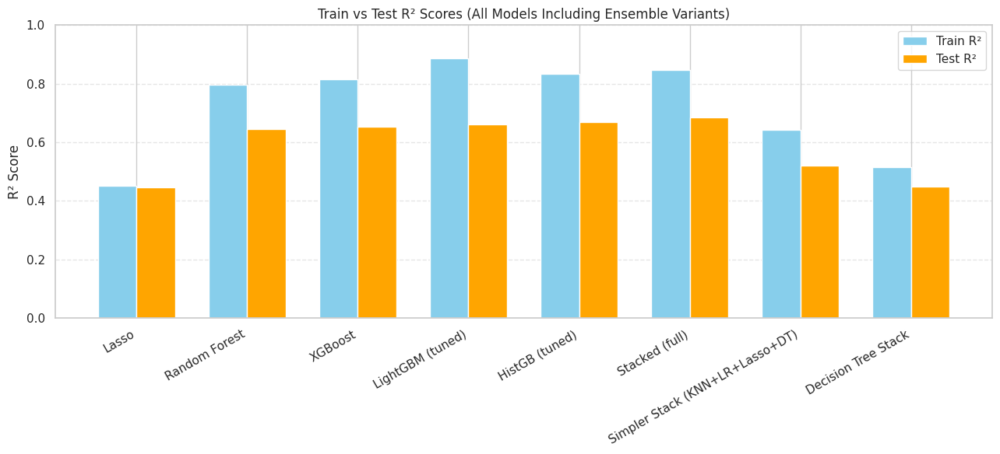

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# --- Model names including all ensembles and simpler stack ---
model_names = [
    "Lasso",
    "Random Forest",
    "XGBoost",
    "LightGBM (tuned)",
    "HistGB (tuned)",
    "Stacked (full)",
    "Simpler Stack (KNN+LR+Lasso+DT)",
    "Decision Tree Stack"
]

# --- Corresponding R² Scores ---
r2_train_scores = [
    0.452,  # Lasso
    0.796,  # Random Forest
    0.814,  # XGBoost
    0.888,  # LightGBM
    0.833,  # HistGB
    0.848,  # Full Stacked
    0.643,  # Simpler Stack
    0.516   # Decision Tree Stack
]

r2_test_scores = [
    0.445,  # Lasso
    0.644,  # Random Forest
    0.652,  # XGBoost
    0.661,  # LightGBM
    0.669,  # HistGB
    0.684,  # Full Stacked
    0.521,  # Simpler Stack
    0.449   # Decision Tree Stack
]

# --- Plotting ---
x = np.arange(len(model_names))
width = 0.35

plt.figure(figsize=(13, 6))
plt.bar(x - width/2, r2_train_scores, width, label='Train R²', color='skyblue')
plt.bar(x + width/2, r2_test_scores, width, label='Test R²', color='orange')

plt.xticks(x, model_names, rotation=30, ha='right')
plt.ylabel("R² Score")
plt.title("Train vs Test R² Scores (All Models Including Ensemble Variants)")
plt.ylim(0, 1)
plt.legend()
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()

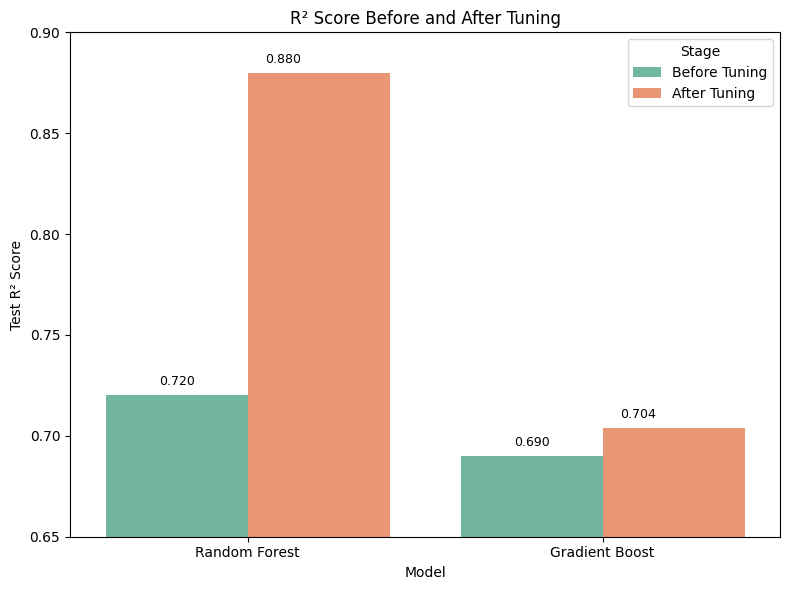

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Data for plotting
data = {
    'Model': ['Random Forest', 'Random Forest', 'Gradient Boost', 'Gradient Boost'],
    'R² Score': [0.72, 0.88, 0.69, 0.704],
    'Stage': ['Before Tuning', 'After Tuning', 'Before Tuning', 'After Tuning']
}

df_r2 = pd.DataFrame(data)

# Bar plot
plt.figure(figsize=(8, 6))
sns.barplot(data=df_r2, x='Model', y='R² Score', hue='Stage', palette='Set2')

# Labels and title
plt.title('R² Score Before and After Tuning')
plt.ylim(0.65, 0.9)
plt.ylabel('Test R² Score')
plt.xlabel('Model')

# Show values on bars
for index, row in df_r2.iterrows():
    plt.text(
        x=index // 2 + (0.05 if row['Stage'] == 'After Tuning' else -0.25), 
        y=row['R² Score'] + 0.005,
        s=f"{row['R² Score']:.3f}",
        fontsize=9
    )

plt.tight_layout()
plt.show()
